In [4]:
from sklearn.metrics import root_mean_squared_error, accuracy_score, precision_recall_fscore_support
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.feature_selection import SelectKBest, chi2, RFE, mutual_info_regression
from tensorflow.keras.layers import Dense, LSTM, Dropout
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from sklearn.svm import SVC, LinearSVC
from keras.utils import to_categorical
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import pandas as pd
import numpy as np
import joblib

# Feature Engineering

First, we will load the data into our DataFrame. Sort by date and denote which Season each match corresponds to. 

In [6]:
data_dir = "finalData.csv"
df = pd.read_csv(data_dir)

In [7]:
# renaming the columns
df.columns = ['Date', 'Home Team', 'Away Team', 'Full Time Home Goals', 'Full Time Away Goals', 'Full Time Result',       
'Half Time Home Goals', 'Half Time Away Goals', 'Half Time Result', 'Referee', 'Home Shots', 'Away Shots', 'Home Shots on Target',   
'Away Shots on Target', 'Home Corners', 'Away Corners', 'Home Fouls', 'Away Fouls', 'Home Yellow Cards', 'Away Yellow Cards',     
'Home Red Cards', 'Away Red Cards', 'Home Possession', 'Away Possession', 'Home Passes Completed', 'Home Passes PCT',
'Home Progressive Passes', 'Home Progressive Passing Distance', 'Home xG', 'Home Take Ons Won', 'Home Take Ons', 
'Home Interceptions', 'Home Blocks', 'Home Touches', 'Home Touches Def 3rd', 'Home Touches Mid 3rd', 'Home Touches Att 3rd',
'Home Carries', 'Home Carries Progressive Distance', 'Home Tackles', 'Home Tackles Won', 'Away Passes Completed',
'Away Passes PCT', 'Away Progressive Passes', 'Away Progressive Passing Distance', 'Away xG',
'Away Take Ons Won', 'Away Take Ons', 'Away Interceptions', 'Away Blocks', 'Away Touches', 'Away Touches Def 3rd',
'Away Touches Mid 3rd', 'Away Touches Att 3rd', 'Away Carries', 'Away Carries Progressive Distance', 'Away Tackles',
'Away Tackles Won']

In [8]:
# ensure sorted by date
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df.sort_values(by='Date')

# each season starts at 08 and ends at 05 of next year - 2000-2001 season will be the 2000 season
def get_season(date):
    if date.month >= 8:  
        return (date.year)
    else:  
        return (date.year - 1)

df['Season'] = df['Date'].apply(get_season)
df['Match Outcome'] = df['Full Time Result'].map({'H': 1, 'D': 0, 'A': -1})

Here, we begin engineering new features. The following function enables us to find the previous matches a team played (within this or the previous season). Using this key function, we created several features:

Average Goal Conversion Rate Difference, Average Attacking Intensity Difference, Average Disciplinary Pressure Difference, Recent Performances, Average Goals Scored Difference, Average Goals Conceded Difference, ...

Note: All averages use the previous RECENCY_NUM matches. If the number of previous matches in this season is too few, it will draw from the previous season as well. 

Note 2: After feature engineering, we will have to remove 101 matches that do not have RECENCY_NUM=5 matches prior. Unfortunately, this will reduce our dataset by 3.66%.

In [9]:
RECENCY_NUM = 5

In [10]:
# Team Points = total points in the game. win:3, draw:1, loss:0... DROPPED AFTERWARDS
# Total Points = cumulative sum of the team points, per team, per season
# Point Difference = difference between total points of the teams, per match
def calculate_season_points(df):
    df['Home Team Points'] = 0
    df['Away Team Points'] = 0

    for idx, row in df.iterrows():
        if row['Match Outcome'] == 1:  
            df.at[idx, 'Home Team Points'] = 3
            df.at[idx, 'Away Team Points'] = 0
        elif row['Match Outcome'] == 0: 
            df.at[idx, 'Home Team Points'] = 1
            df.at[idx, 'Away Team Points'] = 1
        elif row['Match Outcome'] == -1:  
            df.at[idx, 'Home Team Points'] = 0
            df.at[idx, 'Away Team Points'] = 3

    df['Home Total Seasonal Points'] = (df.groupby(['Home Team', 'Season'])['Home Team Points'].cumsum())
    df['Away Total Seasonal Points'] = (df.groupby(['Away Team', 'Season'])['Away Team Points'].cumsum())
    # df['Seasonal Point Difference'] = df['Home Total Seasonal Points'] - df['Away Total Seasonal Points']
    # df.drop(columns=['Home Team Points', 'Away Team Points'], inplace=True)

    return df
df = calculate_season_points(df)

In [11]:
def standardisation(df, terms=['Difference Average Goals Scored Last X Games', 'Difference Average Goals Conceded Last X Games', 'Point Difference', 'xG Difference']):
    scaler = StandardScaler()
    df[terms] = scaler.fit_transform(df[terms])
    return df

# normalises a specific set of columns
def normalisation(df, terms=['Difference Average Goals Scored Last X Games', 'Difference Average Goals Conceded Last X Games', 'Point Difference', 'xG Difference']):
    scaler = MinMaxScaler()
    df[terms] = scaler.fit_transform(df[terms])
    return df

# label encoding - use for boosting models
def label_encoding(df, col=['Home Team', 'Away Team'], dataframe=True):
    label_encoder = LabelEncoder()
    if dataframe:
        for c in col:
            df[c] = label_encoder.fit_transform(df[c])
    else:
        df = label_encoder.fit_transform(df)
    return df

Explained Variance Ratio:  [3.16576232e-01 8.45400333e-02 5.77480471e-02 4.98413595e-02
 3.97925540e-02 3.75659122e-02 3.41837323e-02 3.31313049e-02
 2.44209614e-02 2.42266364e-02 2.10247585e-02 1.90175701e-02
 1.81513320e-02 1.75881751e-02 1.65469751e-02 1.53220145e-02
 1.47904115e-02 1.39839348e-02 1.30258432e-02 1.25829526e-02
 1.18487923e-02 1.10295738e-02 1.02416566e-02 9.20479283e-03
 8.43066550e-03 7.85997645e-03 7.05260791e-03 6.22120658e-03
 5.48273633e-03 4.98185979e-03 4.62467530e-03 4.33793785e-03
 4.22584095e-03 4.05631205e-03 3.62936796e-03 3.54816995e-03
 3.00574141e-03 2.89590597e-03 2.75576708e-03 2.51615232e-03
 2.50223162e-03 2.20056031e-03 2.13312656e-03 1.82915504e-03
 1.59959876e-03 1.57101208e-03 1.52742630e-03 1.23717945e-03
 1.17426109e-03 1.06742370e-03 7.73061379e-04 2.30962891e-04
 1.20645223e-04 1.70988808e-05 2.93059148e-06 2.73610511e-06
 1.10141878e-07 0.00000000e+00]
Number of components to retain 95% variance: 31


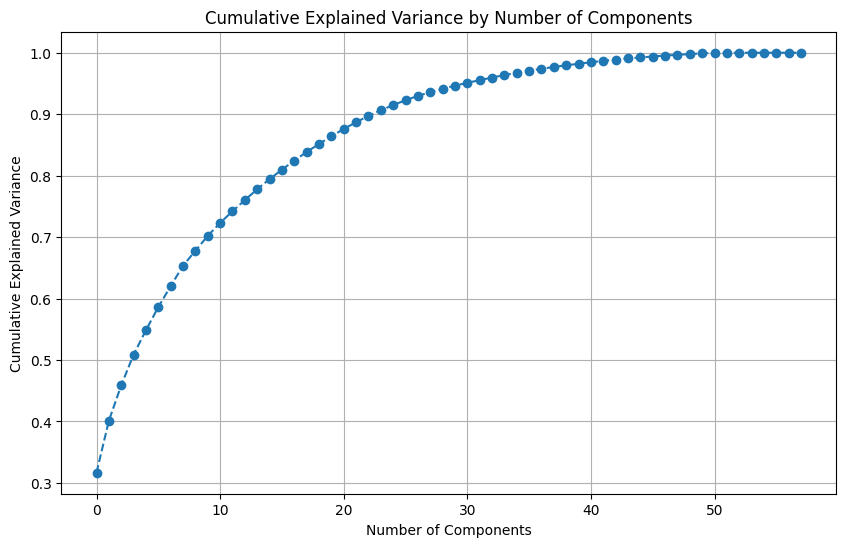

In [12]:
def pca(df):
    # drop the irrelevant terms
    featuresToDrop = ['Date', 'Home Team', 'Away Team', 'Full Time Result', 'Half Time Result', 'Referee']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    df2 = df.drop(featuresToDrop, axis=1)
    
    df2 = standardisation(df2, terms=list(df2.columns))
    
    pca = PCA()
    pca_components = pca.fit_transform(df2)
    
    # find the explained variance ratio
    explained_variance = pca.explained_variance_ratio_
    print("Explained Variance Ratio: ", explained_variance)

    # select number of components based on explained variance (e.g., 95% variance)
    cumulative_variance = explained_variance.cumsum()
    n_components = next(i for i, v in enumerate(cumulative_variance) if v >= 0.95) + 1
    print(f"Number of components to retain 95% variance: {n_components}")

    # visualize explained variance
    plt.figure(figsize=(10, 6))
    plt.plot(cumulative_variance, marker='o', linestyle='--')
    plt.title('Cumulative Explained Variance by Number of Components')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.grid()
    plt.show()
    
    return n_components
    
number_of_components = pca(df)

Next, we reduced the feature data set to 5 sections of inputs: Home Advantage, Attacking Strength, Midfield Strength, Defensive Strength, and extras. 

Discarded features include: 

'Half Time Home Goals', 'Half Time Away Goals', 'Half Time Result', 'Referee', 'Home Shots', 'Away Shots', 'Home Fouls', 'Away Fouls', 'Home Yellow Cards', 'Away Yellow Cards', 'Home Red Cards', 'Away Red Cards', 'Home Possession', 'Away Possession', 'Home Progressive Passing Distance', 'Home xG', 'Home Take Ons', 'Home Touches', 'Home Touches Def 3rd', 'Home Carries Progressive Distance', 'Away Progressive Passing Distance', 'Away xG', 'Away Take Ons', 'Away Touches', 'Away Touches Def 3rd', 'Away Carries Progressive Distance', 'Season', 'Home Team Points', 'Away Team Points', 'Home Total Seasonal Points', 'Away Total Seasonal Points'

In [13]:
features = [
    # Home Advantage
    "Home Team",
    "Away Team",
    "Match Outcome",
    "Full Time Home Goals",
    "Full Time Away Goals",
    
    # Attacking Strength
    "Home Shots on Target", "Away Shots on Target",
    "Home Progressive Passes", "Away Progressive Passes",
    "Home Touches Att 3rd", "Away Touches Att 3rd",
    "Home Take Ons Won", "Away Take Ons Won",
    "Home Corners", "Away Corners",
    
    # Midfield Strength
    "Home Touches Mid 3rd", "Away Touches Mid 3rd",
    "Home Passes Completed", "Away Passes Completed",
    "Home Passes PCT", "Away Passes PCT",
    "Home Carries", "Away Carries",
    
    # Defensive Strength
    "Home Tackles", "Away Tackles",
    "Home Tackles Won", "Away Tackles Won",
    "Home Blocks", "Away Blocks",
    "Home Interceptions", "Away Interceptions",
    
    # Extra
    "Full Time Result",
    'Date'
]

new_df = df[features].copy()
new_df.dropna(inplace=True)

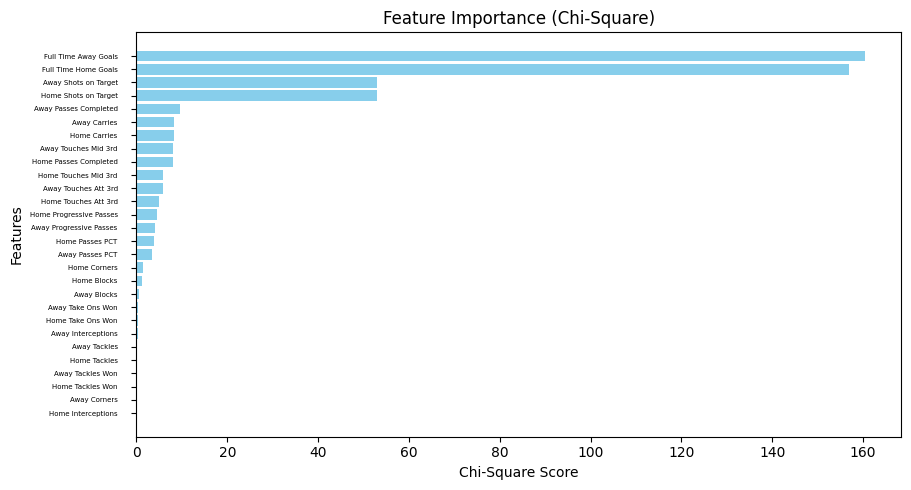

In [14]:
def chi_square(df):
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Home Team', 'Full Time Result', 'Away Team', 'Match Outcome']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    df['Match Outcome'] = df['Full Time Result'].map({'H': 1, 'D': 0, 'A': -1})
    target = df['Match Outcome']
    
    # chi2 scoring function requires non-negative input: normalisation
    data = normalisation(data, terms=list(data.columns))
    
    # collect the feature names
    feature_names = list(data.columns)
    
    # perform chi square selection    
    chi_select = SelectKBest(chi2, k=min(number_of_components, len(data.columns)))
    new_data = chi_select.fit_transform(data, target)
    
    # collect features
    selected_features = []
    for i, b in enumerate(chi_select.get_support()):
        if b:
            selected_features.append(feature_names[i])
    
    # get the chi-square scores for all features
    chi_scores = chi_select.scores_

    # create a dataFrame for easy visualization
    chi2_df = pd.DataFrame({'Feature': feature_names, 'Chi-Square Score': chi_scores})
    chi2_df = chi2_df.sort_values(by='Chi-Square Score', ascending=False)

    # plot the scores
    plt.figure(figsize=(10, 5))
    colours = ['skyblue' if i < number_of_components else 'gray' for i in range(len(chi2_df))]
    plt.barh(chi2_df['Feature'], chi2_df['Chi-Square Score'], color=colours)
    plt.xlabel('Chi-Square Score')
    plt.ylabel('Features')
    plt.title('Feature Importance (Chi-Square)')
    plt.gca().invert_yaxis()  # Invert y-axis to show the highest scores at the top
    plt.tight_layout()
    plt.tick_params(axis="y", pad=10, labelsize=5)
    plt.show()
    
    return chi2_df
    
chi2_df = chi_square(new_df)   

Now we will take the feature importance scores from the Chi-Square distribution and adjust the weights to approach a gradual steady decline. This will allow the less important features to contribute to our feature engineering later while preserving a hierarchical ranking. 

Note: the number 1/3 was chosen arbitrarily but it was observed to be a standard heuristic among Machine Learning papers.

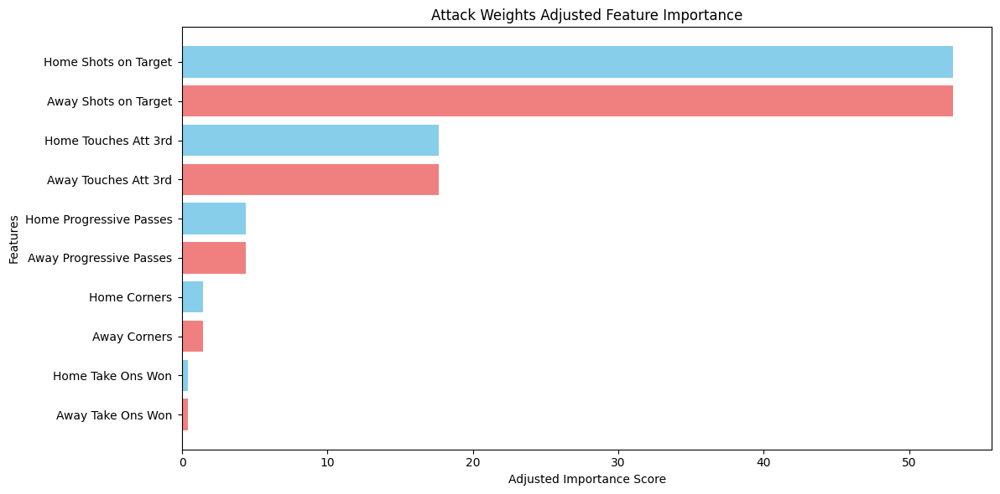

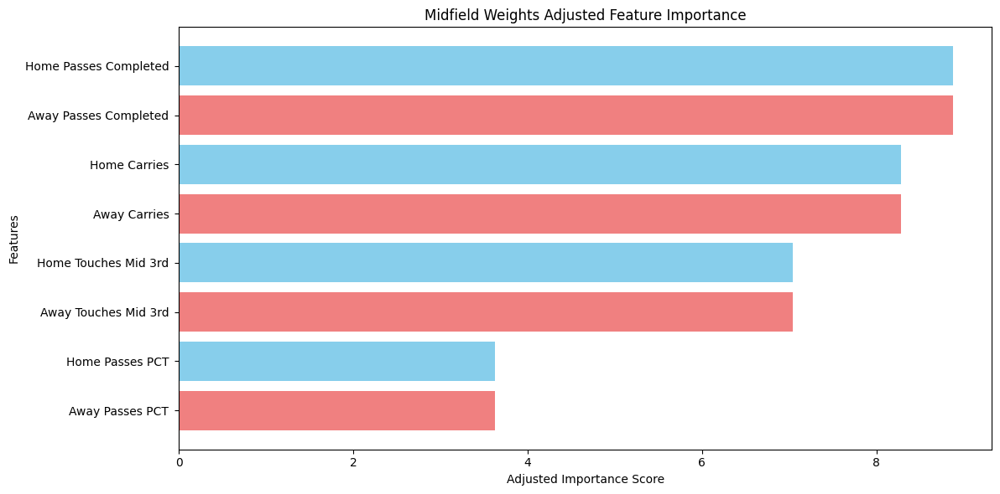

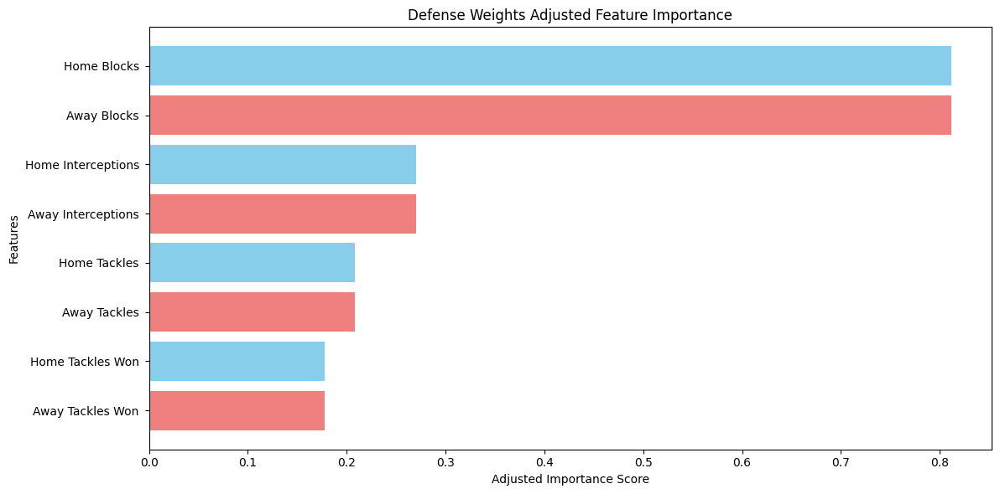

In [15]:
def adjust_feature_weights(features, chi2_df):
    # Aggregate Home and Away importance scores
    aggregated_scores = {}
    for feature_pair in features:
        home_feature, away_feature = feature_pair
        home_score = chi2_df.loc[chi2_df['Feature'] == home_feature, 'Chi-Square Score'].values[0]
        away_score = chi2_df.loc[chi2_df['Feature'] == away_feature, 'Chi-Square Score'].values[0]
        aggregated_scores[feature_pair] = home_score + away_score

    # Sort features by aggregated importance
    sorted_features = sorted(aggregated_scores.items(), key=lambda x: x[1], reverse=True)
    
    # Adjust scores using the /3 rule
    adjusted_scores = {}
    adjusted_scores[sorted_features[0][0]] = sorted_features[0][1]  # Most important feature remains unchanged
    
    for i in range(1, len(sorted_features)):
        current_feature, current_score = sorted_features[i]
        previous_feature, previous_score = sorted_features[i - 1]
        
        if current_score < previous_score / 3:
            current_score = previous_score / 3
        adjusted_scores[current_feature] = current_score

    # Assign adjusted scores equally to Home and Away features
    final_weights = {}
    for feature_pair, score in adjusted_scores.items():
        home_feature, away_feature = feature_pair
        final_weights[home_feature] = score / 2
        final_weights[away_feature] = score / 2
    
    return final_weights

def plot_adjusted_features(weights, title):
    # prepare data for plotting
    features = list(weights.keys())
    importance = list(weights.values())

    # create the plot
    plt.figure(figsize=(12, 6))
    colours = ['skyblue' if 'Home' in feature else 'lightcoral' for feature in features]
    plt.barh(features, importance, color=colours)

    # customize the plot
    plt.xlabel('Adjusted Importance Score')
    plt.ylabel('Features')
    plt.title(title)
    plt.gca().invert_yaxis()  # highest scores at the top
    plt.tight_layout()
    plt.tick_params(axis="y", pad=5, labelsize=10)  # adjust y-axis label size for better visibility
    plt.show()


def create_strength_features_separate(df, chi2_df):
    # Define feature pairs for each group
    attack_features = [
        ("Home Shots on Target", "Away Shots on Target"),
        ("Home Progressive Passes", "Away Progressive Passes"),
        ("Home Touches Att 3rd", "Away Touches Att 3rd"),
        ("Home Take Ons Won", "Away Take Ons Won"),
        ("Home Corners", "Away Corners")
    ]
    midfield_features = [
        ("Home Touches Mid 3rd", "Away Touches Mid 3rd"),
        ("Home Passes Completed", "Away Passes Completed"),
        ("Home Passes PCT", "Away Passes PCT"),
        ("Home Carries", "Away Carries")
    ]
    defense_features = [
        ("Home Tackles", "Away Tackles"),
        ("Home Tackles Won", "Away Tackles Won"),
        ("Home Blocks", "Away Blocks"),
        ("Home Interceptions", "Away Interceptions")
    ]
    
    # Adjust weights for each group
    attack_weights = adjust_feature_weights(attack_features, chi2_df)
    midfield_weights = adjust_feature_weights(midfield_features, chi2_df)
    defense_weights = adjust_feature_weights(defense_features, chi2_df)
    
    plot_adjusted_features(attack_weights, "Attack Weights Adjusted Feature Importance")
    plot_adjusted_features(midfield_weights, "Midfield Weights Adjusted Feature Importance")
    plot_adjusted_features(defense_weights, "Defense Weights Adjusted Feature Importance")
    
    # Calculate strength scores for Home and Away
    def calculate_strength(feature_pairs, weights, team_type):
        strength_score = 0
        for home_feature, away_feature in feature_pairs:
            feature = home_feature if team_type == "Home" else away_feature
            strength_score += df[feature] * weights[feature]
        return strength_score

    # Compute Home and Away strengths for Attack, Midfield, and Defense
    df['Home Attack Strength'] = calculate_strength(attack_features, attack_weights, "Home")
    df['Away Attack Strength'] = calculate_strength(attack_features, attack_weights, "Away")
    df['Home Midfield Strength'] = calculate_strength(midfield_features, midfield_weights, "Home")
    df['Away Midfield Strength'] = calculate_strength(midfield_features, midfield_weights, "Away")
    df['Home Defense Strength'] = calculate_strength(defense_features, defense_weights, "Home")
    df['Away Defense Strength'] = calculate_strength(defense_features, defense_weights, "Away")
    
    return df



strength_df = create_strength_features_separate(new_df, chi2_df)

In [16]:
def avg_stats_last_x_games(df):
    
    def calculate_running_avg(stats_list, x):
        if len(stats_list) < x:
            return None
        return sum(stats_list[-x:]) / x

    metrics = ['Goals Scored', 'Goals Conceded', 'Attack Strength', 'Midfield Strength', 'Defense Strength', 'Recent Performance']# , 'xG', 'Disciplinary Pressure']
    for metric in metrics:
        for x in range(1, RECENCY_NUM + 1):
            df[f'Avg {metric} Home Last {x} Games'] = None
            df[f'Avg {metric} Away Last {x} Games'] = None
    running_stats = {}

    for idx, row in df.iterrows():
        for team_type in ['Home Team', 'Away Team']:
            team = row[team_type]
            stat_type = team_type.split()[0]  # Home or Away

            if team not in running_stats:
                running_stats[team] = {
                    'Goals Scored': [],
                    'Goals Conceded': [],
                    'Attack Strength': [],
                    'Midfield Strength': [],
                    'Defense Strength': [],
                    #'Disciplinary Pressure': [],
                    'Recent Performance': []
                }

            team_stats = running_stats[team]

            for x in range(1, RECENCY_NUM + 1):
                for metric in metrics:
                    avg_stat = calculate_running_avg(team_stats[metric], x)
                    df.at[idx, f'Avg {metric} {stat_type} Last {x} Games'] = avg_stat
            team_stats['Goals Scored'].append(row['Full Time Home Goals'] if stat_type == 'Home' else row['Full Time Away Goals'])
            team_stats['Goals Conceded'].append(row['Full Time Away Goals'] if stat_type == 'Home' else row['Full Time Home Goals'])
            team_stats['Attack Strength'].append(row['Home Attack Strength'] if stat_type == 'Home' else row['Away Attack Strength'])
            team_stats['Midfield Strength'].append(row['Home Midfield Strength'] if stat_type == 'Home' else row['Away Midfield Strength'])
            team_stats['Defense Strength'].append(row['Home Defense Strength'] if stat_type == 'Home' else row['Away Defense Strength'])
            #team_stats['xG'].append(row['xG Home'] if stat_type == 'Home' else row['xG Away'])
            #team_stats['Disciplinary Pressure'].append(row['Home Disciplinary Pressure'] if stat_type == 'Home' else row['Away Disciplinary Pressure'])
            team_stats['Recent Performance'].append(1 if (row['Full Time Result'] == 'H' and stat_type == 'Home') or (row['Full Time Result'] == 'A' and stat_type == 'Away') else 0.5 if row['Full Time Result'] == 'D' else 0)
    return df

df = avg_stats_last_x_games(strength_df)
df.dropna(inplace=True)    # removes the matches without enough X previous data

The below code fixes our dataset to only include Recency features.

In [17]:
features = [
    'Avg Goals Scored Home Last 1 Games',
       'Avg Goals Scored Away Last 1 Games',
       'Avg Goals Scored Home Last 2 Games',
       'Avg Goals Scored Away Last 2 Games',
       'Avg Goals Scored Home Last 3 Games',
       'Avg Goals Scored Away Last 3 Games',
       'Avg Goals Scored Home Last 4 Games',
       'Avg Goals Scored Away Last 4 Games',
       'Avg Goals Scored Home Last 5 Games',
       'Avg Goals Scored Away Last 5 Games',
       'Avg Goals Conceded Home Last 1 Games',
       'Avg Goals Conceded Away Last 1 Games',
       'Avg Goals Conceded Home Last 2 Games',
       'Avg Goals Conceded Away Last 2 Games',
       'Avg Goals Conceded Home Last 3 Games',
       'Avg Goals Conceded Away Last 3 Games',
       'Avg Goals Conceded Home Last 4 Games',
       'Avg Goals Conceded Away Last 4 Games',
       'Avg Goals Conceded Home Last 5 Games',
       'Avg Goals Conceded Away Last 5 Games',
       'Avg Attack Strength Home Last 1 Games',
       'Avg Attack Strength Away Last 1 Games',
       'Avg Attack Strength Home Last 2 Games',
       'Avg Attack Strength Away Last 2 Games',
       'Avg Attack Strength Home Last 3 Games',
       'Avg Attack Strength Away Last 3 Games',
       'Avg Attack Strength Home Last 4 Games',
       'Avg Attack Strength Away Last 4 Games',
       'Avg Attack Strength Home Last 5 Games',
       'Avg Attack Strength Away Last 5 Games',
       'Avg Midfield Strength Home Last 1 Games',
       'Avg Midfield Strength Away Last 1 Games',
       'Avg Midfield Strength Home Last 2 Games',
       'Avg Midfield Strength Away Last 2 Games',
       'Avg Midfield Strength Home Last 3 Games',
       'Avg Midfield Strength Away Last 3 Games',
       'Avg Midfield Strength Home Last 4 Games',
       'Avg Midfield Strength Away Last 4 Games',
       'Avg Midfield Strength Home Last 5 Games',
       'Avg Midfield Strength Away Last 5 Games',
       'Avg Defense Strength Home Last 1 Games',
       'Avg Defense Strength Away Last 1 Games',
       'Avg Defense Strength Home Last 2 Games',
       'Avg Defense Strength Away Last 2 Games',
       'Avg Defense Strength Home Last 3 Games',
       'Avg Defense Strength Away Last 3 Games',
       'Avg Defense Strength Home Last 4 Games',
       'Avg Defense Strength Away Last 4 Games',
       'Avg Defense Strength Home Last 5 Games',
       'Avg Defense Strength Away Last 5 Games',
       'Avg Recent Performance Home Last 1 Games',
       'Avg Recent Performance Away Last 1 Games',
       'Avg Recent Performance Home Last 2 Games',
       'Avg Recent Performance Away Last 2 Games',
       'Avg Recent Performance Home Last 3 Games',
       'Avg Recent Performance Away Last 3 Games',
       'Avg Recent Performance Home Last 4 Games',
       'Avg Recent Performance Away Last 4 Games',
       'Avg Recent Performance Home Last 5 Games',
       'Avg Recent Performance Away Last 5 Games',
       'Home Team',
       'Match Outcome',
       'Date'
]
df = df[features]

# Feature Selection

In [18]:
with pd.option_context('display.max_rows', 10, 'display.max_columns', None): 
    display(df)

,Avg Goals Scored Home Last 1 Games,Avg Goals Scored Away Last 1 Games,Avg Goals Scored Home Last 2 Games,Avg Goals Scored Away Last 2 Games,Avg Goals Scored Home Last 3 Games,Avg Goals Scored Away Last 3 Games,Avg Goals Scored Home Last 4 Games,Avg Goals Scored Away Last 4 Games,Avg Goals Scored Home Last 5 Games,Avg Goals Scored Away Last 5 Games,Avg Goals Conceded Home Last 1 Games,Avg Goals Conceded Away Last 1 Games,Avg Goals Conceded Home Last 2 Games,Avg Goals Conceded Away Last 2 Games,Avg Goals Conceded Home Last 3 Games,Avg Goals Conceded Away Last 3 Games,Avg Goals Conceded Home Last 4 Games,Avg Goals Conceded Away Last 4 Games,Avg Goals Conceded Home Last 5 Games,Avg Goals Conceded Away Last 5 Games,Avg Attack Strength Home Last 1 Games,Avg Attack Strength Away Last 1 Games,Avg Attack Strength Home Last 2 Games,Avg Attack Strength Away Last 2 Games,Avg Attack Strength Home Last 3 Games,Avg Attack Strength Away Last 3 Games,Avg Attack Strength Home Last 4 Games,Avg Attack Strength Away Last 4 Games,Avg Attack Strength Home Last 5 Games,Avg Attack Strength Away Last 5 Games,Avg Midfield Strength Home Last 1 Games,Avg Midfield Strength Away Last 1 Games,Avg Midfield Strength Home Last 2 Games,Avg Midfield Strength Away Last 2 Games,Avg Midfield Strength Home Last 3 Games,Avg Midfield Strength Away Last 3 Games,Avg Midfield Strength Home Last 4 Games,Avg Midfield Strength Away Last 4 Games,Avg Midfield Strength Home Last 5 Games,Avg Midfield Strength Away Last 5 Games,Avg Defense Strength Home Last 1 Games,Avg Defense Strength Away Last 1 Games,Avg Defense Strength Home Last 2 Games,Avg Defense Strength Away Last 2 Games,Avg Defense Strength Home Last 3 Games,Avg Defense Strength Away Last 3 Games,Avg Defense Strength Home Last 4 Games,Avg Defense Strength Away Last 4 Games,Avg Defense Strength Home Last 5 Games,Avg Defense Strength Away Last 5 Games,Avg Recent Performance Home Last 1 Games,Avg Recent Performance Away Last 1 Games,Avg Recent Performance Home Last 2 Games,Avg Recent Performance Away Last 2 Games,Avg Recent Performance Home Last 3 Games,Avg Recent Performance Away Last 3 Games,Avg Recent Performance Home Last 4 Games,Avg Recent Performance Away Last 4 Games,Avg Recent Performance Home Last 5 Games,Avg Recent Performance Away Last 5 Games,Home Team,Match Outcome,Date
57,0.0,0.0,1.0,1.5,0.666667,1.333333,1.0,1.25,0.8,1.4,0.0,0.0,0.0,0.0,1.0,0.333333,1.5,0.75,2.0,0.6,2338.563864,7373.499636,2480.428027,5420.357247,2232.737788,5131.90289,2154.108463,4959.84971,2151.336594,4893.869181,9966.264294,14078.308575,7911.069366,10949.478857,8210.662851,11129.487086,7357.184523,11062.908373,7357.331228,11618.959617,8.503162,11.108236,15.674027,16.099665,15.468728,14.20933,15.062963,14.087415,16.418074,13.410971,0.5,0.5,0.75,0.75,0.5,0.666667,0.375,0.5,0.3,0.6,West Ham United,-1,2017-09-23
56,0.0,0.0,0.0,1.0,0.666667,0.666667,0.5,1.0,0.4,1.4,0.0,6.0,0.5,3.0,0.333333,2.0,1.25,1.5,1.0,1.8,981.719859,1409.002863,2212.388455,1921.923694,1998.655882,1986.03605,2131.178964,2312.735455,1927.824662,2321.983637,4306.124079,5945.601339,6941.381047,6525.882203,7454.622055,6494.387607,7523.299544,6589.574534,7189.7858,6713.116751,15.506406,20.126662,15.108822,21.860725,13.885335,19.746259,13.822637,19.474988,16.294055,19.83039,0.5,0.0,0.25,0.5,0.5,0.5,0.375,0.625,0.4,0.6,Swansea City,-1,2017-09-23
55,1.0,0.0,1.5,1.0,1.333333,1.333333,1.25,1.5,1.0,1.6,2.0,0.0,2.0,0.5,1.666667,0.333333,1.25,0.5,1.2,1.0,3143.343423,3193.083198,2489.198205,3425.108024,2828.755944,3596.765804,2485.235746,3086.067493,2508.728005,3294.971571,8207.975774,9568.581496,7373.180629,9574.058484,7768.177311,10075.528842,6741.590343,8846.887939,6439.217422,8997.809685,14.014933,20.186142,15.963085,17.254293,14.669081,16.076753,15.864435,19.387839,16.791959,17.673258,0.0,0.5,0.25,0.75,0.333333,0.833333,0.5,0.875,0.4,0.7,Stoke City,-1,2017-09-23
54,1.0,4.0,0.5,3.0,0.333333,2.666667,1.0,3.0,0.8,3.2,0.0,0.0,1.0,1.0,0.666667,0.666667,1.0,0.5,0.8,0.4,3212.678343,4268

The first method of feature selection that we will look at is Recursive Feature Engineering. This (supervised) wrapper method starts with the full model. RFE then uses the model’s feature importance (model weights, coefficients) to decide which feature to remove – recursively extracting features until the desired data table is reached. 

RFE fits the data to a specific model. Here we will look at feature selection in regard to Logistic Regression. Because of this model selection, our data is standardised beforehand. 

Selected Features by RFE (LR):
['Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Home Last 3 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Recent Performance Home Last 1 G

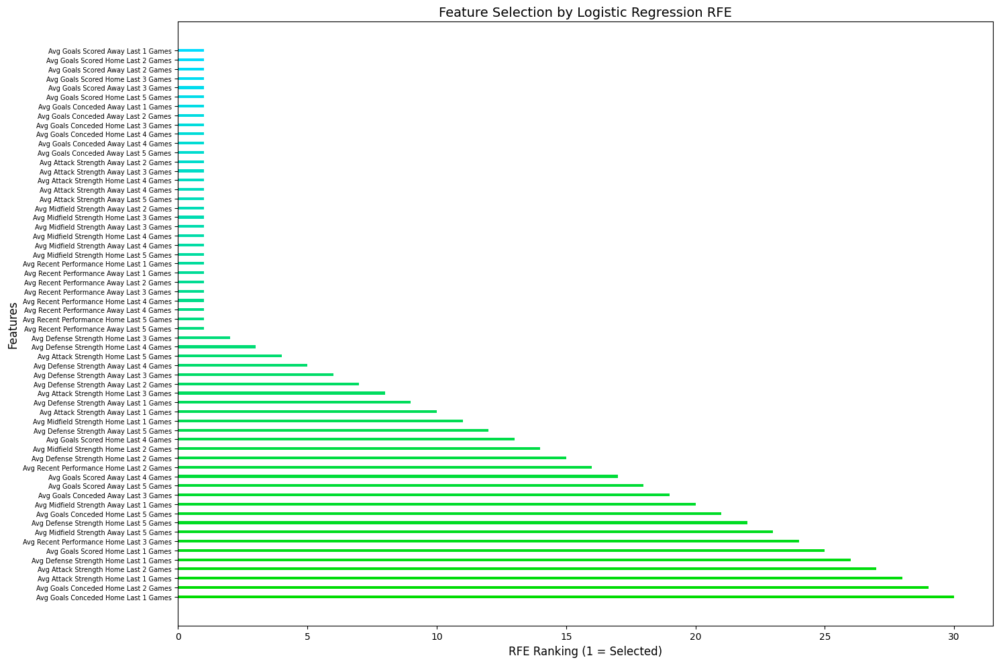

In [19]:
def recursive_feature_elimination_LR(df):
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    target = df['Match Outcome']
    
    data = standardisation(data, terms=list(data.columns))
    
    # collect the feature names
    feature_names = list(data.columns)
        
    # perform RFE
    rfe = RFE(estimator=LogisticRegression(max_iter=500), n_features_to_select=number_of_components) # taken from PCA
    rfe.fit(data, target)
    
    # get feature rankings and selected features
    feature_ranking = rfe.ranking_
    selected_features = [feature for feature, rank in zip(feature_names, feature_ranking) if rank == 1]
    
    print("Selected Features by RFE (LR):")
    print(selected_features)
    
    # plot feature rankings
    plt.figure(figsize=(15, 10))
    sorted_features = sorted(zip(feature_names, feature_ranking), key=lambda x: x[1])
    sorted_names, sorted_ranks = zip(*sorted_features)

    # increase spacing between bars
    y_positions = np.arange(len(sorted_names)) * 2
    bar_height = 0.6

    # generate gradient colors from blue to green
    colors = [(0, 220/255, 1 - alpha) for alpha in np.linspace(0, 1, len(sorted_ranks))]

    # plot horizontal bar chart with gradient colors
    for ypos, rank, color in zip(y_positions, sorted_ranks, colors):
        plt.barh(ypos, rank, height=bar_height, color=color)

    plt.yticks(y_positions, sorted_names, fontsize=7)
    plt.xlabel("RFE Ranking (1 = Selected)", fontsize=12)
    plt.ylabel("Features", fontsize=12)
    plt.title("Feature Selection by Logistic Regression RFE", fontsize=14)

    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show() 
    
    return selected_features
            
    

logistic_features = recursive_feature_elimination_LR(df)

Next, we will look at feature selection methods for K Nearest Neighbours. As this model does not work with RFE, we will have to look at other methods. Predictions for KNN are based on the distance between data points and are therefore highly sensitive to redundant features. 

We will begin with Variance Thresholding (removing low variance features) and then apply a filter method Mutual Information (measuring non-linear relationships between the features and targets).

Variance Minimum:  0.013576172443849375  ---->  Variance Maximum:  0.19291592322287476


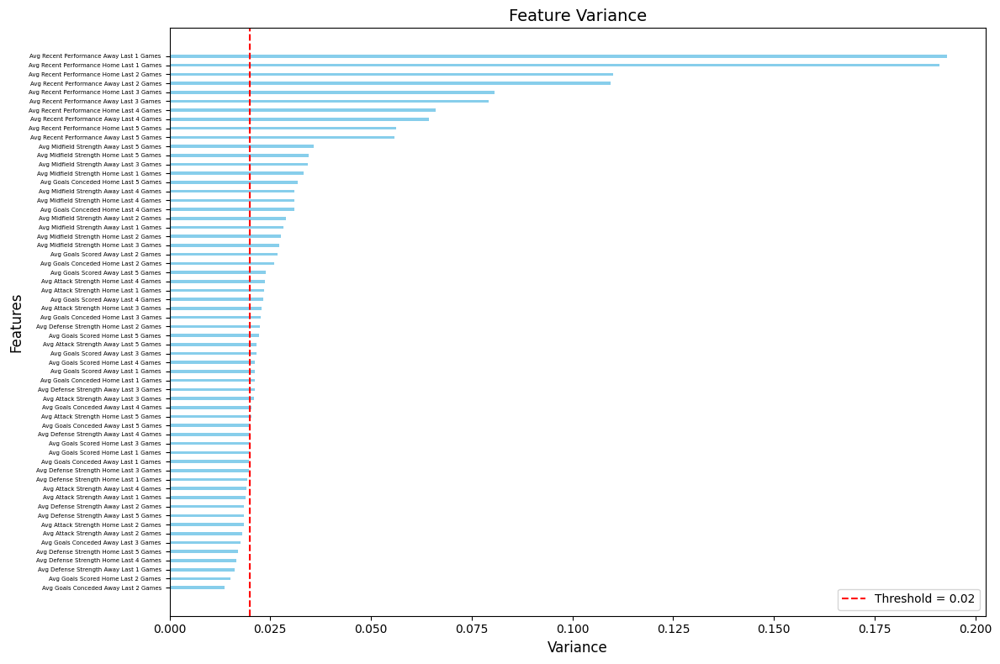

Reduced Data:  42 / 60

Removed Features and Their Variances:
---------------------------------------

Avg Defense Strength Away Last 4 Games    0.019936
Avg Goals Scored Home Last 3 Games        0.019916
Avg Goals Scored Home Last 1 Games        0.019838
Avg Goals Conceded Away Last 1 Games      0.019695
Avg Defense Strength Home Last 3 Games    0.019652
Avg Defense Strength Home Last 1 Games    0.019304
Avg Attack Strength Away Last 4 Games     0.019068
Avg Attack Strength Away Last 1 Games     0.018819
Avg Defense Strength Away Last 2 Games    0.018565
Avg Defense Strength Away Last 5 Games    0.018394
Avg Attack Strength Home Last 2 Games     0.018377
Avg Attack Strength Away Last 2 Games     0.018090
Avg Goals Conceded Away Last 3 Games      0.017666
Avg Defense Strength Home Last 5 Games    0.017037
Avg Defense Strength Home Last 4 Games    0.016667
Avg Defense Strength Away Last 1 Games    0.016143
Avg Goals Scored Home Last 2 Games        0.015106
Avg Goals Conceded Away Last 2

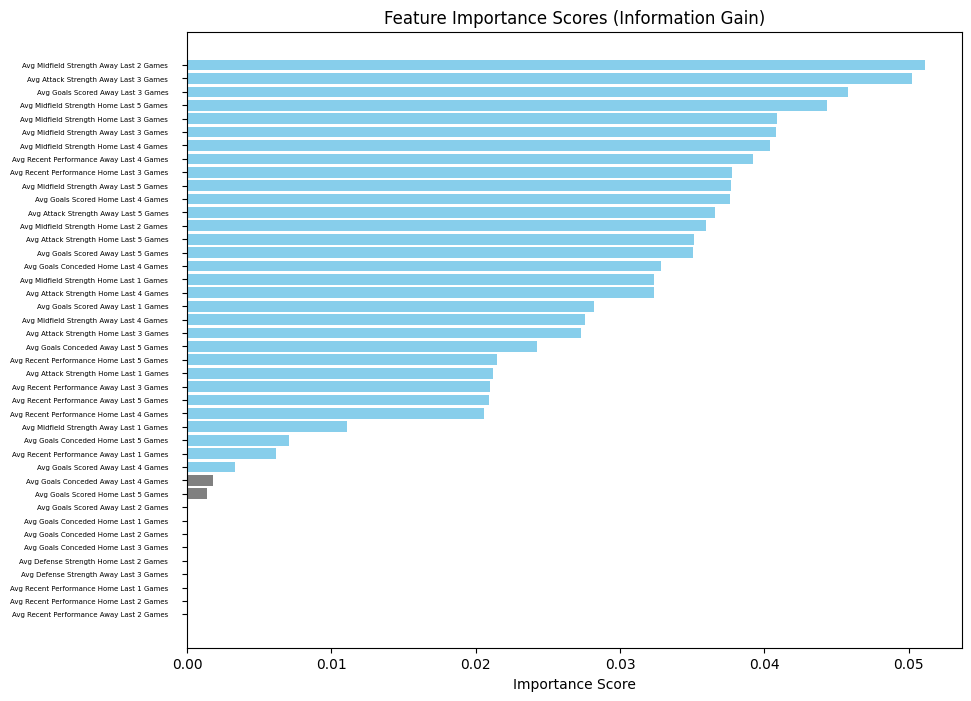


Selected Features for KNN:
['Avg Midfield Strength Away Last 2 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Recent Performance Away Last 4 Games', 'Avg Recent Performance Home Last 3 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Attack Strength Home Last 3 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Recent Performance Home Last 5 Games', 'Avg Attack Str

In [20]:
def knn_feature_selection(df):
    
    # first step is calculating minimal variance features
    def variance_thresholding(data, threshold=0.02):
        variances = data.var()
        print("Variance Minimum: ", variances.min(), " ---->  Variance Maximum: ", variances.max())
    
        # filter features based on the threshold
        retained_features = variances[variances >= threshold].index
        reduced_data = data[retained_features]
        sorted_variances = variances.sort_values(ascending=False)

        # plot horizontal bar graph for feature variances
        plt.figure(figsize=(12, 8))
        y_positions = np.arange(len(sorted_variances)) * 3  # increase spacing between bars
        plt.barh(y_positions, sorted_variances, color='skyblue', height=1.0)
        plt.gca().invert_yaxis()
        
        # add a threshold line
        plt.axvline(x=threshold, color='red', linestyle='--', label=f'Threshold = {threshold}')
        
        plt.yticks(y_positions, sorted_variances.index, fontsize=5)
        plt.xlabel('Variance', fontsize=12)
        plt.ylabel('Features', fontsize=12)
        plt.title('Feature Variance', fontsize=14)
        plt.legend(fontsize=10)
        plt.tight_layout()
        plt.show()
        

        # print removed features and their variances
        removed_features = sorted_variances[sorted_variances < threshold]
        print("Reduced Data: ", len(reduced_data.columns), "/", len(data.columns))
        print("\nRemoved Features and Their Variances:")
        print("---------------------------------------\n")
        print(removed_features, "\n")
        
        return reduced_data
    
    # second step is mutual information between features and target
    def mutual_info(data, target):
        # apply information gain
        gain = mutual_info_regression(data, target)

        # dictionary of feature importance scores
        feature_names = list(data.columns)
        scores = {}
        for i in range(len(feature_names)):
            scores[feature_names[i]] = gain[i]

        # descending sort by importance score
        sorted_features = sorted(scores.items(), key=lambda x:x[1], reverse=True)

#         print("\nMutual Information Importance Score: ")
#         print("------------------------------------\n")
#         for feature, score in sorted_features:
#             print(f"{feature + ' score:':55}\t{score:.16f}")

        # plot a bar chat of feature importance scores
        fig, ax = plt.subplots(figsize=(10, 8))
        y_pos = np.arange(len(sorted_features))
        colours = ['skyblue' if i < number_of_components else 'gray' for i in range(len(sorted_features))]
        ax.barh(y_pos, [score for feature, score in sorted_features], align="center", color=colours)
        ax.set_yticks(y_pos)
        ax.set_yticklabels([feature for feature, score in sorted_features])
        ax.invert_yaxis()  # Labels read top-to-bottom
        ax.set_xlabel("Importance Score")
        ax.set_title("Feature Importance Scores (Information Gain)")
        ax.tick_params(axis="y", pad=10, labelsize=5)
        plt.show()
        
        # returns most important features
        selected_features = [feature for feature, _ in sorted_features[:number_of_components]]
        print("\nSelected Features for KNN:")
        print(selected_features)
        return selected_features
        
    
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    
    # normalise the data to put all the variances on the same scale
    # otherwise the difference between variances would be 0.0558 to 8728992.4427
    data = normalisation(data, terms=list(data.columns))
    
    variance_data = variance_thresholding(data)
    
    # use label encoding on the target data, keep it discrete
    target = df['Match Outcome']
    target = label_encoding(target, dataframe=False)
    
    return mutual_info(variance_data, target)
    

knn_features = knn_feature_selection(df)

Next is Recursive Feature Engineering for SVM. It will be a repeat of the last function, this time using a SVM model for feature selection. 

Selected Features by RFE (SVM):
['Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last 3 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Defense Strength Home Last 3 Games', 'Avg Defense Strength Home Last 4 Games', 'Avg Defense Strength Away Last 4 Games', 'Avg Defense Strength Away La

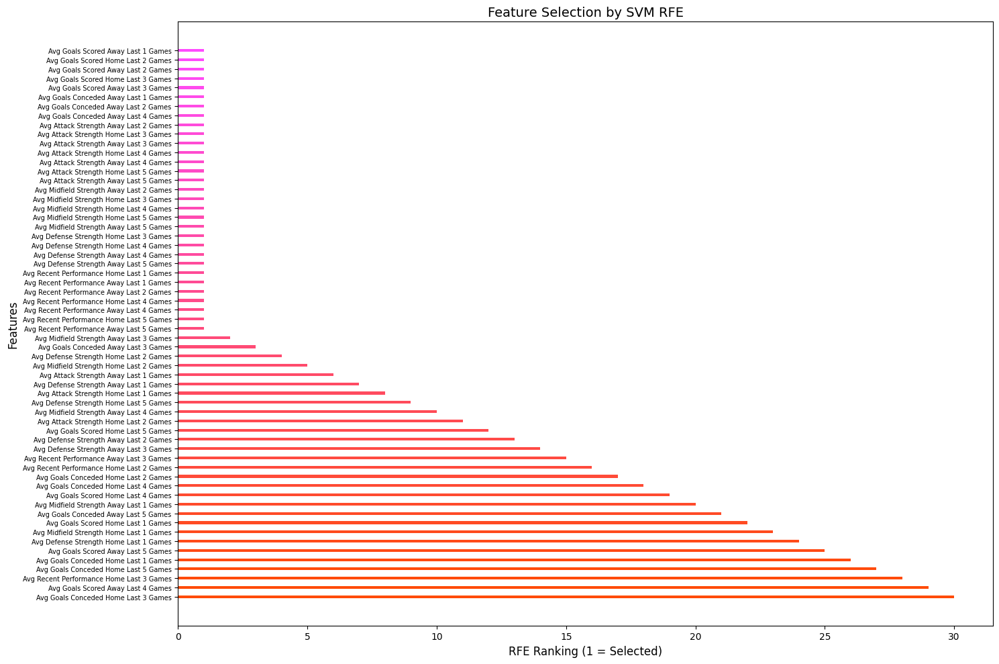

In [21]:
def recursive_feature_elimination_svm(df):
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    target = df['Match Outcome']
    
    data = standardisation(data, terms=list(data.columns))
    
    # collect the feature names
    feature_names = list(data.columns)
        
    # perform RFE
    rfe = RFE(estimator=SVC(kernel="linear"), n_features_to_select=number_of_components) # taken from PCA
    rfe.fit(data, target)
    
    # get feature rankings and selected features
    feature_ranking = rfe.ranking_
    selected_features = [feature for feature, rank in zip(feature_names, feature_ranking) if rank == 1]
    
    print("Selected Features by RFE (SVM):")
    print(selected_features)
    
    # plot feature rankings
    plt.figure(figsize=(15, 10))
    sorted_features = sorted(zip(feature_names, feature_ranking), key=lambda x: x[1])
    sorted_names, sorted_ranks = zip(*sorted_features)

    # increase spacing between bars
    y_positions = np.arange(len(sorted_names)) * 2
    bar_height = 0.6

    # generate gradient colors from blue to green
    colors = [(1, 75/255, 1 - alpha) for alpha in np.linspace(0, 1, len(sorted_ranks))]

    # plot horizontal bar chart with gradient colors
    for ypos, rank, color in zip(y_positions, sorted_ranks, colors):
        plt.barh(ypos, rank, height=bar_height, color=color)

    plt.yticks(y_positions, sorted_names, fontsize=7)
    plt.xlabel("RFE Ranking (1 = Selected)", fontsize=12)
    plt.ylabel("Features", fontsize=12)
    plt.title("Feature Selection by SVM RFE", fontsize=14)

    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    
    return selected_features
            
    
svm_features = recursive_feature_elimination_svm(df)

For data to be used by an LSTM model, we must consider temporal dependencies during feature selection. First we will apply Mutual Information. MI measures the dependency between data and targets, capturing both linear and nonlinear relationships. LSTMs are sensitive to noise, so we should remove irrelevant features by using MI. We will then use RFE with a tree based model to rank the rest of the features. Tree based models excel at identifying patterns, which is useful for LSTMs. This allows the LSTM to focus on high-signal features. 

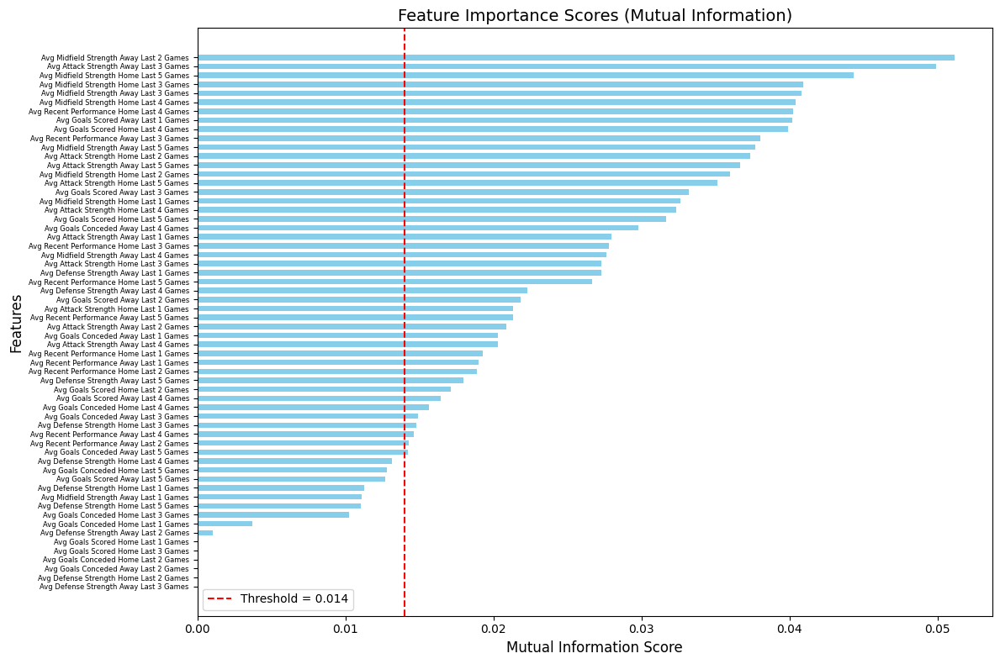


Selected Features based on Mutual Information Threshold: 45 / 60

Selected Features by RFE (RF):
['Avg Midfield Strength Away Last 2 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 5 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Attack Strength Home Last 2 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Attack Strength Home Last 3 Games', 'Avg Defense Strength Away Last 1 Games', 'Avg Recent Performance Home Last 5 Games', 'Avg Defense Strength Away 

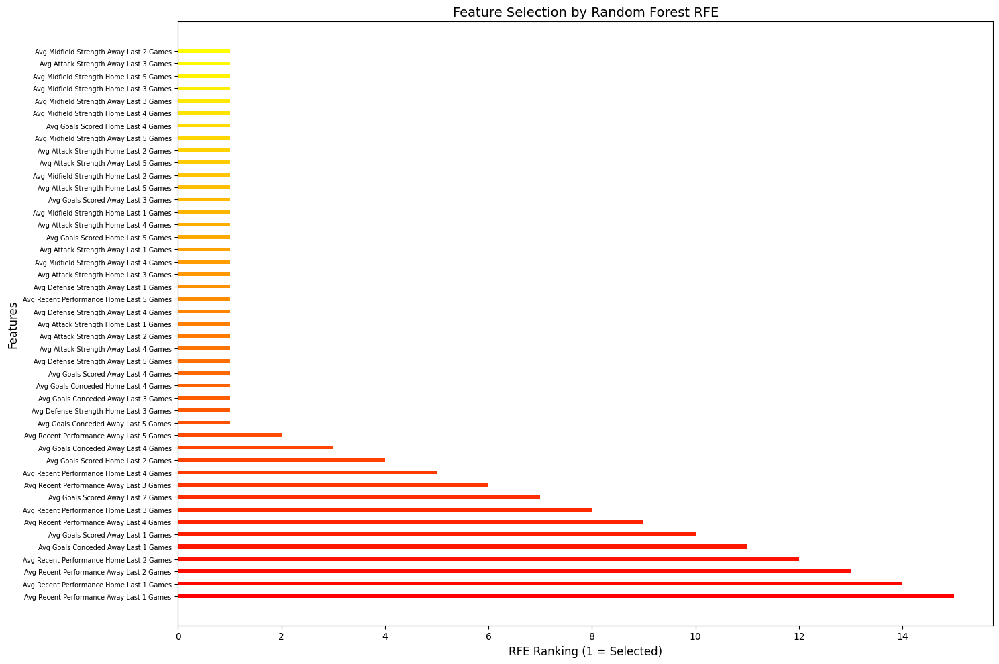

In [22]:
def lstm_feature_selection(df):
    # first applies mutual information and removes the redundant features
    def mutual_info(data, target, threshold=0.014):
        gain = mutual_info_regression(data, target)

        # dictionary of feature importance scores
        feature_names = list(data.columns)
        scores = {}
        for i in range(len(feature_names)):
            scores[feature_names[i]] = gain[i]

        # sort features by importance score in descending order
        sorted_features = sorted(scores.items(), key=lambda x: x[1], reverse=True)

        # plot a bar chart of feature importance scores
        fig, ax = plt.subplots(figsize=(12, 8))
        y_pos = np.arange(len(sorted_features))
        ax.barh(y_pos, [score for _, score in sorted_features], align="center", color="skyblue", height=0.6)
        ax.set_yticks(y_pos)
        ax.set_yticklabels([feature for feature, _ in sorted_features], fontsize=6)
        ax.invert_yaxis()
        ax.set_xlabel("Mutual Information Score", fontsize=12)
        ax.set_ylabel("Features", fontsize=12)
        ax.set_title("Feature Importance Scores (Mutual Information)", fontsize=14)
        plt.axvline(x=threshold, color="red", linestyle="--", label=f"Threshold = {threshold}")
        plt.legend()
        plt.tight_layout()
        plt.show()

        # filter features based on the threshold
        selected_features = [feature for feature, score in sorted_features if score >= threshold]
        print("\nSelected Features based on Mutual Information Threshold:", len(selected_features), "/", len(data.columns))

        return data[selected_features].copy()
    
    # perform tree based RFE on the remaining features
    def recursive_feature_elimination_RF(data, target):
        data = standardisation(data, terms=list(data.columns))

        # collect the feature names
        feature_names = list(data.columns)

        # perform RFE
        rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=number_of_components) # taken from PCA
        rfe.fit(data, target)

        # get feature rankings and selected features
        feature_ranking = rfe.ranking_
        selected_features = [feature for feature, rank in zip(feature_names, feature_ranking) if rank == 1]

        print("\nSelected Features by RFE (RF):")
        print(selected_features)

        # plot feature rankings
        plt.figure(figsize=(15, 10))
        sorted_features = sorted(zip(feature_names, feature_ranking), key=lambda x: x[1])
        sorted_names, sorted_ranks = zip(*sorted_features)

        # increase spacing between bars
        y_positions = np.arange(len(sorted_names)) * 2
        bar_height = 0.6

        # generate gradient colors from blue to green
        colors = [(1, 1 - alpha, 0) for alpha in np.linspace(0, 1, len(sorted_ranks))]

        # plot horizontal bar chart with gradient colors
        for ypos, rank, color in zip(y_positions, sorted_ranks, colors):
            plt.barh(ypos, rank, height=bar_height, color=color)

        plt.yticks(y_positions, sorted_names, fontsize=7)
        plt.xlabel("RFE Ranking (1 = Selected)", fontsize=12)
        plt.ylabel("Features", fontsize=12)
        plt.title("Feature Selection by Random Forest RFE", fontsize=14)

        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.show() 

        return selected_features
    
    
    # organise dataset into X (training examples) and y (targets)
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team']
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    
    # use label encoding on the target data, keep it discrete
    target = df['Match Outcome']
    target = label_encoding(target, dataframe=False)
    
    reduced_data = mutual_info(data, target)
    
    return recursive_feature_elimination_RF(reduced_data, target)


    
lstm_features = lstm_feature_selection(df)

Finally, we perform feature selection for Random Forest- we consider Variance Threshold, ANOVA F-value, and Mutual information.
    
Variance Threshold removes features with near-zero variance because RF performs poorly with constant or near-constant features - threshold of 0.01 removes features that are almost constant
    
ANOVA F-value measures the linear relationship between features and the target which is particularly useful for RF as it helps identify features that can be used for clean splits
    
Mutual Information - Captures both linear and non-linear relationships and complements F-test by finding non-linear patterns. Important for RF as it can utilize non-linear relationships in tree splits
    

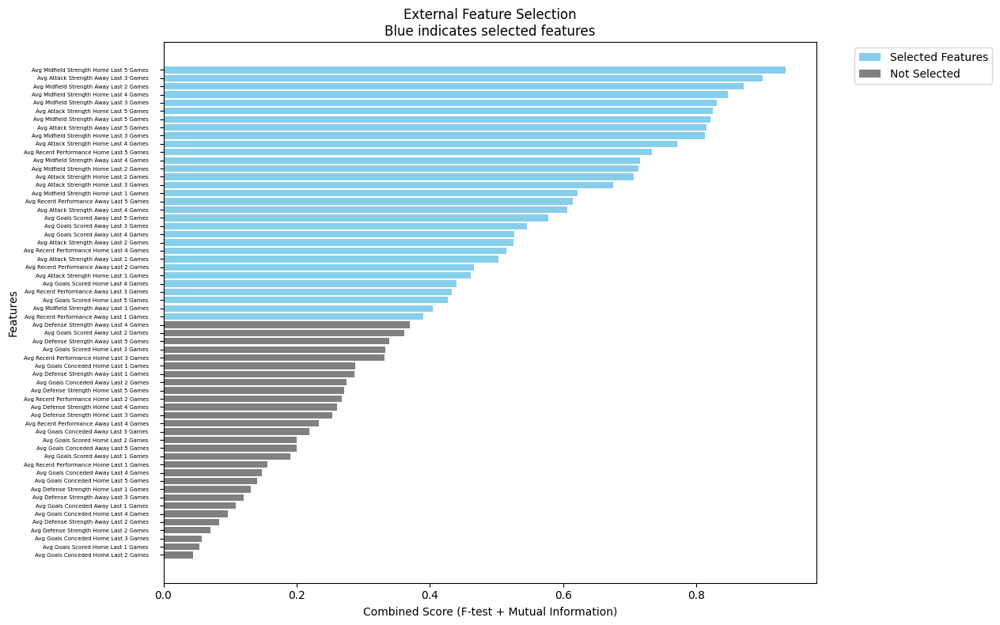


Selected 31 features that passed variance threshold
and had highest combined F-test and Mutual Information scores:
['Avg Midfield Strength Home Last 5 Games', 'Avg Attack Strength Away Last 3 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 3 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Recent Performance Home Last 5 Games', 'Avg Midfield Strength Away Last 4 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Attack Strength Home Last 2 Games', 'Avg Attack Strength Home Last 3 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Recent Performance Away Last 5 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Away Last 4 Games', 'Avg At

In [23]:
def random_forest_external_selection(df):
    from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
    from sklearn.feature_selection import VarianceThreshold
    
    featuresToDrop = ['Date', 'Match Outcome', 'Home Team'] 
    assert set(featuresToDrop).issubset(df.columns), "Some columns in featuresToDrop are missing in df"
    data = df.drop(featuresToDrop, axis=1)
    target = df['Match Outcome'] 
    feature_names = list(data.columns)
    
    # 1. Variance Threshold
    selector_variance = VarianceThreshold(threshold=0.01)  # Remove features with low variance
    data_variance = selector_variance.fit_transform(data)
    variance_mask = selector_variance.get_support()
    
    # 2. ANOVA F-value
    selector_f = SelectKBest(score_func=f_classif, k=number_of_components)
    selector_f.fit(data, target)
    f_scores = selector_f.scores_
    
    # 3. Mutual Information
    selector_mi = SelectKBest(score_func=mutual_info_classif, k=number_of_components)
    selector_mi.fit(data, target)
    mi_scores = selector_mi.scores_
    
    # Combine results into DataFrame
    feature_scores = pd.DataFrame({
        'Feature': feature_names,
        'Variance_Selected': variance_mask,
        'F_Score': f_scores,
        'MI_Score': mi_scores
    })
    
    # Normalize F and MI scores to 0-1 range
    feature_scores['F_Score_Norm'] = (feature_scores['F_Score'] - feature_scores['F_Score'].min()) / \
                                   (feature_scores['F_Score'].max() - feature_scores['F_Score'].min())
    feature_scores['MI_Score_Norm'] = (feature_scores['MI_Score'] - feature_scores['MI_Score'].min()) / \
                                    (feature_scores['MI_Score'].max() - feature_scores['MI_Score'].min())
    
    # Calculate combined score
    feature_scores['Combined_Score'] = (feature_scores['F_Score_Norm'] + 
                                      feature_scores['MI_Score_Norm']) / 2
    
    # Sort by combined score
    feature_scores = feature_scores.sort_values('Combined_Score', ascending=False)
    
    # Select features that pass variance threshold and have highest combined scores
    final_selected = feature_scores[feature_scores['Variance_Selected']]\
        .head(number_of_components)['Feature'].tolist()
    
    plt.figure(figsize=(12, 8))
    
    colors = ['skyblue' if feature in final_selected else 'gray' 
             for feature in feature_scores['Feature']]
    
    plt.barh(feature_scores['Feature'], 
            feature_scores['Combined_Score'],
            color=colors)
    
    plt.xlabel('Combined Score (F-test + Mutual Information)')
    plt.ylabel('Features')
    plt.title('External Feature Selection\nBlue indicates selected features')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.tick_params(axis="y", pad=10, labelsize=5)
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='skyblue', label='Selected Features'),
        Patch(facecolor='gray', label='Not Selected')
    ]
    plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.show()
    
    print(f"\nSelected {len(final_selected)} features that passed variance threshold")
    print("and had highest combined F-test and Mutual Information scores:")
    print(final_selected)
    
    return final_selected

rf_features = random_forest_external_selection(df)

# Model Training and Testing

## RDNBoost Implementation
Instead of manually building RDN based on domain expertise, we attempt to automaticaly discover them using mutual information scores, cross-validation, and statistical validation (`build_feature_rdn()`). These discovered relationships are stored in our RDN structure and used to engineer additional features (`create_relational_features()`). 

The original features and these engineered relational features are then combined and fed into XGBoost for the final prediction model, similar to the paper's approach. 

In [36]:

import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, KBinsDiscretizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import mutual_info_score
import xgboost as xgb

class RDNBoost:
    def __init__(self, n_iterations=50, learning_rate=0.3, max_depth=2,
                 mi_threshold=0.1, validation_threshold=0.2, use_feature_selection=True):
        self.n_iterations = n_iterations
        self.learning_rate = learning_rate
        self.max_depth = max_depth
        # threshhold for mutual info
        self.mi_threshold = mi_threshold
        self.validation_threshold = validation_threshold
        self.use_feature_selection = use_feature_selection

        self.feature_names = None
        self.selected_features = []
        self.rdn = {
            'direct_deps': {},
            'temporal_deps': {},
            'strengths': {}
        }
        # normalize features
        self.scaler = StandardScaler()
        self.discretizer = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='quantile')

        # was overgitting so muhc, so used heavy regularization
        self.xgb_model = xgb.XGBClassifier(
            n_estimators=n_iterations,
            learning_rate=0.01,           
            max_depth=2,                   
            objective='multi:softprob',
            num_class=3,
            subsample=0.5,              
            min_child_weight=25,          
            colsample_bytree=0.3,       
            colsample_bylevel=0.3,         
            colsample_bynode=0.3,     
            gamma=3,                       
            reg_alpha=5.0,                 
            reg_lambda=7.0,                
            scale_pos_weight=1,
            max_leaves=4,                 
            random_state=42
        )


    def calculate_mutual_info(self, X_feature, y):
        if isinstance(X_feature, pd.Series):
            X_feature = X_feature.values.reshape(-1, 1)
        elif len(X_feature.shape) == 1:
            X_feature = X_feature.reshape(-1, 1)

        X_discrete = self.discretizer.fit_transform(X_feature)
        return mutual_info_score(X_discrete.ravel(), y)

    def evaluate_feature(self, X_feature, y):
        if isinstance(X_feature, pd.Series):
            X_feature = X_feature.values

        if len(X_feature.shape) == 1:
            X_feature = X_feature.reshape(-1, 1)
        elif isinstance(X_feature, pd.DataFrame):
            X_feature = X_feature.values

        simple_model = DecisionTreeClassifier(
            max_depth=2,
            min_samples_leaf=20,
            min_samples_split=50,
            random_state=42
        )
        cv_scores = cross_val_score(simple_model, X_feature, y, cv=5)
        return np.mean(cv_scores)

    def evaluate_feature_combination(self, X_features, y):
        if isinstance(X_features, pd.DataFrame):
            X_features = X_features.values

        simple_model = DecisionTreeClassifier(
            max_depth=2,
            min_samples_leaf=20,
            min_samples_split=50,
            random_state=42
        )
        
        # Use cross_val_score instead of fitting directly
        cv_scores = cross_val_score(simple_model, X_features, y, cv=5)
        return np.mean(cv_scores)

    def _get_base_feature(self, feature_name):
        for indicator in ['Last', 'Avg', 'Recent']:
            if indicator in feature_name:
                return feature_name.split(indicator)[0].strip()
        return feature_name

    
    def build_feature_rdn(self, X_train, feature_names, y_train):
        self.feature_names = feature_names

        if not isinstance(X_train, pd.DataFrame):
            X_train = pd.DataFrame(X_train, columns=feature_names)

        # Initial split remains the same
        X_select, X_temp, y_select, y_temp = train_test_split(
            X_train, y_train, test_size=0.4, random_state=42)
        X_validate, X_test, y_validate, y_test = train_test_split(
            X_temp, y_temp, test_size=0.5, random_state=42)

        temporal_features = [f for f in feature_names if any(
            t in f for t in ['Last', 'Avg', 'Recent'])]

        # Use k-fold CV for feature selection
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        
        for feature in feature_names:
            mi_scores = []
            cv_scores = []
            
            for train_idx, val_idx in kf.split(X_select):
                X_fold, X_val = X_select.iloc[train_idx], X_select.iloc[val_idx]
                y_fold, y_val = y_select.iloc[train_idx], y_select.iloc[val_idx]
                
                # Calculate MI score
                mi_scores.append(self.calculate_mutual_info(X_fold[feature], y_fold))
                
                # Calculate validation score
                cv_scores.append(self.evaluate_feature(X_val[feature], y_val))

            mi_score = np.mean(mi_scores)
            cv_score = np.mean(cv_scores)
            cv_std = np.std(cv_scores)

            # Select features that are consistently good
            if (mi_score > self.mi_threshold and 
                cv_score > self.validation_threshold and 
                cv_std < 0.1):
                
                # Final validation on held-out set
                val_score = self.evaluate_feature(X_validate[feature], y_validate)
                if val_score > self.validation_threshold:
                    self.selected_features.append(feature)

        # Build feature relationships with cross-validation
        for feature in self.selected_features:
            self.rdn['direct_deps'][feature] = []
            self.rdn['temporal_deps'][feature] = []

            if feature in temporal_features:
                base_feature = self._get_base_feature(feature)
                if base_feature in self.selected_features:
                    self.rdn['temporal_deps'][feature].append(base_feature)

            n_deps = 0
            for other_feature in self.selected_features:
                if other_feature != feature and n_deps < 2:
                    cv_base_scores = []
                    cv_combined_scores = []
                    
                    for train_idx, val_idx in kf.split(X_select):
                        X_fold, X_val = X_select.iloc[train_idx], X_select.iloc[val_idx]
                        y_fold, y_val = y_select.iloc[train_idx], y_select.iloc[val_idx]
                        
                        base_score = self.evaluate_feature(X_val[feature], y_val)
                        combined_score = self.evaluate_feature_combination(
                            X_val[[feature, other_feature]], y_val)
                        
                        cv_base_scores.append(base_score)
                        cv_combined_scores.append(combined_score)
                    
                    avg_base_score = np.mean(cv_base_scores)
                    avg_combined_score = np.mean(cv_combined_scores)
                    combined_std = np.std(cv_combined_scores)

                    # Only add dependency if improvement is consistent
                    if (avg_combined_score > avg_base_score * 1.2 and 
                        combined_std < 0.1):
                        self.rdn['direct_deps'][feature].append(other_feature)
                        n_deps += 1
                        self.rdn['strengths'][(feature, other_feature)] = (
                            avg_combined_score - avg_base_score)

        return self

    def fit(self, X, y):
        if not isinstance(X, pd.DataFrame):
            if self.feature_names is None:
                self.feature_names = [f'feature_{i}' for i in range(X.shape[1])]
            X = pd.DataFrame(X, columns=self.feature_names)
        else:
            self.feature_names = list(X.columns)

        y_mapped = pd.Series(y).map({-1: 0, 0: 1, 1: 2}).values

        class_weights = compute_class_weight('balanced',
                                        classes=np.unique(y_mapped),
                                        y=y_mapped)
        sample_weights = class_weights[y_mapped]
        print(f"Class weights: {dict(zip(range(3), class_weights))}")

        if self.use_feature_selection:
            self.build_feature_rdn(X, self.feature_names, y)

            if len(self.selected_features) == 0:
                self.mi_threshold /= 2
                self.validation_threshold /= 2
                self.build_feature_rdn(X, self.feature_names, y)

        if len(self.selected_features) == 0:
            raise ValueError("No features were selected. Please check your feature selection criteria.")

        relational_features = self.create_relational_features(X, is_training=True)
        combined_features = np.hstack([X, relational_features])

        X_train, X_val, y_train, y_val = train_test_split(
            combined_features, y_mapped, test_size=0.3, random_state=42
        )

        # Simple fit without early stopping
        self.xgb_model.fit(
            X_train,
            y_train,
            sample_weight=sample_weights[:len(y_train)],
            eval_set=[(X_train, y_train), (X_val, y_val)],
            verbose=True
        )

        return self
        

    def create_relational_features(self, X, is_training=True):
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)

        if not self.selected_features:
            raise ValueError("No features have been selected. Ensure feature selection is enabled and fit() has been called.")

        if is_training:
            self.scaler.fit(X[self.selected_features])

        X_scaled = self.scaler.transform(X[self.selected_features])
        relational_features = np.zeros((X.shape[0], len(self.selected_features)))

        for i, feature in enumerate(self.selected_features):
            feature_deps = []

            if feature in self.rdn['direct_deps']:
                deps = self.rdn['direct_deps'][feature]
                if deps:
                    deps_idx = [self.selected_features.index(d) for d in deps]
                    weights = [self.rdn['strengths'].get((feature, d), 1.0)
                            for d in deps]
                    weighted_deps = np.average(X_scaled[:, deps_idx],
                                            weights=weights, axis=1)
                    feature_deps.append(weighted_deps)

            if feature in self.rdn['temporal_deps']:
                temp_deps = self.rdn['temporal_deps'][feature]
                if temp_deps:
                    temp_idx = [self.selected_features.index(d) for d in temp_deps]
                    temp_features = np.mean(X_scaled[:, temp_idx], axis=1)
                    feature_deps.append(temp_features)

            if feature_deps:
                combined = np.mean(feature_deps, axis=0)
                relational_features[:, i] = combined / (1 + 2 * np.abs(combined))

        return relational_features

    def predict(self, X):
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)

        relational_features = self.create_relational_features(X, is_training=False)
        combined_features = np.hstack([X, relational_features])

        predictions = self.xgb_model.predict(combined_features)
        return pd.Series(predictions).map({0: -1, 1: 0, 2: 1}).values

    def predict_proba(self, X):
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X, columns=self.feature_names)

        relational_features = self.create_relational_features(X, is_training=False)
        combined_features = np.hstack([X, relational_features])
        return self.xgb_model.predict_proba(combined_features)

    def get_selected_features_df(self, X):
        if not self.selected_features:
            raise ValueError("No features have been selected. Ensure feature selection is enabled and fit() has been called.")
        
        return X[self.selected_features]

In [25]:
def chronological_split(df, train_ratio=0.8, chronological=False):
    df = df.sort_values(by='Date')
    df.drop(columns=['Date'], inplace=True)
    df.dropna(inplace=True)
    if chronological:
        train_size = int(len(df) * train_ratio)
        train_df = df[:train_size]
        test_df = df[train_size:]
    else:
        train_df, test_df = train_test_split(df, train_size=train_ratio, random_state=31, shuffle=True)
    return train_df, test_df

def encode_teams(df, encoding="one-hot"):
    if encoding == "one-hot":
        encoder = OneHotEncoder()
        encoded_teams = encoder.fit_transform(df[['Home Team']]).toarray()
        encoded_team_columns = encoder.get_feature_names_out(['Home Team'])
        
        encoded_df = pd.DataFrame(encoded_teams, columns=encoded_team_columns, index=df.index)
        df = pd.concat([df, encoded_df], axis=1)
        return df.drop(['Home Team'], axis=1)
    else:
        teams = df['Home Team'].unique()        
        encoder = LabelEncoder()
        encoder.fit(teams)
        
        df['Home Team'] = encoder.transform(df['Home Team'])
        
        return df
    
def standardize_features(df, features=None, scale_type='minmax'):
    if features is None:
        # Get all numerical columns except these
        features = [col for col in df.columns 
                   if col not in ['Home Team', 'Match Outcome', 'Date']]
    
    if scale_type == 'minmax':
        scaler = MinMaxScaler()
    else: 
        scaler = StandardScaler()
    
    df[features] = scaler.fit_transform(df[features])
    return df

In [32]:
class RecencyModelTrainingNew:
    def __init__(self):
        pass

    from sklearn.feature_selection import SelectFromModel, RFE
    from sklearn.ensemble import RandomForestClassifier
    import numpy as np
    from sklearn.metrics import accuracy_score, precision_recall_fscore_support
    # logistic regression model
    def train_with_iterations(self, X_train, y_train, X_test, y_test, iterations):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for max_iter in iterations:
            model = LogisticRegression(
                multi_class='multinomial', solver='lbfgs', max_iter=max_iter,
                random_state=31
            )
            model.fit(X_train, y_train)

            train_predictions = model.predict(X_train)
            test_predictions = model.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics
    
    
    # logistic regression model with LASSO regression - regularisation strength C
    def train_with_iterations_l1(self, X_train, y_train, X_test, y_test, iterations, C=1.0):        
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        feature_names = list(X_train.columns)
        selected_features = []

        for max_iter in iterations:
            model = LogisticRegression(
                penalty='l1', solver='liblinear', max_iter=max_iter, C=C, random_state=31
            )
            model.fit(X_train, y_train)

            train_predictions = model.predict(X_train)
            test_predictions = model.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

            # get selected features (non-zero coefficients)
            non_zero_indices = np.where(model.coef_[0] != 0)[0]
            selected_features = [feature_names[i] for i in non_zero_indices if "Home Team" not in feature_names[i]]
            #print(f"Selected Features (max_iter={max_iter}): {selected_features}\n")

        print(f"Logistic Regression => LASSO Regularisation Selected Features (max_iter={iterations[-1]}): {selected_features}\n")

        return metrics
    
    
    # logistic regression model with Ridge regression - regularisation strength C
    def train_with_iterations_l2(self, X_train, y_train, X_test, y_test, iterations, C=1.0):        
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        feature_names = list(X_train.columns)

        for max_iter in iterations:
            model = LogisticRegression(
                penalty='l2', solver='lbfgs', max_iter=max_iter, C=C, random_state=31
            )
            model.fit(X_train, y_train)

            train_predictions = model.predict(X_train)
            test_predictions = model.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        print(f"Logistic Regression => Ridge Regression Selected Features (max_iter={iterations[-1]}): Every feature. Just different weights.")
            
        return metrics
    
    
    #  logistic regression model with Elastic Net regularisation - regularisation strength C
    def train_with_iterations_l1_l2(self, X_train, y_train, X_test, y_test, iterations, C=1.0, l1_ratio=0.5):        
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        feature_names = list(X_train.columns)
        selected_features = []

        for max_iter in iterations:
            model = LogisticRegression(
                penalty='elasticnet', solver='saga', max_iter=max_iter, C=C, 
                l1_ratio=l1_ratio, random_state=31
            )
            model.fit(X_train, y_train)

            train_predictions = model.predict(X_train)
            test_predictions = model.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

            # Get selected features (non-zero coefficients)
            non_zero_indices = np.where(model.coef_[0] != 0)[0]
            selected_features = [feature_names[i] for i in non_zero_indices if "Home Team" not in feature_names[i]]
        
        print(f"Logistic Regression => Elastic Net Selected Features (max_iter={iterations[-1]}): {selected_features}\n")
        return metrics

    
    # k nearest neighbours model
    def train_and_evaluate_knn(self, X_train, y_train, X_test, y_test, neighbors_range):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for n_neighbors in neighbors_range:
            knn = KNeighborsClassifier(n_neighbors=n_neighbors)
            knn.fit(X_train, y_train)

            train_predictions = knn.predict(X_train)
            test_predictions = knn.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics

    
    # support vector machine model
    def train_and_evaluate_svm(self, X_train, y_train, X_test, y_test, C_range=[0.1, 0.5, 1.0, 2.0, 5.0, 10.0]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for C in C_range:
            svm = SVC(kernel='linear', C=C, random_state=31)
            svm.fit(X_train, y_train)

            train_predictions = svm.predict(X_train)
            test_predictions = svm.predict(X_test)

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, C_range
    
    
    # support vector model with l1 regression - regularisation strength C
    def train_and_evaluate_svm_l1(self, X_train, y_train, X_test, y_test, C_range=[0.1, 0.5, 1.0, 2.0, 5.0, 10.0]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for C in C_range:
            svm = LinearSVC(penalty='l1', dual=False, C=C, random_state=31)
            svm.fit(X_train, y_train)

            train_predictions = svm.predict(X_train)
            test_predictions = svm.predict(X_test)

            # print selected features
            feature_names = X_train.columns
            selected_features = [feature_names[i] for i in range(len(feature_names)) if svm.coef_[0, i] != 0 and "Home Team" not in feature_names[i]]
            original_feature_num = len([col for col in list(X_train.columns) if "Home Team" not in col])
            print(f"SVM => Selected Features with L1 Regularization (C={C}): {len(selected_features)}/{original_feature_num}\n\n{selected_features}\n")

            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, C_range
    
    
    # support vector model with l2 regression - regularisation strength C
    def train_and_evaluate_svm_l2(self, X_train, y_train, X_test, y_test, C_range=[0.1, 0.5, 1.0, 2.0, 5.0, 10.0]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        for C in C_range:
            # SVM with L2 regularization
            svm = LinearSVC(penalty='l2', dual=True, C=C, random_state=31)
            svm.fit(X_train, y_train)

            train_predictions = svm.predict(X_train)
            test_predictions = svm.predict(X_test)

            print(f"SVM => Selected Features with L2 Regularisation (C={C}): Every feature. Just different weights.")
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, C_range


    def train_and_evaluate_lstm(self, X_train, y_train, X_test, y_test, max_epochs=10):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data once
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # Base LSTM model
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), return_sequences=True),
            LSTM(64, return_sequences=False),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate after each epoch
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)

    def train_and_evaluate_lstm_l1(self, X_train, y_train, X_test, y_test, max_epochs=10, l1_penalty=0.01):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # L1 regularized LSTM
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), 
                return_sequences=True, kernel_regularizer=regularizers.l1(l1_penalty)),
            LSTM(64, return_sequences=False, kernel_regularizer=regularizers.l1(l1_penalty)),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)

    def train_and_evaluate_lstm_l2(self, X_train, y_train, X_test, y_test, max_epochs=10, l2_penalty=0.01):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # L2 regularized LSTM
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), 
                return_sequences=True, kernel_regularizer=regularizers.l2(l2_penalty)),
            LSTM(64, return_sequences=False, kernel_regularizer=regularizers.l2(l2_penalty)),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)

    def train_and_evaluate_lstm_l1_l2(self, X_train, y_train, X_test, y_test, max_epochs=10, l1_l2_penalty=0.01):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # L1L2 regularized LSTM
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), 
                return_sequences=True, kernel_regularizer=regularizers.l1_l2(l1=l1_l2_penalty, l2=l1_l2_penalty)),
            LSTM(64, return_sequences=False, kernel_regularizer=regularizers.l1_l2(l1=l1_l2_penalty, l2=l1_l2_penalty)),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)

    def train_and_evaluate_lstm_dropout(self, X_train, y_train, X_test, y_test, max_epochs=10, dropout_rate=0.2):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }

        # Prepare data
        y_train_one_hot = to_categorical(y_train, num_classes=3)
        y_test_one_hot = to_categorical(y_test, num_classes=3)
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # Dropout LSTM
        lstm_model = Sequential([
            LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), return_sequences=True),
            Dropout(dropout_rate),
            LSTM(64, return_sequences=False),
            Dropout(dropout_rate),
            Dense(3, activation='softmax')
        ])
        
        lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # Train and evaluate
        for _ in range(max_epochs):
            lstm_model.fit(X_train_reshaped, y_train_one_hot, epochs=1, batch_size=32, verbose=1)
            train_predictions = lstm_model.predict(X_train_reshaped).argmax(axis=1)
            test_predictions = lstm_model.predict(X_test_reshaped).argmax(axis=1)
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

        return metrics, range(1, max_epochs + 1)
    def train_and_evaluate_rdnboost(self, X_train, y_train, X_test, y_test, n_iterations_range=range(10, 210, 10)):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        feature_counts = []  # Track number of selected features
        rdn_structures = []  # Track RDN structures

        for n_iter in n_iterations_range:
            model = RDNBoost(
                n_iterations=n_iter,
                learning_rate=0.3,
                max_depth=2,
                mi_threshold=0.1,
                validation_threshold=0.2,
                use_feature_selection=True  # Enable built-in feature selection
            )

            try:
                # First build RDN structure and select features
                if isinstance(X_train, pd.DataFrame):
                    feature_names = X_train.columns
                else:
                    feature_names = [f'feature_{i}' for i in range(X_train.shape[1])]
                    
                model.build_feature_rdn(X_train, feature_names, y_train)
                
                # Store feature selection results
                feature_counts.append(len(model.selected_features))
                rdn_structures.append({
                    'selected_features': model.selected_features.copy(),
                    'direct_deps': model.rdn['direct_deps'].copy(),
                    'temporal_deps': model.rdn['temporal_deps'].copy(),
                    'strengths': model.rdn['strengths'].copy()
                })

                # Train the model
                model.fit(X_train, y_train)

                # Get predictions
                train_predictions = model.predict(X_train)
                test_predictions = model.predict(X_test)

                # Compute metrics
                self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)

                # Print information for this iteration
                print(f"\nIteration {n_iter}:")
                print(f"Number of selected features: {len(model.selected_features)}")
                print(f"Selected features: {model.selected_features}")
                print(f"Test accuracy: {metrics['test_accuracy'][-1]:.4f}")
                
                # Print some RDN structure information
                print("\nDirect Dependencies:")
                for feat in model.rdn['direct_deps']:
                    if model.rdn['direct_deps'][feat]:
                        print(f"{feat} -> {model.rdn['direct_deps'][feat]}")
                
                print("\nTemporal Dependencies:")
                for feat in model.rdn['temporal_deps']:
                    if model.rdn['temporal_deps'][feat]:
                        print(f"{feat} -> {model.rdn['temporal_deps'][feat]}")

            except ValueError as e:
                print(f"Warning at iteration {n_iter}: {str(e)}")
                # Fill metrics with None or previous value to maintain alignment
                for metric_list in metrics.values():
                    if len(metric_list) > 0:
                        metric_list.append(metric_list[-1])
                    else:
                        metric_list.append(None)
                feature_counts.append(None)
                rdn_structures.append(None)
                continue

        # Add feature selection information to the return values
        return metrics, n_iterations_range, {
            'feature_counts': feature_counts,
            'rdn_structures': rdn_structures
        }
       
    from sklearn.utils.class_weight import compute_sample_weight

    def train_and_evaluate_rf(self, X_train, y_train, X_test, y_test, n_estimators_range=[10, 50, 100, 150, 200, 250, 300]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        for n_estimators in n_estimators_range:
            # Basic Random Forest without any feature selection
            rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            rf.fit(X_train, y_train)
            
            train_predictions = rf.predict(X_train)
            test_predictions = rf.predict(X_test)
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)
        
        return metrics, n_estimators_range

    def train_and_evaluate_rf_importance(self, X_train, y_train, X_test, y_test, n_estimators_range=[10, 50, 100, 150, 200, 250, 300]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        for n_estimators in n_estimators_range:
            # Train initial RF to get feature importances
            rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            rf.fit(X_train, y_train)
            
            # Get feature importances
            importances = rf.feature_importances_
            feature_importance = pd.DataFrame({
                'feature': X_train.columns,
                'importance': importances
            })
            feature_importance = feature_importance.sort_values('importance', ascending=False)
            
            # Select top features
            top_features = feature_importance.head(number_of_components)['feature'].tolist()
            print(f"\nRandom Forest => Top {number_of_components} Important Features (n_estimators={n_estimators}):")
            for feat, imp in zip(feature_importance.head(number_of_components)['feature'], 
                            feature_importance.head(number_of_components)['importance']):
                print(f"{feat}: {imp:.4f}")
            
            # Train final model with selected features
            X_train_selected = X_train[top_features]
            X_test_selected = X_test[top_features]
            
            final_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            final_rf.fit(X_train_selected, y_train)
            
            train_predictions = final_rf.predict(X_train_selected)
            test_predictions = final_rf.predict(X_test_selected)
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)
            
            # Optional: Plot feature importances for the last iteration
            if n_estimators == n_estimators_range[-1]:
                plt.figure(figsize=(10, 6))
                plt.bar(range(len(importances)), importances)
                plt.xticks(range(len(importances)), X_train.columns, rotation=90)
                plt.title(f'Feature Importances (n_estimators={n_estimators})')
                plt.tight_layout()
                plt.show()
        
        return metrics, n_estimators_range

    def train_and_evaluate_rf_selectfrommodel(self, X_train, y_train, X_test, y_test, n_estimators_range=[10, 50, 100, 150, 200, 250, 300]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        for n_estimators in n_estimators_range:
            # SelectFromModel Method with regularized RF
            base_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            
            selector = self.SelectFromModel(
                base_rf,
                max_features=number_of_components,
                threshold=-self.np.inf
            )
            selector.fit(X_train, y_train)
            
            selected_features = X_train.columns[selector.get_support()].tolist()
            print(f"Random Forest => Selected Features with SelectFromModel (n_estimators={n_estimators}): {len(selected_features)}")
            print(selected_features)
            
            # Train and evaluate with selected features
            X_train_selected = X_train[selected_features]
            X_test_selected = X_test[selected_features]
            
            final_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            final_rf.fit(X_train_selected, y_train)
            
            train_predictions = final_rf.predict(X_train_selected)
            test_predictions = final_rf.predict(X_test_selected)
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)
        
        return metrics, n_estimators_range

    def train_and_evaluate_rf_rfe(self, X_train, y_train, X_test, y_test, n_estimators_range=[10, 50, 100, 150, 200, 250, 300]):
        metrics = {
            'train_accuracy': [], 'test_accuracy': [],
            'train_rmse': [], 'test_rmse': [],
            'train_precision': [], 'test_precision': [],
            'train_recall': [], 'test_recall': [],
            'train_f1': [], 'test_f1': []
        }
        
        for n_estimators in n_estimators_range:
            # Recursive Feature Elimination with regularized RF
            base_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            
            rfe = self.RFE(
                estimator=base_rf,
                n_features_to_select=number_of_components
            )
            rfe.fit(X_train, y_train)
            
            selected_features = X_train.columns[rfe.support_].tolist()
            print(f"Random Forest => Selected Features with RFE (n_estimators={n_estimators}): {len(selected_features)}")
            print(selected_features)
            
            # Train and evaluate with selected features
            X_train_selected = X_train[selected_features]
            X_test_selected = X_test[selected_features]
            
            final_rf = self.RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=4,
                min_samples_split=50,
                min_samples_leaf=25,
                max_features='sqrt',
                class_weight='balanced',
                random_state=42
            )
            final_rf.fit(X_train_selected, y_train)
            
            train_predictions = final_rf.predict(X_train_selected)
            test_predictions = final_rf.predict(X_test_selected)
            
            self._compute_metrics(metrics, train_predictions, test_predictions, y_train, y_test)
        
        return metrics, n_estimators_range  
    
    def _compute_metrics(self, metrics, train_predictions, test_predictions, y_train, y_test):
        train_accuracy = accuracy_score(y_train, train_predictions)
        test_accuracy = accuracy_score(y_test, test_predictions)

        metrics['train_accuracy'].append(train_accuracy)
        metrics['test_accuracy'].append(test_accuracy)

        metrics['train_rmse'].append(np.sqrt(np.mean((y_train - train_predictions) ** 2)))
        metrics['test_rmse'].append(np.sqrt(np.mean((y_test - test_predictions) ** 2)))

        train_precision, train_recall, train_f1, _ = precision_recall_fscore_support(
            y_train, train_predictions, average='weighted'
        )
        test_precision, test_recall, test_f1, _ = precision_recall_fscore_support(
            y_test, test_predictions, average='weighted'
        )

        metrics['train_precision'].append(train_precision)
        metrics['test_precision'].append(test_precision)
        metrics['train_recall'].append(train_recall)
        metrics['test_recall'].append(test_recall)
        metrics['train_f1'].append(train_f1)
        metrics['test_f1'].append(test_f1)

        
    def plot_metrics(self, metrics, model_name, param_values=None, param_name="Parameter Value"):
        metric_keys = list(metrics.keys())
        n_metrics = len(metric_keys)

        plt.figure(figsize=(15, 10))
        for i, key in enumerate(metric_keys, 1):
            plt.subplot((n_metrics + 1) // 2, 2, i)

            # Print the metric data for debugging
            print(f"Plotting Metric: {key}")
            print(f"Metric Data: {metrics[key]}")
            
            if param_values is not None:
                print(f"Parameter Values: {param_values}")
                # Ensure that param_values and metrics match in length
                if len(metrics[key]) != len(param_values):
                    print(f"Warning: Length mismatch between param_values and {key} metric")
                plt.plot(param_values, metrics[key], label=key, marker='o')
                x_vals = param_values
            else:
                plt.plot(metrics[key], label=key, marker='o')
                x_vals = range(len(metrics[key]))

            # Check if there are multiple values to plot
            if len(x_vals) > 1:
                for x, y in zip(x_vals, metrics[key]):
                    plt.text(x, y, f'{y:.2f}', fontsize=8, ha='center', va='bottom')
            else:
                print(f"Warning: Only one data point for {key}. This may indicate an issue with data collection.")

            plt.xlabel(param_name)
            plt.ylabel(f'{key}')
            plt.title(f'{model_name} - {key} over {param_name}')
            plt.grid()

        plt.tight_layout()
        plt.show()
        
    def save_model(self, filename):
        joblib.dump(self.model, filename)

        
    def load_model(self, filename):
        self.model = joblib.load(filename)


## Recency Model Training

The first model training will be focused solely on Recency. Features based on past games will be used to train the model.

In [39]:
print('Preprocessing Data...')
first_df = encode_teams(df)
numerical_features = [col for col in first_df.columns if 'Avg' in col]
first_df = standardize_features(first_df, numerical_features)

first_train_df, first_test_df = chronological_split(first_df)

first_X_train, first_y_train = first_train_df.drop('Match Outcome', axis=1), first_train_df['Match Outcome']
first_X_test, first_y_test = first_test_df.drop('Match Outcome', axis=1), first_test_df['Match Outcome']

Preprocessing Data...


In [40]:
# Model Training
print('Starting Training...')
trainer = RecencyModelTrainingNew()

iterations = np.arange(0, 200, 10)
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
n_estimators_range = [10, 50, 100, 150, 200, 250, 300]
#metrics_logistic = trainer.train_with_iterations(first_X_train, first_y_train, first_X_test, first_y_test, iterations)
#metrics_knn = trainer.train_and_evaluate_knn(first_X_train, first_y_train, first_X_test, first_y_test, neighbors_range)
#metrics_svm = trainer.train_and_evaluate_svm(first_X_train, first_y_train, first_X_test, first_y_test)
#metrics_lstm = trainer.train_and_evaluate_lstm(first_X_train, first_y_train, first_X_test, first_y_test)
metrics_rdnboost = trainer.train_and_evaluate_rdnboost(first_X_train, first_y_train, first_X_test, first_y_test, iterations)
#metrics_rf = trainer.train_and_evaluate_rf(first_X_train, first_y_train, first_X_test, first_y_test, n_estimators_range)


Starting Training...


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'

Iteration 0:
Number of selected features: 1
Selected features: ['Avg Attack Strength Home Last 5 Games']
Test accuracy: 0.3233

Direct Dependencies:

Temporal Dependencies:


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(



Iteration 10:
Number of selected features: 1
Selected features: ['Avg Attack Strength Home Last 5 Games']
Test accuracy: 0.4774

Direct Dependencies:

Temporal Dependencies:


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(



Iteration 20:
Number of selected features: 1
Selected features: ['Avg Attack Strength Home Last 5 Games']
Test accuracy: 0.4455

Direct Dependencies:

Temporal Dependencies:


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:50:02] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitali

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mlogloss:1.08695	validation_1-mlogloss:1.08681
[15]	validation_0-mlogloss:1.08629	validation_1-mlogloss:1.08613
[16]	validation_0-mlogloss:1.08562

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:50:20] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/skl


Iteration 60:
Number of selected features: 1
Selected features: ['Avg Attack Strength Home Last 5 Games']
Test accuracy: 0.4586

Direct Dependencies:

Temporal Dependencies:


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(



Iteration 70:
Number of selected features: 1
Selected features: ['Avg Attack Strength Home Last 5 Games']
Test accuracy: 0.4624

Direct Dependencies:

Temporal Dependencies:


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:50:32] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitali

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mlogloss:1.08695	validation_1-mlogloss:1.08681
[15]	validation_0-mlogloss:1.08629	validation_1-mlogloss:1.08613
[16]	validation_0-mlogloss:1.08562	validation_1-mlogloss:1.08546
[17]	validation_0-mlogloss:1.0849

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:50:49] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/skl


Iteration 110:
Number of selected features: 1
Selected features: ['Avg Attack Strength Home Last 5 Games']
Test accuracy: 0.4793

Direct Dependencies:

Temporal Dependencies:


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mlogloss:1.08695	validation_1-mlogloss:1.08681
[15]	validation_0-mlogloss:1.08629	validation_1-mlogloss:1.08613
[16]	validation_0-mlogloss:1.08562	validation_1-mlogloss:1.08546
[17]	validation_0-mlogloss:1.0849

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mlogloss:1.08695	validation_1-mlogloss:1.08681
[15]	validation_0-mlogloss:1.08629	validation_1-mlogloss:1.08613
[16]	validation_0-mlogloss:1.08562	validation_1-mlogloss:1.08546
[17]	validation_0-mlogloss:1.0849

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:51:12] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


[116]	validation_0-mlogloss:1.03864	validation_1-mlogloss:1.03892
[117]	validation_0-mlogloss:1.03836	validation_1-mlogloss:1.03859
[118]	validation_0-mlogloss:1.03803	validation_1-mlogloss:1.03822
[119]	validation_0-mlogloss:1.03789	validation_1-mlogloss:1.03810
[120]	validation_0-mlogloss:1.03772	validation_1-mlogloss:1.03792
[121]	validation_0-mlogloss:1.03738	validation_1-mlogloss:1.03758
[122]	validation_0-mlogloss:1.03717	validation_1-mlogloss:1.03738
[123]	validation_0-mlogloss:1.03696	validation_1-mlogloss:1.03716
[124]	validation_0-mlogloss:1.03674	validation_1-mlogloss:1.03694
[125]	validation_0-mlogloss:1.03666	validation_1-mlogloss:1.03686
[126]	validation_0-mlogloss:1.03644	validation_1-mlogloss:1.03662
[127]	validation_0-mlogloss:1.03601	validation_1-mlogloss:1.03622
[128]	validation_0-mlogloss:1.03576	validation_1-mlogloss:1.03597
[129]	validation_0-mlogloss:1.03541	validation_1-mlogloss:1.03566
[130]	validation_0-mlogloss:1.03509	validation_1-mlogloss:1.03537
[131]	vali

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:51:18] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


[115]	validation_0-mlogloss:1.03896	validation_1-mlogloss:1.03925
[116]	validation_0-mlogloss:1.03864	validation_1-mlogloss:1.03892
[117]	validation_0-mlogloss:1.03836	validation_1-mlogloss:1.03859
[118]	validation_0-mlogloss:1.03803	validation_1-mlogloss:1.03822
[119]	validation_0-mlogloss:1.03789	validation_1-mlogloss:1.03810
[120]	validation_0-mlogloss:1.03772	validation_1-mlogloss:1.03792
[121]	validation_0-mlogloss:1.03738	validation_1-mlogloss:1.03758
[122]	validation_0-mlogloss:1.03717	validation_1-mlogloss:1.03738
[123]	validation_0-mlogloss:1.03696	validation_1-mlogloss:1.03716
[124]	validation_0-mlogloss:1.03674	validation_1-mlogloss:1.03694
[125]	validation_0-mlogloss:1.03666	validation_1-mlogloss:1.03686
[126]	validation_0-mlogloss:1.03644	validation_1-mlogloss:1.03662
[127]	validation_0-mlogloss:1.03601	validation_1-mlogloss:1.03622
[128]	validation_0-mlogloss:1.03576	validation_1-mlogloss:1.03597
[129]	validation_0-mlogloss:1.03541	validation_1-mlogloss:1.03566
[130]	vali

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:51:24] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


[127]	validation_0-mlogloss:1.03601	validation_1-mlogloss:1.03622
[128]	validation_0-mlogloss:1.03576	validation_1-mlogloss:1.03597
[129]	validation_0-mlogloss:1.03541	validation_1-mlogloss:1.03566
[130]	validation_0-mlogloss:1.03509	validation_1-mlogloss:1.03537
[131]	validation_0-mlogloss:1.03499	validation_1-mlogloss:1.03527
[132]	validation_0-mlogloss:1.03466	validation_1-mlogloss:1.03490
[133]	validation_0-mlogloss:1.03448	validation_1-mlogloss:1.03468
[134]	validation_0-mlogloss:1.03412	validation_1-mlogloss:1.03432
[135]	validation_0-mlogloss:1.03388	validation_1-mlogloss:1.03401
[136]	validation_0-mlogloss:1.03367	validation_1-mlogloss:1.03377
[137]	validation_0-mlogloss:1.03342	validation_1-mlogloss:1.03354
[138]	validation_0-mlogloss:1.03316	validation_1-mlogloss:1.03327
[139]	validation_0-mlogloss:1.03280	validation_1-mlogloss:1.03296
[140]	validation_0-mlogloss:1.03261	validation_1-mlogloss:1.03278
[141]	validation_0-mlogloss:1.03235	validation_1-mlogloss:1.03257
[142]	vali

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:51:30] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


[128]	validation_0-mlogloss:1.03576	validation_1-mlogloss:1.03597
[129]	validation_0-mlogloss:1.03541	validation_1-mlogloss:1.03566
[130]	validation_0-mlogloss:1.03509	validation_1-mlogloss:1.03537
[131]	validation_0-mlogloss:1.03499	validation_1-mlogloss:1.03527
[132]	validation_0-mlogloss:1.03466	validation_1-mlogloss:1.03490
[133]	validation_0-mlogloss:1.03448	validation_1-mlogloss:1.03468
[134]	validation_0-mlogloss:1.03412	validation_1-mlogloss:1.03432
[135]	validation_0-mlogloss:1.03388	validation_1-mlogloss:1.03401
[136]	validation_0-mlogloss:1.03367	validation_1-mlogloss:1.03377
[137]	validation_0-mlogloss:1.03342	validation_1-mlogloss:1.03354
[138]	validation_0-mlogloss:1.03316	validation_1-mlogloss:1.03327
[139]	validation_0-mlogloss:1.03280	validation_1-mlogloss:1.03296
[140]	validation_0-mlogloss:1.03261	validation_1-mlogloss:1.03278
[141]	validation_0-mlogloss:1.03235	validation_1-mlogloss:1.03257
[142]	validation_0-mlogloss:1.03196	validation_1-mlogloss:1.03224
[143]	vali

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/prepr

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Error: XGBClassifier.fit() got an unexpected keyword argument 'eval_metric'
[0]	validation_0-mlogloss:1.09766	validation_1-mlogloss:1.09774
[1]	validation_0-mlogloss:1.09675	validation_1-mlogloss:1.09679
[2]	validation_0-mlogloss:1.09568	validation_1-mlogloss:1.09583
[3]	validation_0-mlogloss:1.09481	validation_1-mlogloss:1.09496
[4]	validation_0-mlogloss:1.09396	validation_1-mlogloss:1.09409
[5]	validation_0-mlogloss:1.09321	validation_1-mlogloss:1.09329
[6]	validation_0-mlogloss:1.09233	validation_1-mlogloss:1.09240
[7]	validation_0-mlogloss:1.09141	validation_1-mlogloss:1.09148
[8]	validation_0-mlogloss:1.09071	validation_1-mlogloss:1.09073
[9]	validation_0-mlogloss:1.09005	validation_1-mlogloss:1.09007
[10]	validation_0-mlogloss:1.08952	validation_1-mlogloss:1.08952
[11]	validation_0-mlogloss:1.08880	validation_1-mlogloss:1.08875
[12]	validation_0-mlogloss:1.08819	validation_1-mlogloss:1.08809
[13]	validation_0-mlogloss:1.08761	validation_1-mlogloss:1.08750
[14]	validation_0-mloglo

/Users/lukemciver/football/venv/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:51:36] WARNING: /private/var/folders/06/bvfn_ss977sd_c5gb17ymlfh0000gn/T/pip-install-7vi_l3eh/xgboost_7614077fb869492ca845d09ecf74ae30/cpp_src/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


[127]	validation_0-mlogloss:1.03601	validation_1-mlogloss:1.03622
[128]	validation_0-mlogloss:1.03576	validation_1-mlogloss:1.03597
[129]	validation_0-mlogloss:1.03541	validation_1-mlogloss:1.03566
[130]	validation_0-mlogloss:1.03509	validation_1-mlogloss:1.03537
[131]	validation_0-mlogloss:1.03499	validation_1-mlogloss:1.03527
[132]	validation_0-mlogloss:1.03466	validation_1-mlogloss:1.03490
[133]	validation_0-mlogloss:1.03448	validation_1-mlogloss:1.03468
[134]	validation_0-mlogloss:1.03412	validation_1-mlogloss:1.03432
[135]	validation_0-mlogloss:1.03388	validation_1-mlogloss:1.03401
[136]	validation_0-mlogloss:1.03367	validation_1-mlogloss:1.03377
[137]	validation_0-mlogloss:1.03342	validation_1-mlogloss:1.03354
[138]	validation_0-mlogloss:1.03316	validation_1-mlogloss:1.03327
[139]	validation_0-mlogloss:1.03280	validation_1-mlogloss:1.03296
[140]	validation_0-mlogloss:1.03261	validation_1-mlogloss:1.03278
[141]	validation_0-mlogloss:1.03235	validation_1-mlogloss:1.03257
[142]	vali

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [42]:
# Define parameter ranges
iterations = np.arange(0, 200, 10)  # for logistic regression [0, 10, ..., 190]
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
c_values = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]  # for SVM
epochs = range(1, 11)  # for LSTM [1, 2, ..., 10]
rdnboost_iterations = np.arange(10, 210, 10)  # for RDNBoost [10, 20, ..., 200]
n_estimators = [10, 50, 100, 150, 200, 250, 300]  # for Random Forest

# Helper function to safely get metrics
def get_metrics(metrics_obj):
    if isinstance(metrics_obj, tuple):
        return metrics_obj[0]
    return metrics_obj

# Plot metrics for each model
#trainer.plot_metrics(get_metrics(metrics_logistic), "Logistic Regression", 
                    param_values=iterations,
                    param_name="Number of Iterations")

#trainer.plot_metrics(get_metrics(metrics_knn), "KNN", 
                    #param_values=neighbors_range,
                    #param_name="Number of Neighbors")

#trainer.plot_metrics(get_metrics(metrics_svm), "SVM", 
                    #param_values=c_values,
                    #param_name="Regularization Parameter (C)")

#trainer.plot_metrics(get_metrics(metrics_lstm), "LSTM", 
                    #param_values=epochs,
                    #param_name="Number of Epochs")

trainer.plot_metrics(get_metrics(metrics_rdnboost), "RDNBoost", 
                    param_values=rdnboost_iterations,
                    param_name="Number of Iterations")

#trainer.plot_metrics(get_metrics(metrics_rf), "Random Forest", 
                    #param_values=n_estimators,
                    #param_name="Number of Trees")



IndentationError: unexpected indent (802296642.py, line 17)

## Comparative Plots


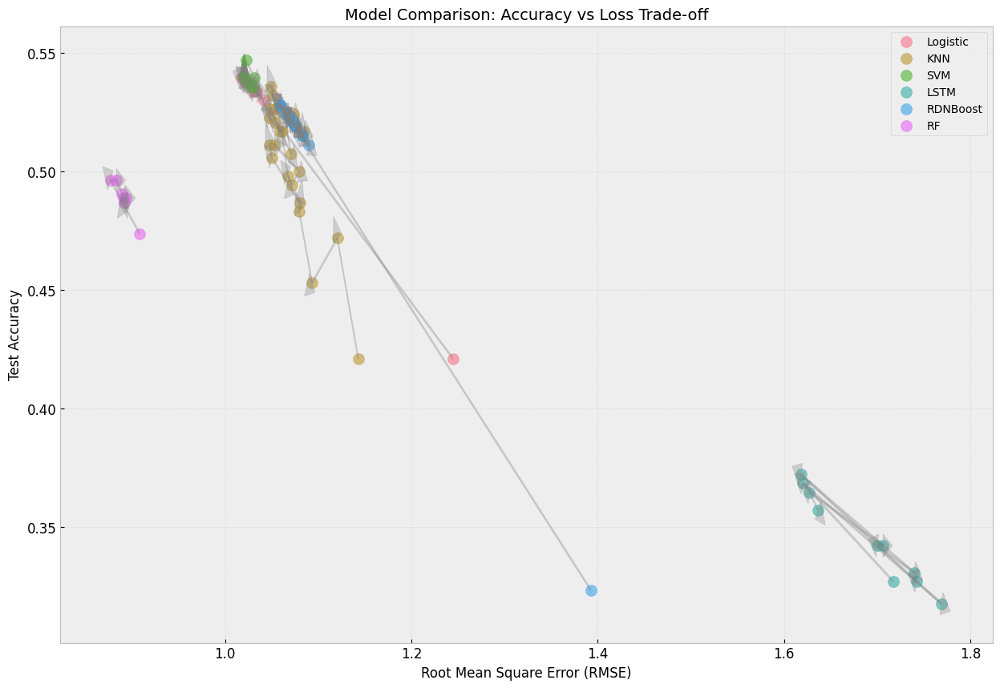

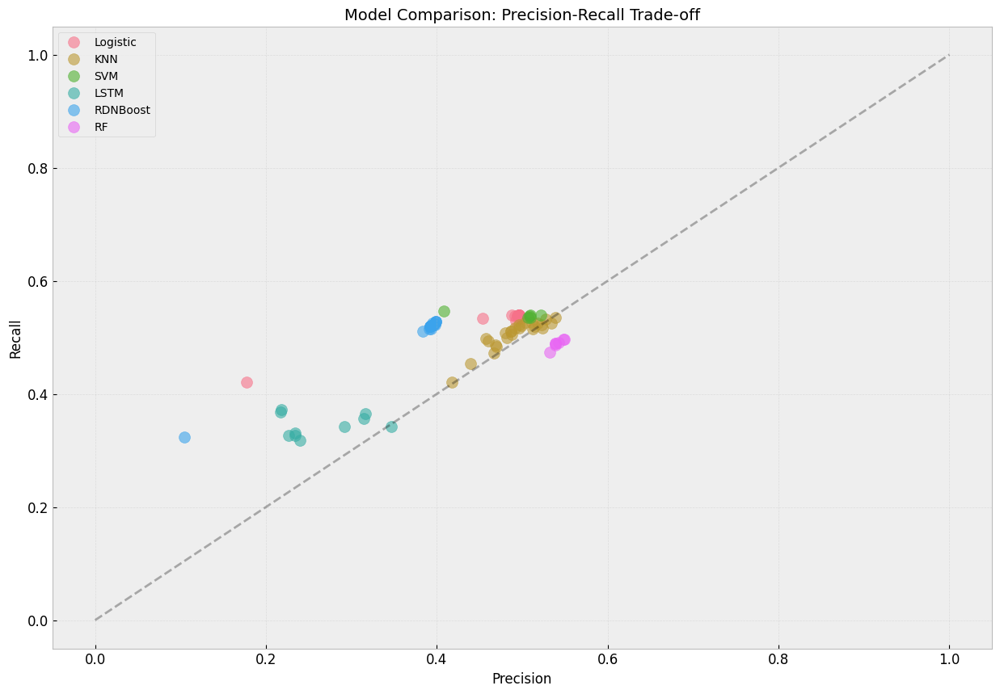

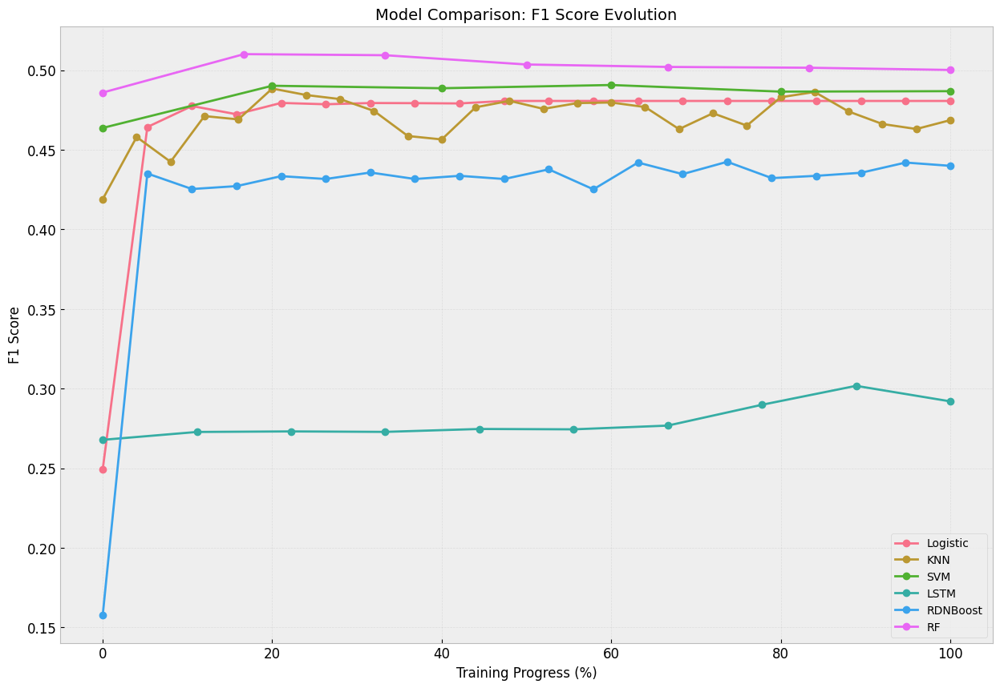

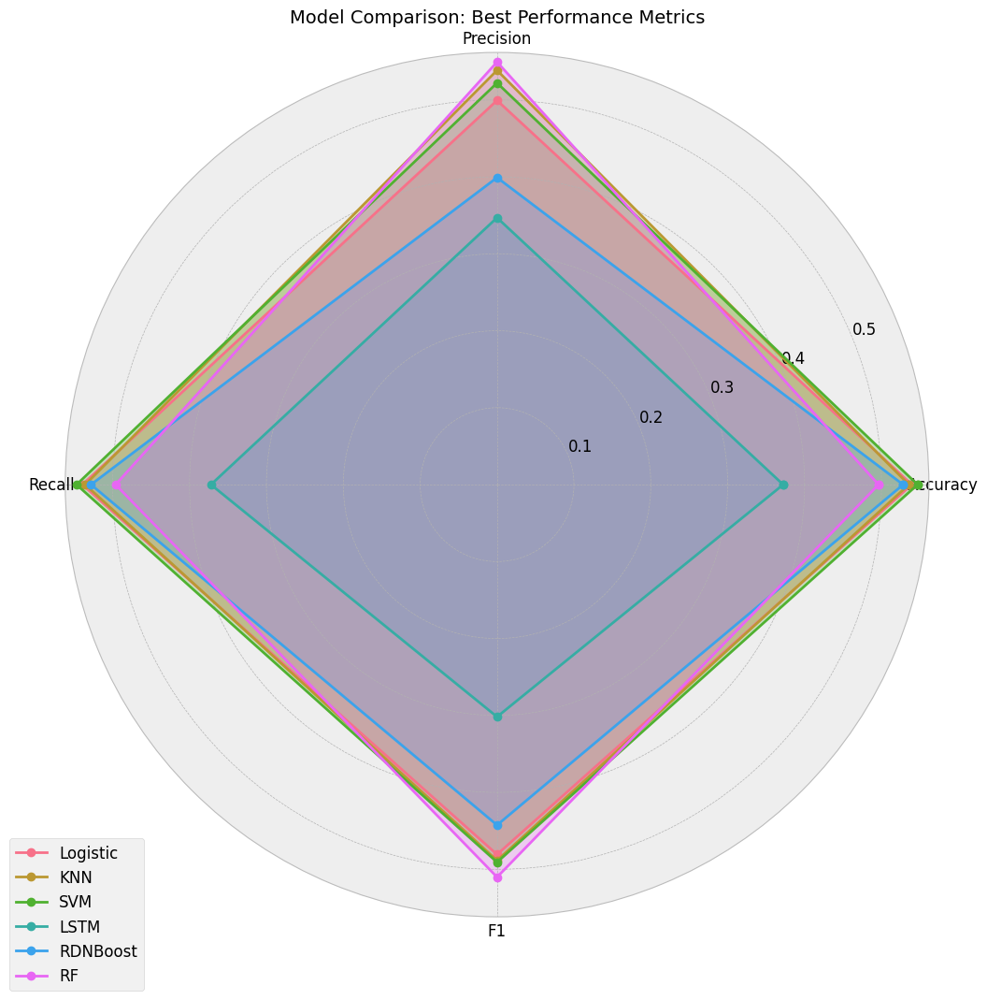

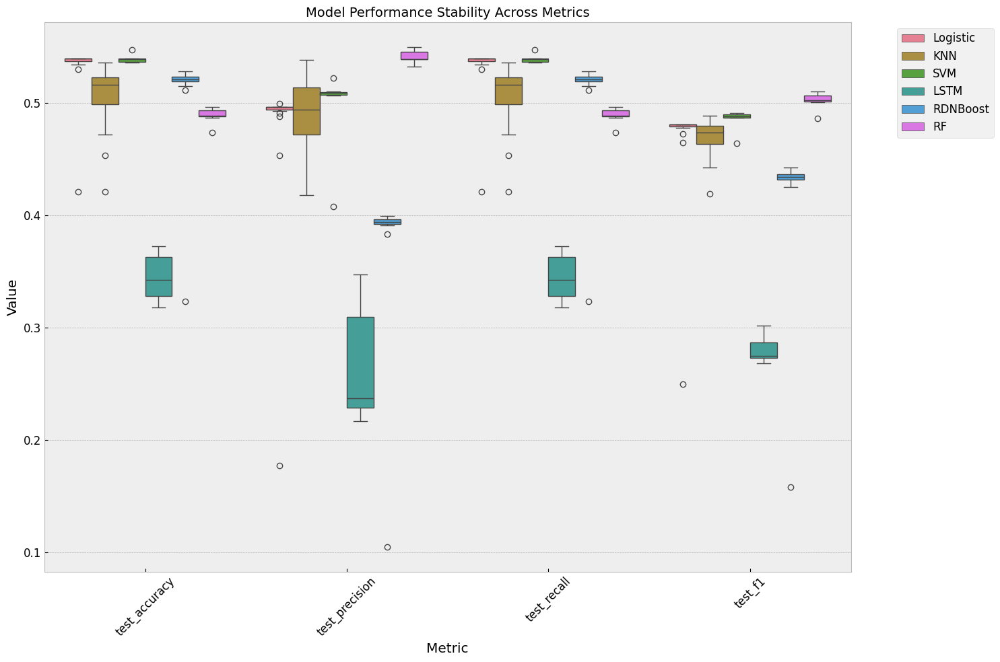

In [278]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# set style
plt.style.use('bmh')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12

def create_comparative_plots():
    models = {
        'Logistic': (metrics_logistic, iterations),
        'KNN': (metrics_knn, neighbors_range),
        'SVM': (metrics_svm, c_values),
        'LSTM': (metrics_lstm, epochs),
        'RDNBoost': (metrics_rdnboost, rdnboost_iterations),
        'RF': (metrics_rf, n_estimators)
    }

    # 1. Original Accuracy vs Loss Plot
    plt.figure(figsize=(15, 10))
    for model_name, (metrics_tuple, _) in models.items():
        metrics = get_metrics(metrics_tuple)
        plt.scatter(metrics['test_rmse'], metrics['test_accuracy'], 
                   label=model_name, alpha=0.6, s=100)
        
        # Add arrows
        for i in range(len(metrics['test_rmse'])-1):
            plt.arrow(metrics['test_rmse'][i], metrics['test_accuracy'][i],
                     metrics['test_rmse'][i+1]-metrics['test_rmse'][i], 
                     metrics['test_accuracy'][i+1]-metrics['test_accuracy'][i],
                     head_width=0.01, head_length=0.01, fc='gray', ec='gray', alpha=0.3)
    
    plt.title('Model Comparison: Accuracy vs Loss Trade-off', fontsize=14)
    plt.xlabel('Root Mean Square Error (RMSE)', fontsize=12)
    plt.ylabel('Test Accuracy', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.show()

    # 2. Precision-Recall Trade-off
    plt.figure(figsize=(15, 10))
    for model_name, (metrics_tuple, _) in models.items():
        metrics = get_metrics(metrics_tuple)
        plt.scatter(metrics['test_precision'], metrics['test_recall'], 
                   label=model_name, alpha=0.6, s=100)
        
    plt.plot([0, 1], [0, 1], 'k--', alpha=0.3)  # diagonal line
    plt.title('Model Comparison: Precision-Recall Trade-off', fontsize=14)
    plt.xlabel('Precision', fontsize=12)
    plt.ylabel('Recall', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.show()

    # 3. F1 Score Evolution
    plt.figure(figsize=(15, 10))
    for model_name, (metrics_tuple, param_values) in models.items():
        metrics = get_metrics(metrics_tuple)
        # Normalize parameter values to percentage
        x_vals = np.linspace(0, 100, len(metrics['test_f1']))
        plt.plot(x_vals, metrics['test_f1'], label=model_name, marker='o')
    
    plt.title('Model Comparison: F1 Score Evolution', fontsize=14)
    plt.xlabel('Training Progress (%)', fontsize=12)
    plt.ylabel('F1 Score', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.show()

    # 4. Radar Chart (existing)
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection='polar')
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1']
    angles = np.linspace(0, 2*np.pi, len(metrics_names), endpoint=False)
    
    for model_name, (metrics_tuple, _) in models.items():
        metrics = get_metrics(metrics_tuple)
        values = [
            np.max(metrics['test_accuracy']),
            np.max(metrics['test_precision']),
            np.max(metrics['test_recall']),
            np.max(metrics['test_f1'])
        ]
        values += values[:1]
        angles_plot = np.concatenate((angles, [angles[0]]))
        ax.plot(angles_plot, values, 'o-', linewidth=2, label=model_name)
        ax.fill(angles_plot, values, alpha=0.25)
    
    ax.set_xticks(angles)
    ax.set_xticklabels(metrics_names)
    plt.title('Model Comparison: Best Performance Metrics', fontsize=14)
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.show()

    # 5. Performance Stability (Box Plots)
    plt.figure(figsize=(15, 10))
    metrics_to_plot = ['test_accuracy', 'test_precision', 'test_recall', 'test_f1']
    data_for_box = []
    
    for model_name, (metrics_tuple, _) in models.items():
        metrics = get_metrics(metrics_tuple)
        for metric in metrics_to_plot:
            for value in metrics[metric]:
                data_for_box.append({
                    'Model': model_name,
                    'Metric': metric,
                    'Value': value
                })
    
    df_box = pd.DataFrame(data_for_box)
    sns.boxplot(x='Metric', y='Value', hue='Model', data=df_box)
    plt.title('Model Performance Stability Across Metrics', fontsize=14)
    plt.xticks(rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


# Create all plots
create_comparative_plots()

## Feature Selection Model Training

These models will be trained with datasets created from our previous feature selection methods. Each of the four models used a specific selection method that corresponded well with the model type. 

In [28]:
missing_features = ['Home Team', 'Match Outcome', 'Date'] # removed during feature selection

logistic_df = df[missing_features + logistic_features]
knn_df = df[missing_features + knn_features]
svm_df = df[missing_features + svm_features]
lstm_df = df[missing_features + lstm_features]
rf_df = df[missing_features + rf_features]
rdnboost_df = df.copy()

In [29]:
print('Preprocessing Data...')
missing_features = ['Home Team', 'Match Outcome', 'Date'] # removed during feature selection

# encoding and standardising for each of the four feature sets
logistic_df = encode_teams(logistic_df)
knn_df = encode_teams(knn_df)
svm_df = encode_teams(svm_df)
lstm_df = encode_teams(lstm_df)
rf_df = encode_teams(rf_df)
rdnboost_df = encode_teams(rdnboost_df)


logistic_df = standardize_features(logistic_df, logistic_features)
knn_df = standardize_features(knn_df, knn_features)
svm_df = standardize_features(svm_df, svm_features)
lstm_df = standardize_features(lstm_df, lstm_features)
rf_df = standardize_features(rf_df, rf_features)
rdnboost_df = standardize_features(rdnboost_df, None)

# split the data into X (data) and y (target) for training and testing
logistic_train_df, logistic_test_df = chronological_split(logistic_df)
knn_train_df, knn_test_df = chronological_split(knn_df)
svm_train_df, svm_test_df = chronological_split(svm_df)
lstm_train_df, lstm_test_df = chronological_split(lstm_df)
rf_train_df, rf_test_df = chronological_split(rf_df)
rdnboost_train_df, rdnboost_test_df = chronological_split(rdnboost_df)

logistic_X_train, logistic_y_train = logistic_train_df.drop('Match Outcome', axis=1), logistic_train_df['Match Outcome']
logistic_X_test, logistic_y_test = logistic_test_df.drop('Match Outcome', axis=1), logistic_test_df['Match Outcome']

knn_X_train, knn_y_train = knn_train_df.drop('Match Outcome', axis=1), knn_train_df['Match Outcome']
knn_X_test, knn_y_test = knn_test_df.drop('Match Outcome', axis=1), knn_test_df['Match Outcome']

svm_X_train, svm_y_train = svm_train_df.drop('Match Outcome', axis=1), svm_train_df['Match Outcome']
svm_X_test, svm_y_test = svm_test_df.drop('Match Outcome', axis=1), svm_test_df['Match Outcome']

lstm_X_train, lstm_y_train = lstm_train_df.drop('Match Outcome', axis=1), lstm_train_df['Match Outcome']
lstm_X_test, lstm_y_test = lstm_test_df.drop('Match Outcome', axis=1), lstm_test_df['Match Outcome']

rf_X_train, rf_y_train = rf_train_df.drop('Match Outcome', axis=1), rf_train_df['Match Outcome']
rf_X_test, rf_y_test = rf_test_df.drop('Match Outcome', axis=1), rf_test_df['Match Outcome']

rdnboost_X_train, rdnboost_y_train = rdnboost_train_df.drop('Match Outcome', axis=1), rdnboost_train_df['Match Outcome']
rdnboost_X_test, rdnboost_y_test = rdnboost_test_df.drop('Match Outcome', axis=1), rdnboost_test_df['Match Outcome']



Preprocessing Data...


In [37]:
# Model Training
print('Starting Training...')
trainer = RecencyModelTrainingNew()

iterations = np.arange(0, 200, 10)
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
n_estimators_range = [10, 50, 100, 150, 200, 250, 300]

metrics_logistic2 = trainer.train_with_iterations(logistic_X_train, logistic_y_train, logistic_X_test, logistic_y_test, iterations)
metrics_knn2 = trainer.train_and_evaluate_knn(knn_X_train, knn_y_train, knn_X_test, knn_y_test, neighbors_range)
metrics_svm2 = trainer.train_and_evaluate_svm(svm_X_train, svm_y_train, svm_X_test, svm_y_test)
metrics_lstm2 = trainer.train_and_evaluate_lstm(lstm_X_train, lstm_y_train, lstm_X_test, lstm_y_test)
metrics_rdnboost2 = trainer.train_and_evaluate_rdnboost(logistic_X_train, logistic_y_train, logistic_X_test, logistic_y_test, iterations)
metrics_rf2 = trainer.train_and_evaluate_rf(logistic_X_train, logistic_y_train, logistic_X_test, logistic_y_test, n_estimators_range)

Starting Training...


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being s

13/67 [====>.........................] - ETA: 0s 

2024-12-03 21:46:25.660606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:46:25.720631: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:46:25.752065: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


10/67 [===>..........................] - ETA: 0s - loss: 1.0041 - accuracy: 0.5094

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9772 - accuracy: 0.5243

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

10/67 [===>..........................] - ETA: 0s - loss: 0.9538 - accuracy: 0.5719

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

11/67 [===>..........................] - ETA: 0s - loss: 1.0054 - accuracy: 0.4915

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9309 - accuracy: 0.5556

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

 9/67 [===>..........................] - ETA: 0s - loss: 0.9586 - accuracy: 0.5486

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

11/67 [===>..........................] - ETA: 0s - loss: 0.8920 - accuracy: 0.6080

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

11/67 [===>..........................] - ETA: 0s - loss: 0.8839 - accuracy: 0.5852

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

11/67 [===>..........................] - ETA: 0s - loss: 0.9218 - accuracy: 0.5426

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

17/17 [==============================] - 0s 3ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 0: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 10: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 20: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 30: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 40: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 50: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 60: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 70: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 80: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 90: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 100: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 110: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 120: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 130: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 140: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 150: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 160: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 170: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 180: No features were selected. Please check your feature selection criteria.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Class weights: {0: 1.011887779362815, 1: 1.5353535353535352, 2: 0.7350604490500864}


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:307: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


Warning at iteration 190: No features were selected. Please check your feature selection criteria.


Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.5531015037593985, 0.568609022556391, 0.568609022556391, 0.5704887218045113, 0.569078947368421, 0.5676691729323309, 0.5700187969924813, 0.5709586466165414, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511, 0.5695488721804511]
Parameter Values: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.5263157894736842, 0.5244360902255639, 0.5338345864661654, 0.5338345864661654, 0.5319548872180451, 0.5244360902255639, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046, 0.5281954887218046]
Parameter

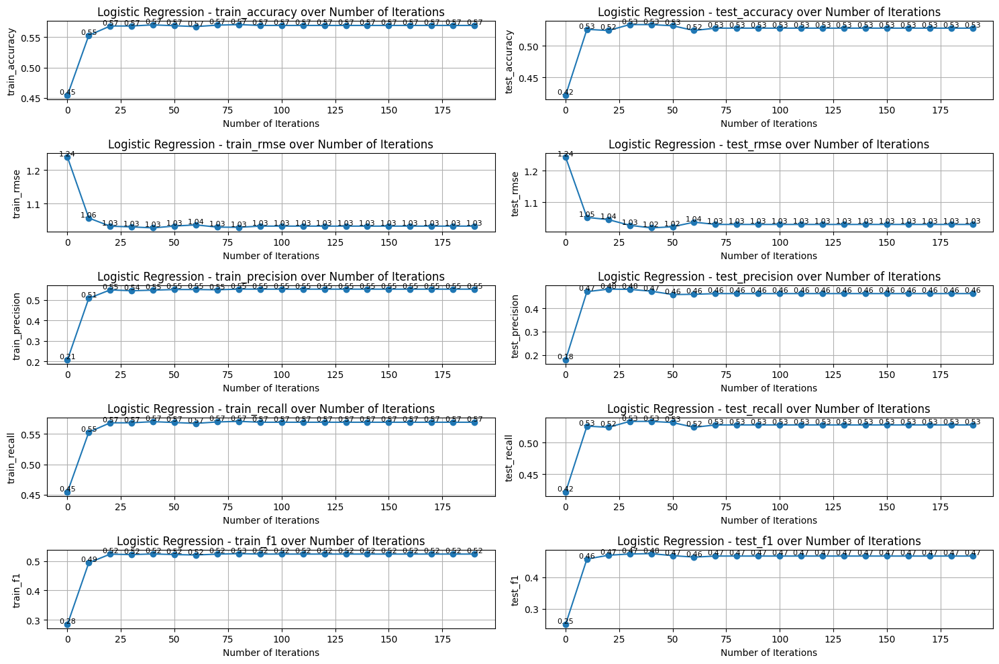

Plotting Metric: train_accuracy
Metric Data: [1.0, 0.6992481203007519, 0.631578947368421, 0.6221804511278195, 0.6217105263157895, 0.6094924812030075, 0.5939849624060151, 0.5869360902255639, 0.5888157894736842, 0.5789473684210527, 0.5761278195488722, 0.5770676691729323, 0.568609022556391, 0.5662593984962406, 0.5643796992481203, 0.5615601503759399, 0.5639097744360902, 0.555921052631579, 0.5526315789473685, 0.5512218045112782, 0.5516917293233082, 0.5493421052631579, 0.5540413533834586, 0.5531015037593985, 0.5535714285714286, 0.5554511278195489]
Parameter Values: [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
Plotting Metric: test_accuracy
Metric Data: [0.4342105263157895, 0.45300751879699247, 0.46616541353383456, 0.4793233082706767, 0.4830827067669173, 0.4906015037593985, 0.4924812030075188, 0.5037593984962406, 0.5075187969924813, 0.5206766917293233, 0.5112781954887218, 0.518796992481203, 0.5112781954887218, 0.518796992481203, 0.5244360

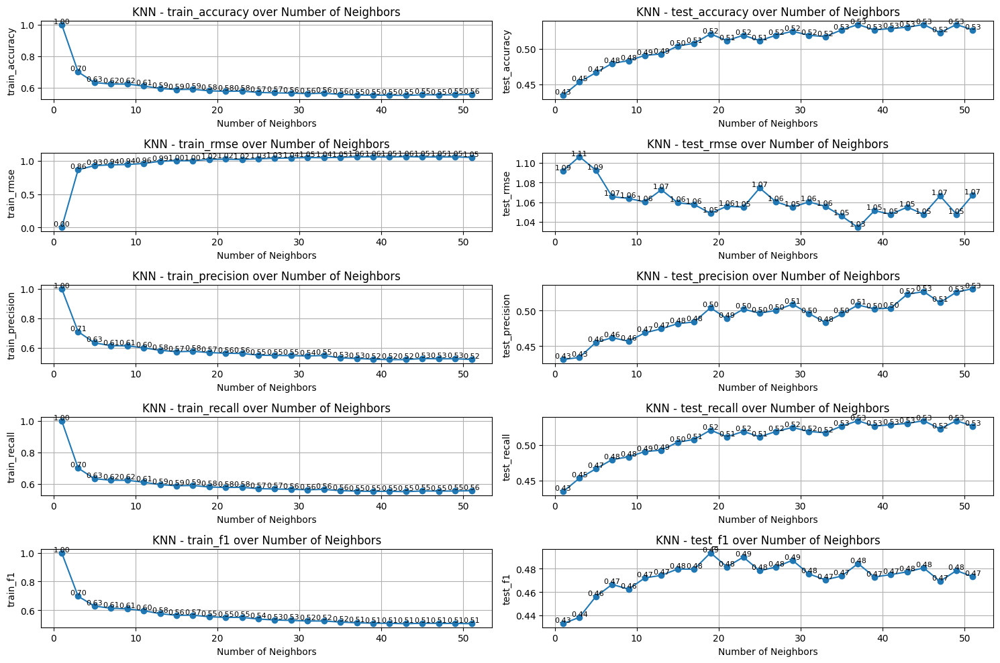

Plotting Metric: train_accuracy
Metric Data: [0.5625, 0.5625, 0.5657894736842105, 0.5639097744360902, 0.5625, 0.5625]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_accuracy
Metric Data: [0.5394736842105263, 0.556390977443609, 0.5469924812030075, 0.5601503759398496, 0.5507518796992481, 0.5545112781954887]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_rmse
Metric Data: [1.0481813824554964, 1.0373658079717454, 1.0296360405210423, 1.0346442489109535, 1.0394023007753748, 1.0380450828287577]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: test_rmse
Metric Data: [1.0369127108512135, 1.006557447310804, 1.0, 0.9848476085314292, 1.0037523583994616, 0.9962335082737976]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
Plotting Metric: train_precision
Metric Data: [0.4382396388109028, 0.5112749555726508, 0.5375695563857489, 0.5360877634797719, 0.5380352004629858, 0.5372064217463843]
Parameter Values: [0.1, 0.5, 1.0, 2.0, 5.0, 

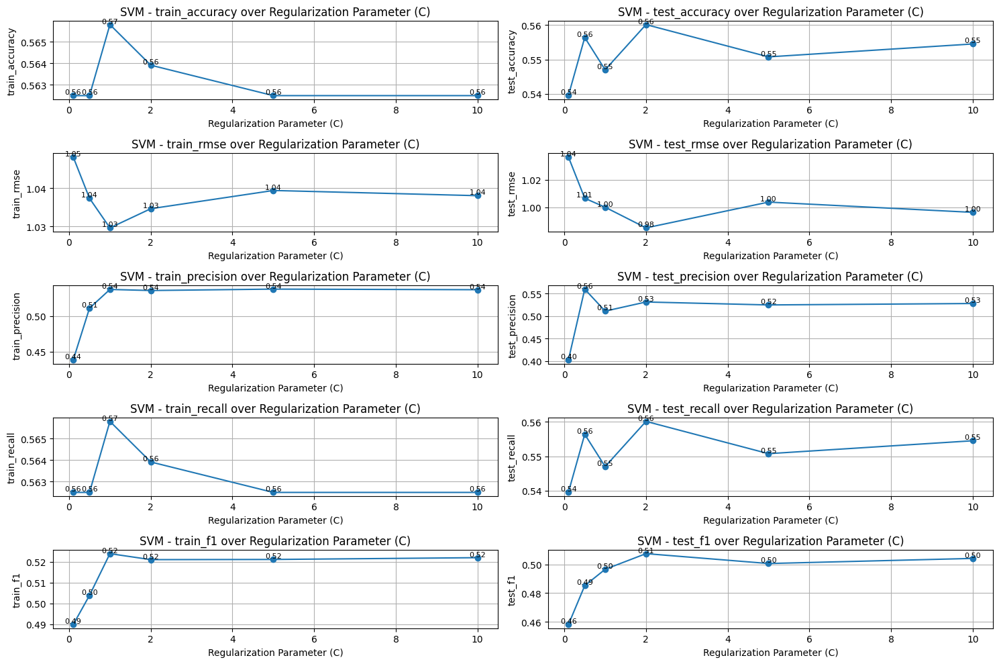

Plotting Metric: train_accuracy
Metric Data: [0.44783834586466165, 0.412593984962406, 0.3801691729323308, 0.37406015037593987, 0.3341165413533835, 0.34022556390977443, 0.36654135338345867, 0.3933270676691729, 0.3773496240601504, 0.3900375939849624]
Parameter Values: range(1, 11)
Plotting Metric: test_accuracy
Metric Data: [0.41353383458646614, 0.37781954887218044, 0.34962406015037595, 0.34398496240601506, 0.31390977443609025, 0.3176691729323308, 0.34022556390977443, 0.35526315789473684, 0.3458646616541353, 0.3533834586466165]
Parameter Values: range(1, 11)
Plotting Metric: train_rmse
Metric Data: [1.3377121081198773, 1.532388425208924, 1.636347022775844, 1.6629815148693001, 1.740846091066627, 1.7325933450316957, 1.6907254749304947, 1.6347667741959517, 1.6731234578665013, 1.6450826704093637]
Parameter Values: range(1, 11)
Plotting Metric: test_rmse
Metric Data: [1.3136072128967762, 1.576376352910382, 1.6763503142063862, 1.6980749826248962, 1.768032762599172, 1.7616422618246352, 1.710757

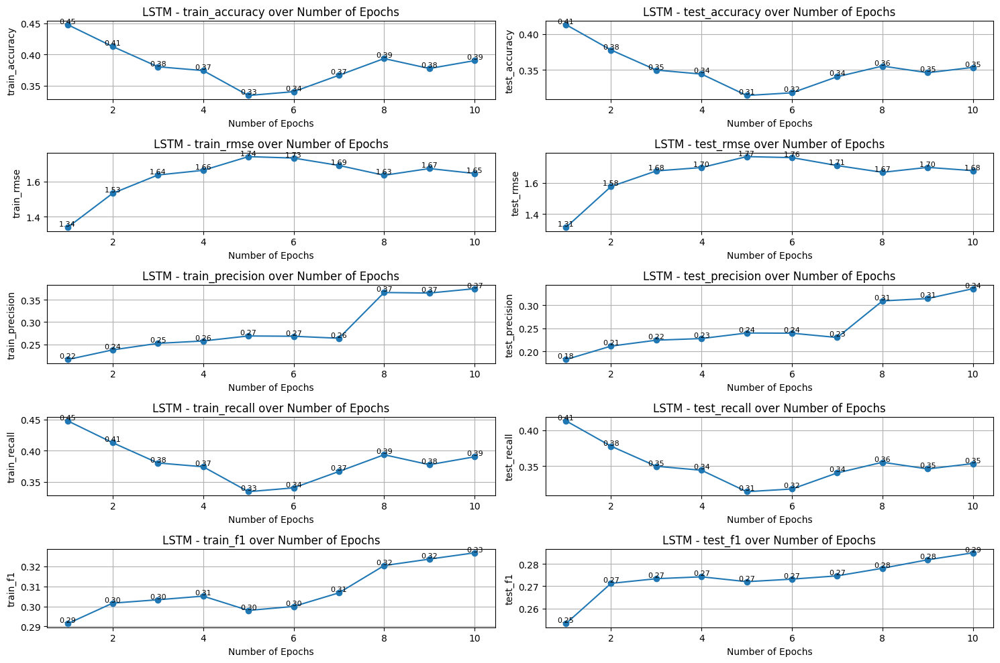

Plotting Metric: train_accuracy
Metric Data: [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]
Parameter Values: [ 10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170 180
 190 200]


TypeError: unsupported format string passed to NoneType.__format__

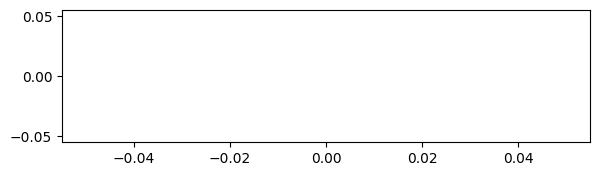

In [38]:
# Define parameter ranges
iterations = np.arange(0, 200, 10)  # for logistic regression [0, 10, ..., 190]
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
c_values = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]  # for SVM
epochs = range(1, 11)  # for LSTM [1, 2, ..., 10]
rdnboost_iterations = np.arange(10, 210, 10)  # for RDNBoost [10, 20, ..., 200]
n_estimators = [10, 50, 100, 150, 200, 250, 300]  # for Random Forest

# Helper function to safely get metrics
def get_metrics(metrics_obj):
    if isinstance(metrics_obj, tuple):
        return metrics_obj[0]
    return metrics_obj

# Plot metrics for each model
trainer.plot_metrics(get_metrics(metrics_logistic2), "Logistic Regression", 
                    param_values=iterations,
                    param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_knn2), "KNN", 
                    param_values=neighbors_range,
                    param_name="Number of Neighbors")

trainer.plot_metrics(get_metrics(metrics_svm2), "SVM", 
                    param_values=c_values,
                    param_name="Regularization Parameter (C)")

trainer.plot_metrics(get_metrics(metrics_lstm2), "LSTM", 
                    param_values=epochs,
                    param_name="Number of Epochs")

trainer.plot_metrics(get_metrics(metrics_rdnboost2), "RDNBoost", 
                    param_values=rdnboost_iterations,
                    param_name="Number of Iterations")

trainer.plot_metrics(get_metrics(metrics_rf2), "Random Forest", 
                    param_values=n_estimators,
                    param_name="Number of Trees")


## Embedded Feature Selection Model Training

In the following selection, we will focus on embedded feature selection methods. For the Logistic Regression model, we will use the entire recency data set and try out LASSO regression, Ridge regression, and Elastic Net regularisation to see which technique fairs best.

The KNN model does not support any traditional regularisation techniques as it is non-parametric. It is possible to indirectly apply regularisation-like effects to the model. However, we will not be looking at these indirect methods. 

SVM models, on the other hand, do support traditional regularisation techniques. We will implement L1 and L2 regression. Elastic Net regularisation is not very commonly used and will not be tested.

Similarly, LSTM models allow L1 and L2 regression techniques that control the weights of the model. Furthermore, we will implemented drop out regularisation - where a fraction of the neurons are randomly removed to prevent highly correlated units.  

In [318]:
print('Preprocessing Data...')


full_df = encode_teams(df)
full_df = standardize_features(full_df, numerical_features)

full_train_df, full_test_df = chronological_split(full_df)

full_X_train, full_y_train = full_train_df.drop('Match Outcome', axis=1), full_train_df['Match Outcome']
full_X_test, full_y_test = full_test_df.drop('Match Outcome', axis=1), full_test_df['Match Outcome']

Preprocessing Data...


In [319]:
# Model Training
print('Starting Training...')
trainer = RecencyModelTrainingNew()

iterations = np.arange(0, 200, 10)
neighbors_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]

metrics_logistic_l1 = trainer.train_with_iterations_l1(full_X_train, full_y_train, full_X_test, full_y_test, iterations)
metrics_logistic_l2 = trainer.train_with_iterations_l2(full_X_train, full_y_train, full_X_test, full_y_test, iterations)
metrics_logistic_l1_l2 = trainer.train_with_iterations_l1_l2(full_X_train, full_y_train, full_X_test, full_y_test, iterations, l1_ratio=0.5)

metrics_svm_l1 = trainer.train_and_evaluate_svm_l1(full_X_train, full_y_train, full_X_test, full_y_test)
metrics_svm_l2 = trainer.train_and_evaluate_svm_l2(full_X_train, full_y_train, full_X_test, full_y_test)

metrics_lstm_l1 = trainer.train_and_evaluate_lstm_l1(full_X_train, full_y_train, full_X_test, full_y_test)
metrics_lstm_l2 = trainer.train_and_evaluate_lstm_l2(full_X_train, full_y_train, full_X_test, full_y_test)
metrics_lstm_l1_l2 = trainer.train_and_evaluate_lstm_l1_l2(full_X_train, full_y_train, full_X_test, full_y_test)
metrics_lstm_dropout = trainer.train_and_evaluate_lstm_dropout(full_X_train, full_y_train, full_X_test, full_y_test)

metrics_rf_importance = trainer.train_and_evaluate_rf_importance(full_X_train, full_y_train, full_X_test, full_y_test)  # Basic feature importance
metrics_rf_l1 = trainer.train_and_evaluate_rf_selectfrommodel(full_X_train, full_y_train, full_X_test, full_y_test)    # SelectFromModel (L1-like)
metrics_rf_rfe = trainer.train_and_evaluate_rf_rfe(full_X_train, full_y_train, full_X_test, full_y_test)               # Recursive Feature Elimination


Starting Training...


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to conver

Logistic Regression => LASSO Regularisation Selected Features (max_iter=190): ['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Defense Strength Away Last 1 Games', 'Avg Defense Strength Away Last 3 Games', 'Avg Defense Strength Away Last 4 Games', 'Avg Recent Performance Home

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Prec

Logistic Regression => Ridge Regression Selected Features (max_iter=190): Every feature. Just different weights.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter 

Logistic Regression => Elastic Net Selected Features (max_iter=190): ['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield Strength Away Last 3 Games', 'Avg Midfield Strength Home Last 4 Games', 'Avg Midfield Strength Away Last 5 Games', 'Avg Defense Strength Away Last 1 Games', 'Avg Defense Strength Home Last 3 Game

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=0.5): 42/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield Strength Away Last 2 Games', 'Avg Midfield

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=1.0): 44/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 4 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Home Last 5 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength 

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=2.0): 47/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 4 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Home Last 2 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength Away Last 1 Games', 'Avg Midfield Strength Home Last 2 Games', 'Avg Midfield St

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=5.0): 52/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Home Last 2 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Away Last 3 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last 4 Games', 'Avg Attack Strength Away Last 4 Games', 'Avg Attack Strength Away Last 5 Games', 'Avg Midfield Strength Home Last 1 Games', 'Avg Midfield Strength

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L1 Regularization (C=10.0): 59/60

['Avg Goals Scored Home Last 1 Games', 'Avg Goals Scored Away Last 1 Games', 'Avg Goals Scored Home Last 2 Games', 'Avg Goals Scored Away Last 2 Games', 'Avg Goals Scored Home Last 3 Games', 'Avg Goals Scored Away Last 3 Games', 'Avg Goals Scored Home Last 4 Games', 'Avg Goals Scored Away Last 4 Games', 'Avg Goals Scored Home Last 5 Games', 'Avg Goals Scored Away Last 5 Games', 'Avg Goals Conceded Home Last 1 Games', 'Avg Goals Conceded Away Last 1 Games', 'Avg Goals Conceded Home Last 2 Games', 'Avg Goals Conceded Away Last 2 Games', 'Avg Goals Conceded Away Last 3 Games', 'Avg Goals Conceded Home Last 4 Games', 'Avg Goals Conceded Away Last 4 Games', 'Avg Goals Conceded Home Last 5 Games', 'Avg Goals Conceded Away Last 5 Games', 'Avg Attack Strength Home Last 1 Games', 'Avg Attack Strength Away Last 1 Games', 'Avg Attack Strength Home Last 2 Games', 'Avg Attack Strength Away Last 2 Games', 'Avg Attack Strength Home Last

/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L2 Regularisation (C=2.0): Every feature. Just different weights.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L2 Regularisation (C=5.0): Every feature. Just different weights.


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM => Selected Features with L2 Regularisation (C=10.0): Every feature. Just different weights.


2024-12-03 20:41:25.083396: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:25.571023: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:26.154375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:26.816511: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:27.509202: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 12s 104ms/step - loss: 16.6827 - accuracy: 0.4455


2024-12-03 20:41:35.490982: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:35.587429: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:35.890991: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/2


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:41:38.219645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:38.572623: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 10s 97ms/step - loss: 16.8274 - accuracy: 0.4535
Epoch 2/2
67/67 [==============================] - 2s 35ms/step - loss: 3.4901 - accuracy: 0.4535


2024-12-03 20:41:50.030853: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:50.147185: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:50.435790: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/3


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:41:52.588530: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:41:52.906415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 107ms/step - loss: 16.7982 - accuracy: 0.4492
Epoch 2/3
67/67 [==============================] - 2s 36ms/step - loss: 3.4842 - accuracy: 0.4535
Epoch 3/3
67/67 [==============================] - 3s 41ms/step - loss: 1.1314 - accuracy: 0.4535


2024-12-03 20:42:08.626547: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:08.697595: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:09.033561: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/4


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:42:11.580077: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:11.915060: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 13s 125ms/step - loss: 16.7770 - accuracy: 0.4314
Epoch 2/4
67/67 [==============================] - 3s 39ms/step - loss: 3.4733 - accuracy: 0.4535
Epoch 3/4
67/67 [==============================] - 3s 39ms/step - loss: 1.1317 - accuracy: 0.4535
Epoch 4/4
67/67 [==============================] - 3s 39ms/step - loss: 1.1059 - accuracy: 0.4535


2024-12-03 20:42:31.087319: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:31.153019: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:31.468477: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/5


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:42:33.900245: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:34.152864: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 112ms/step - loss: 16.7757 - accuracy: 0.4502
Epoch 2/5
67/67 [==============================] - 2s 36ms/step - loss: 3.4822 - accuracy: 0.4535
Epoch 3/5
67/67 [==============================] - 3s 43ms/step - loss: 1.1310 - accuracy: 0.4535
Epoch 4/5
67/67 [==============================] - 3s 37ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 5/5
67/67 [==============================] - 3s 38ms/step - loss: 1.1053 - accuracy: 0.4535


2024-12-03 20:42:54.776844: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:54.843305: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:55.144577: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/6


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:42:57.651489: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:42:57.945228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 105ms/step - loss: 16.8021 - accuracy: 0.4220
Epoch 2/6
67/67 [==============================] - 2s 36ms/step - loss: 3.4761 - accuracy: 0.4535
Epoch 3/6
67/67 [==============================] - 2s 36ms/step - loss: 1.1308 - accuracy: 0.4535
Epoch 4/6
67/67 [==============================] - 2s 35ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 5/6
67/67 [==============================] - 3s 46ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 6/6
67/67 [==============================] - 2s 36ms/step - loss: 1.1055 - accuracy: 0.4535


2024-12-03 20:43:20.435018: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:43:20.503034: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:43:20.788712: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/7


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:43:24.067410: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:43:24.595159: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 12s 104ms/step - loss: 16.7863 - accuracy: 0.4394
Epoch 2/7
67/67 [==============================] - 2s 37ms/step - loss: 3.4866 - accuracy: 0.4535
Epoch 3/7
67/67 [==============================] - 3s 47ms/step - loss: 1.1318 - accuracy: 0.4535
Epoch 4/7
67/67 [==============================] - 3s 37ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 5/7
67/67 [==============================] - 2s 36ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 6/7
67/67 [==============================] - 2s 35ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 7/7
67/67 [==============================] - 2s 35ms/step - loss: 1.1055 - accuracy: 0.4535


2024-12-03 20:43:49.367904: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:43:49.430761: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:43:49.725670: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/8


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:43:51.901942: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:43:52.142620: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 10s 102ms/step - loss: 16.7159 - accuracy: 0.4511
Epoch 2/8
67/67 [==============================] - 2s 36ms/step - loss: 3.4616 - accuracy: 0.4535
Epoch 3/8
67/67 [==============================] - 2s 35ms/step - loss: 1.1310 - accuracy: 0.4535
Epoch 4/8
67/67 [==============================] - 3s 38ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 5/8
67/67 [==============================] - 2s 36ms/step - loss: 1.1050 - accuracy: 0.4535
Epoch 6/8
67/67 [==============================] - 2s 35ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 7/8
67/67 [==============================] - 2s 35ms/step - loss: 1.1051 - accuracy: 0.4535
Epoch 8/8
67/67 [==============================] - 2s 37ms/step - loss: 1.1049 - accuracy: 0.4535


2024-12-03 20:44:18.507788: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:44:18.586465: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:44:18.881235: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/9


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:44:21.129006: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:44:21.601790: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 105ms/step - loss: 16.7651 - accuracy: 0.4394
Epoch 2/9
67/67 [==============================] - 3s 38ms/step - loss: 3.4779 - accuracy: 0.4535
Epoch 3/9
67/67 [==============================] - 2s 36ms/step - loss: 1.1312 - accuracy: 0.4535
Epoch 4/9
67/67 [==============================] - 2s 36ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 5/9
67/67 [==============================] - 2s 37ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 6/9
67/67 [==============================] - 2s 36ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 7/9
67/67 [==============================] - 2s 36ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 8/9
67/67 [==============================] - 2s 36ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 9/9
67/67 [==============================] - 2s 34ms/step - loss: 1.1054 - accuracy: 0.4535


2024-12-03 20:44:50.962137: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:44:51.023249: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:44:51.333726: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/10


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:44:53.650982: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:44:54.078317: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 114ms/step - loss: 16.8943 - accuracy: 0.4398
Epoch 2/10
67/67 [==============================] - 2s 36ms/step - loss: 3.5251 - accuracy: 0.4535
Epoch 3/10
67/67 [==============================] - 2s 35ms/step - loss: 1.1320 - accuracy: 0.4535
Epoch 4/10
67/67 [==============================] - 2s 35ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 5/10
67/67 [==============================] - 2s 34ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 6/10
67/67 [==============================] - 2s 36ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 7/10
67/67 [==============================] - 3s 38ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 8/10
67/67 [==============================] - 3s 41ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 9/10
67/67 [==============================] - 3s 45ms/step - loss: 1.1051 - accuracy: 0.4535
Epoch 10/10
67/67 [==============================] - 3s 38ms/step - loss: 1.1050 - accuracy: 0.4535


2024-12-03 20:45:27.163112: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:45:27.229843: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:45:27.572456: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/11


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:45:30.014975: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:45:30.332965: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 12s 117ms/step - loss: 16.7374 - accuracy: 0.4544
Epoch 2/11
67/67 [==============================] - 3s 40ms/step - loss: 3.4828 - accuracy: 0.4535
Epoch 3/11
67/67 [==============================] - 2s 37ms/step - loss: 1.1312 - accuracy: 0.4535
Epoch 4/11
67/67 [==============================] - 3s 38ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 5/11
67/67 [==============================] - 3s 38ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 6/11
67/67 [==============================] - 3s 41ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 7/11
67/67 [==============================] - 3s 39ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 8/11
67/67 [==============================] - 2s 37ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 9/11
67/67 [==============================] - 3s 44ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 10/11
67/67 [==============================] - 2s 36ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 11/11
67/67

2024-12-03 20:46:07.193339: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:07.256900: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:07.568113: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/12


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:46:09.846611: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:10.100507: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 107ms/step - loss: 16.6935 - accuracy: 0.4417
Epoch 2/12
67/67 [==============================] - 3s 44ms/step - loss: 3.4523 - accuracy: 0.4535
Epoch 3/12
67/67 [==============================] - 3s 49ms/step - loss: 1.1310 - accuracy: 0.4535
Epoch 4/12
67/67 [==============================] - 3s 52ms/step - loss: 1.1059 - accuracy: 0.4535
Epoch 5/12
67/67 [==============================] - 2s 37ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 6/12
67/67 [==============================] - 2s 35ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 7/12
67/67 [==============================] - 3s 38ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 8/12
67/67 [==============================] - 3s 38ms/step - loss: 1.1057 - accuracy: 0.4535
Epoch 9/12
67/67 [==============================] - 3s 38ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 10/12
67/67 [==============================] - 2s 35ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 11/12
67/67

2024-12-03 20:46:49.576229: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:49.639321: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:49.940888: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/13


2024-12-03 20:46:52.327100: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:52.656646: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:53.149328: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:53.860086: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:46:54.591233: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 14s 148ms/step - loss: 16.7127 - accuracy: 0.4469
Epoch 2/13
67/67 [==============================] - 3s 38ms/step - loss: 3.4715 - accuracy: 0.4535
Epoch 3/13
67/67 [==============================] - 2s 35ms/step - loss: 1.1312 - accuracy: 0.4535
Epoch 4/13
67/67 [==============================] - 2s 35ms/step - loss: 1.1057 - accuracy: 0.4535
Epoch 5/13
67/67 [==============================] - 2s 37ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 6/13
67/67 [==============================] - 2s 36ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 7/13
67/67 [==============================] - 2s 34ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 8/13
67/67 [==============================] - 2s 35ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 9/13
67/67 [==============================] - 2s 36ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 10/13
67/67 [==============================] - 3s 44ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 11/13
67/67

2024-12-03 20:47:35.134367: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:47:35.194245: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:47:35.489583: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/14


2024-12-03 20:47:39.166294: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:47:39.835910: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:47:40.132044: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:47:40.859528: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:47:41.535925: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 13s 125ms/step - loss: 16.7941 - accuracy: 0.4535
Epoch 2/14
67/67 [==============================] - 2s 37ms/step - loss: 3.4937 - accuracy: 0.4535
Epoch 3/14
67/67 [==============================] - 2s 34ms/step - loss: 1.1314 - accuracy: 0.4535
Epoch 4/14
67/67 [==============================] - 2s 35ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 5/14
67/67 [==============================] - 2s 35ms/step - loss: 1.1058 - accuracy: 0.4535
Epoch 6/14
67/67 [==============================] - 2s 35ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 7/14
67/67 [==============================] - 3s 45ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 8/14
67/67 [==============================] - 3s 39ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 9/14
67/67 [==============================] - 3s 52ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 10/14
67/67 [==============================] - 3s 38ms/step - loss: 1.1049 - accuracy: 0.4535
Epoch 11/14
67/67

2024-12-03 20:48:26.206537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:48:26.267865: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:48:26.623769: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/15


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:48:28.937052: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:48:29.467508: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 117ms/step - loss: 16.8474 - accuracy: 0.4478
Epoch 2/15
67/67 [==============================] - 3s 38ms/step - loss: 3.5039 - accuracy: 0.4535
Epoch 3/15
67/67 [==============================] - 3s 38ms/step - loss: 1.1318 - accuracy: 0.4535
Epoch 4/15
67/67 [==============================] - 3s 40ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 5/15
67/67 [==============================] - 3s 44ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 6/15
67/67 [==============================] - 3s 50ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 7/15
67/67 [==============================] - 3s 39ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 8/15
67/67 [==============================] - 3s 44ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 9/15
67/67 [==============================] - 2s 37ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 10/15
67/67 [==============================] - 2s 36ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 11/15
67/67

2024-12-03 20:49:17.536907: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:49:17.598765: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:49:17.916075: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/16


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:49:20.160119: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:49:20.605420: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 119ms/step - loss: 16.7671 - accuracy: 0.4398
Epoch 2/16
67/67 [==============================] - 3s 38ms/step - loss: 3.4810 - accuracy: 0.4535
Epoch 3/16
67/67 [==============================] - 3s 38ms/step - loss: 1.1308 - accuracy: 0.4535
Epoch 4/16
67/67 [==============================] - 3s 38ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 5/16
67/67 [==============================] - 2s 36ms/step - loss: 1.1050 - accuracy: 0.4535
Epoch 6/16
67/67 [==============================] - 2s 36ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 7/16
67/67 [==============================] - 2s 36ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 8/16
67/67 [==============================] - 3s 39ms/step - loss: 1.1050 - accuracy: 0.4535
Epoch 9/16
67/67 [==============================] - 2s 37ms/step - loss: 1.1049 - accuracy: 0.4535
Epoch 10/16
67/67 [==============================] - 2s 37ms/step - loss: 1.1051 - accuracy: 0.4535
Epoch 11/16
67/67

2024-12-03 20:50:07.925408: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:50:07.987377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:50:08.309644: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/17


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:50:10.792584: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:50:11.039181: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 12s 123ms/step - loss: 16.6945 - accuracy: 0.4464
Epoch 2/17
67/67 [==============================] - 3s 38ms/step - loss: 3.4462 - accuracy: 0.4535
Epoch 3/17
67/67 [==============================] - 3s 43ms/step - loss: 1.1307 - accuracy: 0.4535
Epoch 4/17
67/67 [==============================] - 2s 37ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 5/17
67/67 [==============================] - 3s 43ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 6/17
67/67 [==============================] - 3s 40ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 7/17
67/67 [==============================] - 2s 37ms/step - loss: 1.1051 - accuracy: 0.4535
Epoch 8/17
67/67 [==============================] - 2s 36ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 9/17
67/67 [==============================] - 2s 37ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 10/17
67/67 [==============================] - 2s 37ms/step - loss: 1.1048 - accuracy: 0.4535
Epoch 11/17
67/67

2024-12-03 20:51:03.202214: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:51:03.263173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:51:03.617142: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/18


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:51:06.585362: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:51:06.903020: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 13s 139ms/step - loss: 16.6360 - accuracy: 0.4445
Epoch 2/18
67/67 [==============================] - 4s 55ms/step - loss: 3.4564 - accuracy: 0.4535
Epoch 3/18
67/67 [==============================] - 3s 42ms/step - loss: 1.1315 - accuracy: 0.4535
Epoch 4/18
67/67 [==============================] - 4s 54ms/step - loss: 1.1059 - accuracy: 0.4535
Epoch 5/18
67/67 [==============================] - 3s 37ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 6/18
67/67 [==============================] - 3s 39ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 7/18
67/67 [==============================] - 2s 36ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 8/18
67/67 [==============================] - 3s 38ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 9/18
67/67 [==============================] - 2s 37ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 10/18
67/67 [==============================] - 3s 40ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 11/18
67/67

2024-12-03 20:52:06.124189: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:52:06.184972: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:52:06.482963: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/19


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:52:08.784606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:52:09.046699: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 108ms/step - loss: 16.8356 - accuracy: 0.4474
Epoch 2/19
67/67 [==============================] - 2s 35ms/step - loss: 3.5062 - accuracy: 0.4535
Epoch 3/19
67/67 [==============================] - 2s 37ms/step - loss: 1.1316 - accuracy: 0.4535
Epoch 4/19
67/67 [==============================] - 2s 35ms/step - loss: 1.1057 - accuracy: 0.4535
Epoch 5/19
67/67 [==============================] - 2s 36ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 6/19
67/67 [==============================] - 2s 35ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 7/19
67/67 [==============================] - 2s 35ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 8/19
67/67 [==============================] - 3s 39ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 9/19
67/67 [==============================] - 3s 42ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 10/19
67/67 [==============================] - 3s 39ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 11/19
67/67

2024-12-03 20:53:05.930270: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:53:05.991814: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:53:06.318990: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/20


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:53:08.611464: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:53:08.844014: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 11s 110ms/step - loss: 16.6849 - accuracy: 0.4455
Epoch 2/20
67/67 [==============================] - 3s 37ms/step - loss: 3.4523 - accuracy: 0.4535
Epoch 3/20
67/67 [==============================] - 3s 39ms/step - loss: 1.1314 - accuracy: 0.4535
Epoch 4/20
67/67 [==============================] - 3s 37ms/step - loss: 1.1057 - accuracy: 0.4535
Epoch 5/20
67/67 [==============================] - 3s 38ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 6/20
67/67 [==============================] - 3s 39ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 7/20
67/67 [==============================] - 3s 40ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 8/20
67/67 [==============================] - 3s 43ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 9/20
67/67 [==============================] - 3s 42ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 10/20
67/67 [==============================] - 3s 40ms/step - loss: 1.1053 - accuracy: 0.4535
Epoch 11/20
67/67

2024-12-03 20:54:07.579152: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:07.649334: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:07.994389: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:54:11.994145: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:12.501941: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 17s 165ms/step - loss: 2.2476 - accuracy: 0.4431


2024-12-03 20:54:26.735248: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:26.795992: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:27.133358: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 10ms/step
Epoch 1/2


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:54:29.608308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:29.985845: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 15s 163ms/step - loss: 2.2545 - accuracy: 0.4521
Epoch 2/2
67/67 [==============================] - 6s 87ms/step - loss: 1.2454 - accuracy: 0.4535


2024-12-03 20:54:49.871572: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:49.934497: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:50.260695: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/3


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:54:52.547514: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:54:52.789861: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 13s 146ms/step - loss: 2.2542 - accuracy: 0.4417
Epoch 2/3
67/67 [==============================] - 5s 77ms/step - loss: 1.2433 - accuracy: 0.4535
Epoch 3/3
67/67 [==============================] - 6s 93ms/step - loss: 1.0776 - accuracy: 0.4535


2024-12-03 20:55:17.365509: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:55:17.518119: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:55:18.002025: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/4


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:55:20.642069: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:55:20.993990: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 15s 168ms/step - loss: 2.2595 - accuracy: 0.4464
Epoch 2/4
67/67 [==============================] - 5s 77ms/step - loss: 1.2454 - accuracy: 0.4535
Epoch 3/4
67/67 [==============================] - 5s 78ms/step - loss: 1.0765 - accuracy: 0.4535
Epoch 4/4
67/67 [==============================] - 6s 86ms/step - loss: 1.0547 - accuracy: 0.4535


2024-12-03 20:55:51.313394: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:55:51.376186: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:55:51.726953: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/5


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 19s 219ms/step - loss: 2.2608 - accuracy: 0.4488
Epoch 2/5
67/67 [==============================] - 6s 87ms/step - loss: 1.2461 - accuracy: 0.4535
Epoch 3/5
67/67 [==============================] - 5s 81ms/step - loss: 1.0776 - accuracy: 0.4535
Epoch 4/5
67/67 [==============================] - 7s 104ms/step - loss: 1.0582 - accuracy: 0.4535
Epoch 5/5
67/67 [==============================] - 6s 90ms/step - loss: 1.0568 - accuracy: 0.4535


2024-12-03 20:56:37.017684: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:56:37.079910: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:56:37.413204: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/6


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 20:56:39.755399: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:56:39.981771: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:

67/67 [==============================] - 15s 158ms/step - loss: 2.2532 - accuracy: 0.4469
Epoch 2/6
67/67 [==============================] - 5s 82ms/step - loss: 1.2445 - accuracy: 0.4535
Epoch 3/6
67/67 [==============================] - 6s 85ms/step - loss: 1.0767 - accuracy: 0.4535
Epoch 4/6
67/67 [==============================] - 6s 85ms/step - loss: 1.0565 - accuracy: 0.4535
Epoch 5/6
67/67 [==============================] - 6s 92ms/step - loss: 1.0476 - accuracy: 0.4770
Epoch 6/6
67/67 [==============================] - 6s 82ms/step - loss: 1.0286 - accuracy: 0.5338


2024-12-03 20:57:22.480447: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:57:22.540590: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:57:22.891585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 10ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

Epoch 1/7


2024-12-03 20:57:25.343355: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:57:25.569201: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:57:25.984873: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:57:26.722361: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:57:27.471738: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 14s 158ms/step - loss: 2.2617 - accuracy: 0.4497
Epoch 2/7
67/67 [==============================] - 6s 82ms/step - loss: 1.2450 - accuracy: 0.4535
Epoch 3/7
67/67 [==============================] - 6s 86ms/step - loss: 1.0762 - accuracy: 0.4535
Epoch 4/7
67/67 [==============================] - 5s 82ms/step - loss: 1.0511 - accuracy: 0.4737
Epoch 5/7
67/67 [==============================] - 6s 83ms/step - loss: 1.0380 - accuracy: 0.5169
Epoch 6/7
67/67 [==============================] - 6s 85ms/step - loss: 1.0233 - accuracy: 0.5273
Epoch 7/7
67/67 [==============================] - 5s 80ms/step - loss: 1.0159 - accuracy: 0.5343


2024-12-03 20:58:12.372768: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:58:12.435606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:58:12.743814: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/8


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 15s 140ms/step - loss: 2.2630 - accuracy: 0.4511
Epoch 2/8
67/67 [==============================] - 5s 73ms/step - loss: 1.2462 - accuracy: 0.4535
Epoch 3/8
67/67 [==============================] - 5s 76ms/step - loss: 1.0766 - accuracy: 0.4535
Epoch 4/8
67/67 [==============================] - 5s 80ms/step - loss: 1.0491 - accuracy: 0.4760
Epoch 5/8
67/67 [==============================] - 6s 83ms/step - loss: 1.0338 - accuracy: 0.5164
Epoch 6/8
67/67 [==============================] - 5s 76ms/step - loss: 1.0216 - accuracy: 0.5390
Epoch 7/8
67/67 [==============================] - 5s 73ms/step - loss: 1.0154 - accuracy: 0.5258
Epoch 8/8
67/67 [==============================] - 5s 76ms/step - loss: 1.0105 - accuracy: 0.5277


2024-12-03 20:59:04.889972: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:59:04.957794: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 20:59:05.329428: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 10ms/step
Epoch 1/9


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 14s 152ms/step - loss: 2.2554 - accuracy: 0.4502
Epoch 2/9
67/67 [==============================] - 5s 77ms/step - loss: 1.2439 - accuracy: 0.4535
Epoch 3/9
67/67 [==============================] - 5s 75ms/step - loss: 1.0764 - accuracy: 0.4535
Epoch 4/9
67/67 [==============================] - 6s 84ms/step - loss: 1.0527 - accuracy: 0.4685
Epoch 5/9
67/67 [==============================] - 5s 74ms/step - loss: 1.0345 - accuracy: 0.5301
Epoch 6/9
67/67 [==============================] - 5s 73ms/step - loss: 1.0210 - accuracy: 0.5329
Epoch 7/9
67/67 [==============================] - 5s 72ms/step - loss: 1.0154 - accuracy: 0.5357
Epoch 8/9
67/67 [==============================] - 5s 74ms/step - loss: 1.0075 - accuracy: 0.5329
Epoch 9/9
67/67 [==============================] - 5s 72ms/step - loss: 1.0037 - accuracy: 0.5357


2024-12-03 21:00:01.990901: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:00:02.051560: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:00:02.435299: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/10


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 15s 161ms/step - loss: 2.2585 - accuracy: 0.4389
Epoch 2/10
67/67 [==============================] - 6s 84ms/step - loss: 1.2450 - accuracy: 0.4535
Epoch 3/10
67/67 [==============================] - 6s 88ms/step - loss: 1.0768 - accuracy: 0.4535
Epoch 4/10
67/67 [==============================] - 7s 98ms/step - loss: 1.0564 - accuracy: 0.4535
Epoch 5/10
67/67 [==============================] - 6s 91ms/step - loss: 1.0491 - accuracy: 0.4666
Epoch 6/10
67/67 [==============================] - 6s 87ms/step - loss: 1.0307 - accuracy: 0.5296
Epoch 7/10
67/67 [==============================] - 6s 84ms/step - loss: 1.0190 - accuracy: 0.5367
Epoch 8/10
67/67 [==============================] - 6s 90ms/step - loss: 1.0098 - accuracy: 0.5367
Epoch 9/10
67/67 [==============================] - 6s 96ms/step - loss: 1.0047 - accuracy: 0.5409
Epoch 10/10
67/67 [==============================] - 6s 89ms/step - loss: 1.0052 - accuracy: 0.5367


2024-12-03 21:01:12.973827: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:01:13.037730: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:01:13.368912: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/11


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 14s 147ms/step - loss: 2.2532 - accuracy: 0.4535
Epoch 2/11
67/67 [==============================] - 6s 92ms/step - loss: 1.2453 - accuracy: 0.4535
Epoch 3/11
67/67 [==============================] - 5s 72ms/step - loss: 1.0772 - accuracy: 0.4535
Epoch 4/11
67/67 [==============================] - 5s 75ms/step - loss: 1.0528 - accuracy: 0.4648
Epoch 5/11
67/67 [==============================] - 5s 76ms/step - loss: 1.0381 - accuracy: 0.5113
Epoch 6/11
67/67 [==============================] - 5s 75ms/step - loss: 1.0249 - accuracy: 0.5235
Epoch 7/11
67/67 [==============================] - 5s 76ms/step - loss: 1.0169 - accuracy: 0.5432
Epoch 8/11
67/67 [==============================] - 5s 81ms/step - loss: 1.0111 - accuracy: 0.5348
Epoch 9/11
67/67 [==============================] - 5s 80ms/step - loss: 1.0075 - accuracy: 0.5385
Epoch 10/11
67/67 [==============================] - 5s 72ms/step - loss: 1.0042 - accuracy: 0.5320
Epoch 11/11
67/67 

2024-12-03 21:02:20.424327: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:02:20.486115: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:02:20.909363: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/12


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 15s 167ms/step - loss: 2.2606 - accuracy: 0.4483
Epoch 2/12
67/67 [==============================] - 5s 77ms/step - loss: 1.2477 - accuracy: 0.4535
Epoch 3/12
67/67 [==============================] - 5s 81ms/step - loss: 1.0785 - accuracy: 0.4535
Epoch 4/12
67/67 [==============================] - 5s 77ms/step - loss: 1.0563 - accuracy: 0.4535
Epoch 5/12
67/67 [==============================] - 5s 77ms/step - loss: 1.0448 - accuracy: 0.4972
Epoch 6/12
67/67 [==============================] - 5s 81ms/step - loss: 1.0266 - accuracy: 0.5381
Epoch 7/12
67/67 [==============================] - 5s 81ms/step - loss: 1.0168 - accuracy: 0.5320
Epoch 8/12
67/67 [==============================] - 6s 88ms/step - loss: 1.0093 - accuracy: 0.5338
Epoch 9/12
67/67 [==============================] - 6s 83ms/step - loss: 1.0049 - accuracy: 0.5418
Epoch 10/12
67/67 [==============================] - 5s 75ms/step - loss: 1.0029 - accuracy: 0.5409
Epoch 11/12
67/67 

2024-12-03 21:03:36.994065: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:03:37.055122: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:03:37.391390: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 13ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

Epoch 1/13


2024-12-03 21:03:39.977319: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:03:40.386074: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:03:40.720626: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:03:41.463685: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:03:42.193302: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 14s 154ms/step - loss: 2.2460 - accuracy: 0.4431
Epoch 2/13
67/67 [==============================] - 5s 78ms/step - loss: 1.2419 - accuracy: 0.4535
Epoch 3/13
67/67 [==============================] - 6s 83ms/step - loss: 1.0770 - accuracy: 0.4535
Epoch 4/13
67/67 [==============================] - 7s 106ms/step - loss: 1.0568 - accuracy: 0.4535
Epoch 5/13
67/67 [==============================] - 6s 89ms/step - loss: 1.0481 - accuracy: 0.4793
Epoch 6/13
67/67 [==============================] - 6s 84ms/step - loss: 1.0290 - accuracy: 0.5287
Epoch 7/13
67/67 [==============================] - 6s 85ms/step - loss: 1.0156 - accuracy: 0.5371
Epoch 8/13
67/67 [==============================] - 5s 79ms/step - loss: 1.0100 - accuracy: 0.5362
Epoch 9/13
67/67 [==============================] - 7s 102ms/step - loss: 1.0062 - accuracy: 0.5329
Epoch 10/13
67/67 [==============================] - 5s 82ms/step - loss: 0.9998 - accuracy: 0.5442
Epoch 11/13
67/6

2024-12-03 21:05:03.016180: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:05:03.080861: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:05:03.406364: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 9ms/step
Epoch 1/14


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 16s 188ms/step - loss: 2.2631 - accuracy: 0.4488
Epoch 2/14
67/67 [==============================] - 6s 93ms/step - loss: 1.2470 - accuracy: 0.4535
Epoch 3/14
67/67 [==============================] - 6s 94ms/step - loss: 1.0784 - accuracy: 0.4535
Epoch 4/14
67/67 [==============================] - 6s 90ms/step - loss: 1.0559 - accuracy: 0.4535
Epoch 5/14
67/67 [==============================] - 6s 89ms/step - loss: 1.0456 - accuracy: 0.4915
Epoch 6/14
67/67 [==============================] - 7s 105ms/step - loss: 1.0303 - accuracy: 0.5263
Epoch 7/14
67/67 [==============================] - 6s 95ms/step - loss: 1.0188 - accuracy: 0.5362
Epoch 8/14
67/67 [==============================] - 7s 97ms/step - loss: 1.0107 - accuracy: 0.5329
Epoch 9/14
67/67 [==============================] - 6s 92ms/step - loss: 1.0076 - accuracy: 0.5343
Epoch 10/14
67/67 [==============================] - 6s 92ms/step - loss: 1.0042 - accuracy: 0.5376
Epoch 11/14
67/67

2024-12-03 21:06:45.153421: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:06:45.226281: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:06:45.613219: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 11ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

Epoch 1/15


2024-12-03 21:06:48.452072: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:06:48.833911: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:06:49.205539: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:06:50.044510: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:06:50.963944: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 16s 170ms/step - loss: 2.2536 - accuracy: 0.4483
Epoch 2/15
67/67 [==============================] - 5s 82ms/step - loss: 1.2433 - accuracy: 0.4535
Epoch 3/15
67/67 [==============================] - 6s 87ms/step - loss: 1.0776 - accuracy: 0.4535
Epoch 4/15
67/67 [==============================] - 6s 88ms/step - loss: 1.0570 - accuracy: 0.4535
Epoch 5/15
67/67 [==============================] - 6s 92ms/step - loss: 1.0496 - accuracy: 0.4723
Epoch 6/15
67/67 [==============================] - 7s 97ms/step - loss: 1.0326 - accuracy: 0.5183
Epoch 7/15
67/67 [==============================] - 7s 103ms/step - loss: 1.0217 - accuracy: 0.5244
Epoch 8/15
67/67 [==============================] - 6s 86ms/step - loss: 1.0176 - accuracy: 0.5277
Epoch 9/15
67/67 [==============================] - 6s 83ms/step - loss: 1.0085 - accuracy: 0.5296
Epoch 10/15
67/67 [==============================] - 6s 88ms/step - loss: 1.0038 - accuracy: 0.5371
Epoch 11/15
67/67

2024-12-03 21:08:27.409197: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:08:27.476836: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:08:28.405016: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 10ms/step
Epoch 1/16


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 18s 183ms/step - loss: 2.2619 - accuracy: 0.4398
Epoch 2/16
67/67 [==============================] - 6s 95ms/step - loss: 1.2451 - accuracy: 0.4535
Epoch 3/16
67/67 [==============================] - 6s 97ms/step - loss: 1.0764 - accuracy: 0.4535
Epoch 4/16
67/67 [==============================] - 7s 103ms/step - loss: 1.0542 - accuracy: 0.4572
Epoch 5/16
67/67 [==============================] - 6s 95ms/step - loss: 1.0412 - accuracy: 0.5103
Epoch 6/16
67/67 [==============================] - 6s 96ms/step - loss: 1.0249 - accuracy: 0.5258
Epoch 7/16
67/67 [==============================] - 7s 102ms/step - loss: 1.0163 - accuracy: 0.5404
Epoch 8/16
67/67 [==============================] - 7s 98ms/step - loss: 1.0117 - accuracy: 0.5348
Epoch 9/16
67/67 [==============================] - 7s 112ms/step - loss: 1.0056 - accuracy: 0.5428
Epoch 10/16
67/67 [==============================] - 7s 97ms/step - loss: 1.0022 - accuracy: 0.5352
Epoch 11/16
67/

2024-12-03 21:10:28.154639: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:10:28.219618: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:10:28.600454: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/17


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 16s 186ms/step - loss: 2.2616 - accuracy: 0.4422
Epoch 2/17
67/67 [==============================] - 6s 90ms/step - loss: 1.2443 - accuracy: 0.4535
Epoch 3/17
67/67 [==============================] - 6s 85ms/step - loss: 1.0763 - accuracy: 0.4535
Epoch 4/17
67/67 [==============================] - 5s 80ms/step - loss: 1.0554 - accuracy: 0.4535
Epoch 5/17
67/67 [==============================] - 5s 80ms/step - loss: 1.0489 - accuracy: 0.4845
Epoch 6/17
67/67 [==============================] - 6s 86ms/step - loss: 1.0314 - accuracy: 0.5296
Epoch 7/17
67/67 [==============================] - 6s 93ms/step - loss: 1.0212 - accuracy: 0.5352
Epoch 8/17
67/67 [==============================] - 6s 95ms/step - loss: 1.0132 - accuracy: 0.5348
Epoch 9/17
67/67 [==============================] - 6s 93ms/step - loss: 1.0100 - accuracy: 0.5381
Epoch 10/17
67/67 [==============================] - 6s 89ms/step - loss: 1.0029 - accuracy: 0.5381
Epoch 11/17
67/67 

2024-12-03 21:12:22.541330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:12:22.635042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:12:23.095650: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 9ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

Epoch 1/18


2024-12-03 21:12:25.917599: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:12:26.299992: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:12:26.863136: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:12:27.698698: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:12:29.082679: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 18s 187ms/step - loss: 2.2572 - accuracy: 0.4502
Epoch 2/18
67/67 [==============================] - 6s 90ms/step - loss: 1.2445 - accuracy: 0.4535
Epoch 3/18
67/67 [==============================] - 6s 91ms/step - loss: 1.0775 - accuracy: 0.4535
Epoch 4/18
67/67 [==============================] - 6s 86ms/step - loss: 1.0579 - accuracy: 0.4535
Epoch 5/18
67/67 [==============================] - 6s 94ms/step - loss: 1.0570 - accuracy: 0.4535
Epoch 6/18
67/67 [==============================] - 6s 84ms/step - loss: 1.0563 - accuracy: 0.4535
Epoch 7/18
67/67 [==============================] - 8s 115ms/step - loss: 1.0559 - accuracy: 0.4535
Epoch 8/18
67/67 [==============================] - 6s 91ms/step - loss: 1.0492 - accuracy: 0.4648
Epoch 9/18
67/67 [==============================] - 6s 91ms/step - loss: 1.0285 - accuracy: 0.5381
Epoch 10/18
67/67 [==============================] - 10s 151ms/step - loss: 1.0149 - accuracy: 0.5338
Epoch 11/18
67/

2024-12-03 21:14:31.218043: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:14:31.321714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:14:31.753341: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/19


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 18s 198ms/step - loss: 2.2588 - accuracy: 0.4525
Epoch 2/19
67/67 [==============================] - 7s 98ms/step - loss: 1.2446 - accuracy: 0.4535
Epoch 3/19
67/67 [==============================] - 8s 117ms/step - loss: 1.0764 - accuracy: 0.4535
Epoch 4/19
67/67 [==============================] - 7s 103ms/step - loss: 1.0561 - accuracy: 0.4535
Epoch 5/19
67/67 [==============================] - 7s 104ms/step - loss: 1.0449 - accuracy: 0.5014
Epoch 6/19
67/67 [==============================] - 6s 96ms/step - loss: 1.0287 - accuracy: 0.5291
Epoch 7/19
67/67 [==============================] - 7s 108ms/step - loss: 1.0160 - accuracy: 0.5338
Epoch 8/19
67/67 [==============================] - 7s 101ms/step - loss: 1.0127 - accuracy: 0.5296
Epoch 9/19
67/67 [==============================] - 8s 115ms/step - loss: 1.0050 - accuracy: 0.5362
Epoch 10/19
67/67 [==============================] - 7s 102ms/step - loss: 0.9994 - accuracy: 0.5409
Epoch 11/19

2024-12-03 21:16:59.506325: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:16:59.581155: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:16:59.998150: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 9ms/step
Epoch 1/20


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 17s 198ms/step - loss: 2.2553 - accuracy: 0.4478
Epoch 2/20
67/67 [==============================] - 6s 94ms/step - loss: 1.2438 - accuracy: 0.4535
Epoch 3/20
67/67 [==============================] - 6s 94ms/step - loss: 1.0771 - accuracy: 0.4535
Epoch 4/20
67/67 [==============================] - 6s 94ms/step - loss: 1.0568 - accuracy: 0.4535
Epoch 5/20
67/67 [==============================] - 6s 90ms/step - loss: 1.0470 - accuracy: 0.4779
Epoch 6/20
67/67 [==============================] - 7s 104ms/step - loss: 1.0281 - accuracy: 0.5291
Epoch 7/20
67/67 [==============================] - 6s 94ms/step - loss: 1.0170 - accuracy: 0.5343
Epoch 8/20
67/67 [==============================] - 6s 97ms/step - loss: 1.0094 - accuracy: 0.5296
Epoch 9/20
67/67 [==============================] - 6s 96ms/step - loss: 1.0048 - accuracy: 0.5404
Epoch 10/20
67/67 [==============================] - 6s 95ms/step - loss: 1.0006 - accuracy: 0.5381
Epoch 11/20
67/67

2024-12-03 21:19:14.090986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:19:14.169427: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:19:14.663911: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 23ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(res

67/67 [==============================] - 16s 176ms/step - loss: 18.1141 - accuracy: 0.4366


2024-12-03 21:19:33.455691: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:19:33.519444: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:19:33.879724: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/2


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 21:19:36.245680: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:19:36.836635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:

67/67 [==============================] - 16s 182ms/step - loss: 17.8830 - accuracy: 0.4370
Epoch 2/2
67/67 [==============================] - 7s 103ms/step - loss: 3.7634 - accuracy: 0.4535


2024-12-03 21:19:58.771688: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:19:58.841789: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:19:59.242463: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/3


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 21:20:03.358221: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:20:04.031812: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:

67/67 [==============================] - 19s 187ms/step - loss: 18.0604 - accuracy: 0.4525
Epoch 2/3
67/67 [==============================] - 6s 93ms/step - loss: 3.8246 - accuracy: 0.4535
Epoch 3/3
67/67 [==============================] - 6s 86ms/step - loss: 1.1399 - accuracy: 0.4535


2024-12-03 21:20:32.262613: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:20:32.322603: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:20:32.694013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/4


2024-12-03 21:20:35.247264: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:20:35.609461: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:20:36.128353: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:20:36.866807: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:20:37.686147: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 17s 191ms/step - loss: 18.0379 - accuracy: 0.4535
Epoch 2/4
67/67 [==============================] - 7s 98ms/step - loss: 3.8242 - accuracy: 0.4535
Epoch 3/4
67/67 [==============================] - 6s 88ms/step - loss: 1.1396 - accuracy: 0.4535
Epoch 4/4
67/67 [==============================] - 6s 82ms/step - loss: 1.1059 - accuracy: 0.4535


2024-12-03 21:21:09.350768: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:21:09.412936: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:21:09.752636: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 7ms/step
Epoch 1/5


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 21:21:12.066884: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:21:12.282580: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:

67/67 [==============================] - 15s 162ms/step - loss: 18.0010 - accuracy: 0.4436
Epoch 2/5
67/67 [==============================] - 6s 88ms/step - loss: 3.8179 - accuracy: 0.4535
Epoch 3/5
67/67 [==============================] - 6s 92ms/step - loss: 1.1395 - accuracy: 0.4535
Epoch 4/5
67/67 [==============================] - 6s 86ms/step - loss: 1.1061 - accuracy: 0.4535
Epoch 5/5
67/67 [==============================] - 5s 78ms/step - loss: 1.1058 - accuracy: 0.4535


2024-12-03 21:21:49.160962: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:21:49.229426: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:21:49.632796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/6


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 21:21:51.982767: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:21:52.401053: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:

67/67 [==============================] - 15s 171ms/step - loss: 17.9776 - accuracy: 0.4464
Epoch 2/6
67/67 [==============================] - 6s 91ms/step - loss: 3.8062 - accuracy: 0.4535
Epoch 3/6
67/67 [==============================] - 7s 112ms/step - loss: 1.1396 - accuracy: 0.4535
Epoch 4/6
67/67 [==============================] - 8s 121ms/step - loss: 1.1061 - accuracy: 0.4535
Epoch 5/6
67/67 [==============================] - 6s 95ms/step - loss: 1.1060 - accuracy: 0.4535
Epoch 6/6
67/67 [==============================] - 7s 105ms/step - loss: 1.1056 - accuracy: 0.4535


2024-12-03 21:22:41.916281: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:22:41.994117: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:22:42.451742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 9ms/step


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/7


2024-12-03 21:22:45.354999: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:22:45.598022: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:22:46.233383: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:22:47.139448: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:22:48.049798: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


67/67 [==============================] - 16s 170ms/step - loss: 17.9578 - accuracy: 0.4502
Epoch 2/7
67/67 [==============================] - 6s 83ms/step - loss: 3.8087 - accuracy: 0.4535
Epoch 3/7
67/67 [==============================] - 5s 81ms/step - loss: 1.1396 - accuracy: 0.4535
Epoch 4/7
67/67 [==============================] - 6s 83ms/step - loss: 1.1059 - accuracy: 0.4535
Epoch 5/7
67/67 [==============================] - 6s 83ms/step - loss: 1.1058 - accuracy: 0.4535
Epoch 6/7
67/67 [==============================] - 6s 82ms/step - loss: 1.1057 - accuracy: 0.4535
Epoch 7/7
67/67 [==============================] - 6s 86ms/step - loss: 1.1056 - accuracy: 0.4535


2024-12-03 21:23:33.931276: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:23:33.992919: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:23:34.378351: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/8


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 21:23:36.886353: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:23:37.543428: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:

67/67 [==============================] - 18s 208ms/step - loss: 17.8209 - accuracy: 0.4460
Epoch 2/8
67/67 [==============================] - 6s 87ms/step - loss: 3.7591 - accuracy: 0.4535
Epoch 3/8
67/67 [==============================] - 6s 88ms/step - loss: 1.1394 - accuracy: 0.4535
Epoch 4/8
67/67 [==============================] - 6s 88ms/step - loss: 1.1060 - accuracy: 0.4535
Epoch 5/8
67/67 [==============================] - 6s 92ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 6/8
67/67 [==============================] - 6s 92ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 7/8
67/67 [==============================] - 6s 89ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 8/8
67/67 [==============================] - 6s 86ms/step - loss: 1.1057 - accuracy: 0.4535


2024-12-03 21:24:36.386363: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:24:36.447356: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:24:36.841367: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/9


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 21:24:39.364875: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:24:39.711413: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:

67/67 [==============================] - 16s 182ms/step - loss: 17.9489 - accuracy: 0.4539
Epoch 2/9
67/67 [==============================] - 6s 92ms/step - loss: 3.7819 - accuracy: 0.4535
Epoch 3/9
67/67 [==============================] - 6s 92ms/step - loss: 1.1389 - accuracy: 0.4535
Epoch 4/9
67/67 [==============================] - 6s 87ms/step - loss: 1.1058 - accuracy: 0.4535
Epoch 5/9
67/67 [==============================] - 7s 97ms/step - loss: 1.1057 - accuracy: 0.4535
Epoch 6/9
67/67 [==============================] - 6s 89ms/step - loss: 1.1056 - accuracy: 0.4535
Epoch 7/9
67/67 [==============================] - 6s 93ms/step - loss: 1.1054 - accuracy: 0.4535
Epoch 8/9
67/67 [==============================] - 7s 101ms/step - loss: 1.1051 - accuracy: 0.4535
Epoch 9/9
67/67 [==============================] - 6s 89ms/step - loss: 1.1050 - accuracy: 0.4535


2024-12-03 21:25:44.811709: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:25:44.873005: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:25:45.242765: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 14ms/step
Epoch 1/10


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 21:25:49.749609: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:25:50.414333: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:

67/67 [==============================] - 21s 200ms/step - loss: 18.0153 - accuracy: 0.4502
Epoch 2/10
67/67 [==============================] - 6s 89ms/step - loss: 3.8145 - accuracy: 0.4535
Epoch 3/10
67/67 [==============================] - 6s 90ms/step - loss: 1.1404 - accuracy: 0.4535
Epoch 4/10
67/67 [==============================] - 6s 88ms/step - loss: 1.1059 - accuracy: 0.4535
Epoch 5/10
67/67 [==============================] - 7s 105ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 6/10
67/67 [==============================] - 8s 114ms/step - loss: 1.1058 - accuracy: 0.4535
Epoch 7/10
67/67 [==============================] - 6s 88ms/step - loss: 1.1055 - accuracy: 0.4535
Epoch 8/10
67/67 [==============================] - 6s 94ms/step - loss: 1.1051 - accuracy: 0.4535
Epoch 9/10
67/67 [==============================] - 8s 114ms/step - loss: 1.1052 - accuracy: 0.4535
Epoch 10/10
67/67 [==============================] - 6s 96ms/step - loss: 1.1050 - accuracy: 0.4535


2024-12-03 21:27:06.752015: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:27:06.813953: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:27:07.219847: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 0s 8ms/step
Epoch 1/11


/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lukemciver/football/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
2024-12-03 21:27:09.738677: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:27:10.050377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-12-03 21:

67/67 [==============================] - 17s 185ms/step - loss: 17.9913 - accuracy: 0.4375
Epoch 2/11
67/67 [==============================] - 6s 92ms/step - loss: 3.8169 - accuracy: 0.4535
Epoch 3/11
67/67 [==============================] - 6s 89ms/step - loss: 1.1398 - accuracy: 0.4535
Epoch 4/11
67/67 [==============================] - 6s 90ms/step - loss: 1.1058 - accuracy: 0.4535
Epoch 5/11
58/67 [========================>.....] - ETA: 0s - loss: 1.1017 - accuracy: 0.4601

KeyboardInterrupt: 

Plotting Metric: train_accuracy
Metric Data: [0.3294172932330827, 0.568609022556391, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609, 0.5681390977443609]
Iterations: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.3233082706766917, 0.5375939849624061, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857, 0.5357142857142857]
Iterations: [  

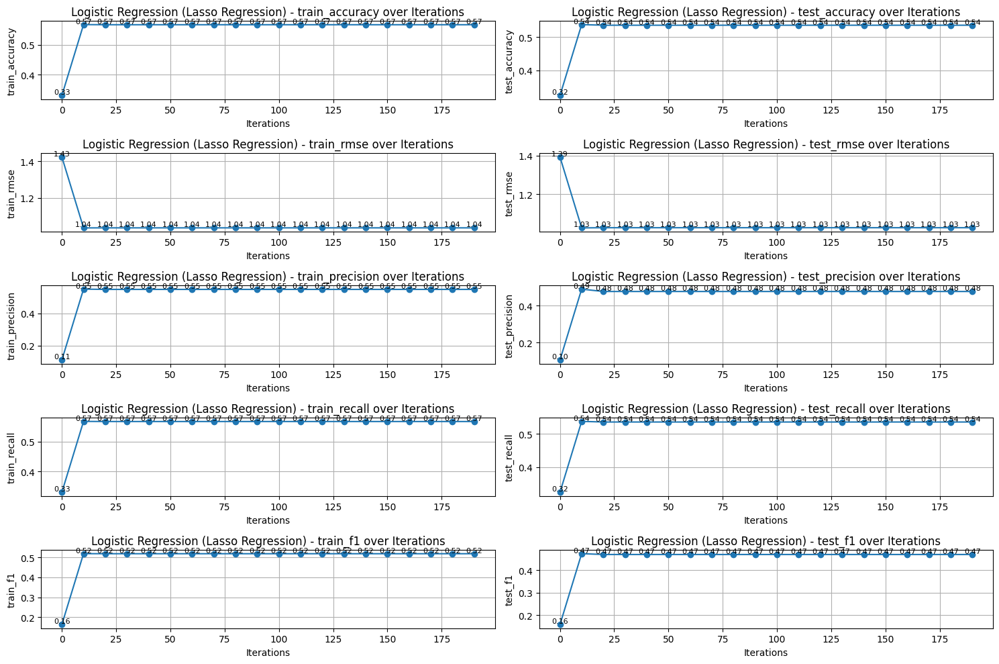

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.5502819548872181, 0.5718984962406015, 0.5714285714285714, 0.5700187969924813, 0.5700187969924813, 0.5737781954887218, 0.5718984962406015, 0.5733082706766918, 0.5728383458646616, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218]
Iterations: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.5338345864661654, 0.5338345864661654, 0.5300751879699248, 0.5375939849624061, 0.5394736842105263, 0.5357142857142857, 0.5375939849624061, 0.5375939849624061, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263]
Iterations: 

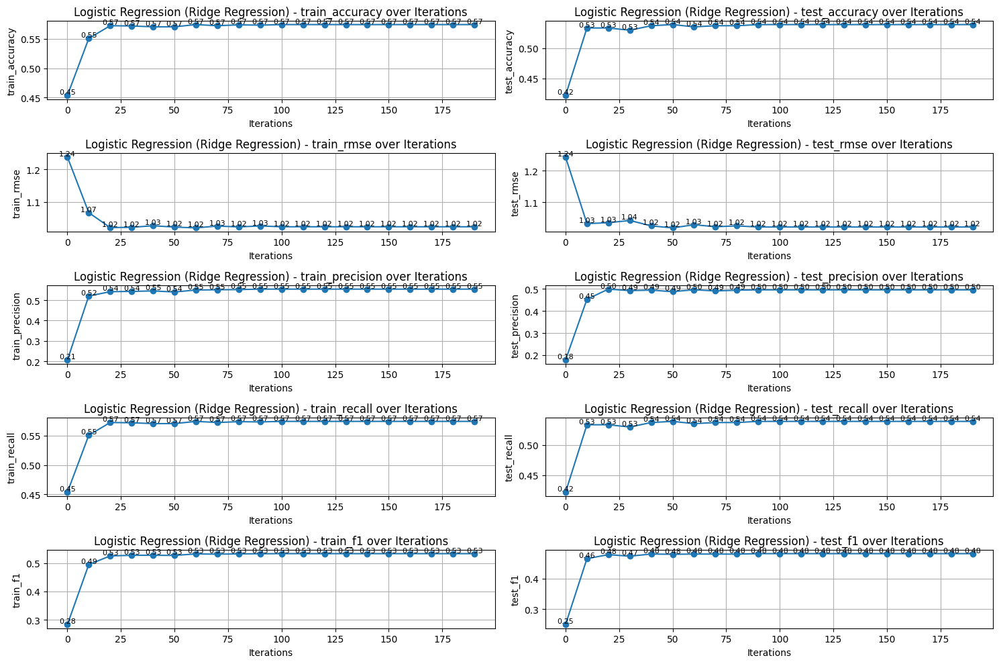

Plotting Metric: train_accuracy
Metric Data: [0.3294172932330827, 0.5671992481203008, 0.5700187969924813, 0.5714285714285714, 0.5714285714285714, 0.5723684210526315, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015, 0.5718984962406015]
Iterations: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.3233082706766917, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061, 0.5375939849624061]
Iterations: [ 

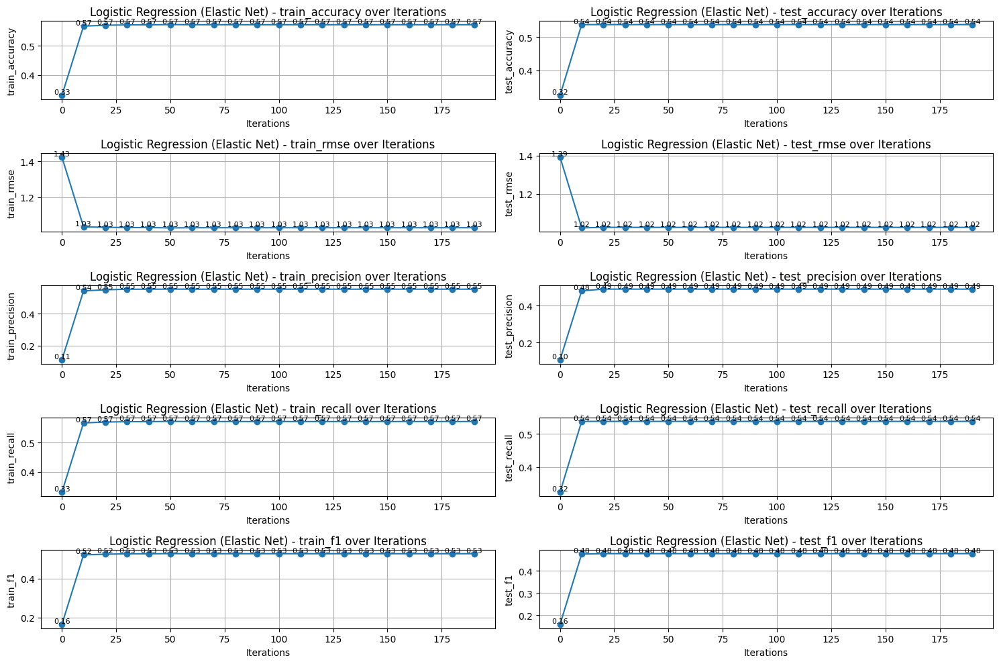

Plotting Metric: train_accuracy
Metric Data: [0.5714285714285714]
Plotting Metric: test_accuracy
Metric Data: [0.5375939849624061]
Plotting Metric: train_rmse
Metric Data: [1.0303204115108755]
Plotting Metric: test_rmse
Metric Data: [1.0241446091500594]
Plotting Metric: train_precision
Metric Data: [0.5546499783888852]
Plotting Metric: test_precision
Metric Data: [0.4847263322903336]
Plotting Metric: train_recall
Metric Data: [0.5714285714285714]
Plotting Metric: test_recall
Metric Data: [0.5375939849624061]
Plotting Metric: train_f1
Metric Data: [0.5242386306129149]
Plotting Metric: test_f1
Metric Data: [0.4743303503208231]


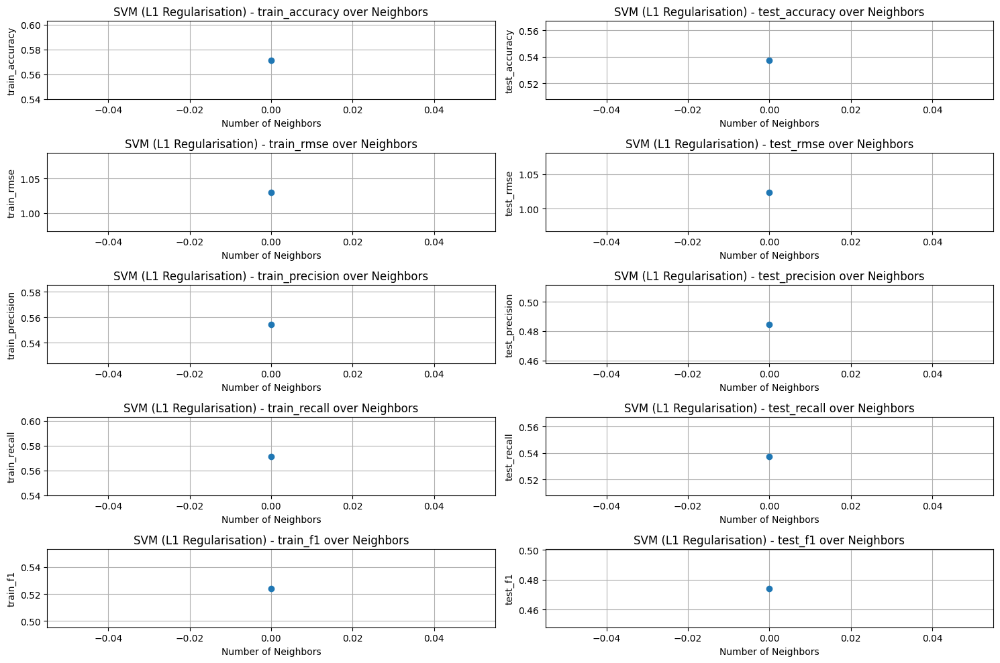

Plotting Metric: train_accuracy
Metric Data: [0.5695488721804511]
Plotting Metric: test_accuracy
Metric Data: [0.5413533834586466]
Plotting Metric: train_rmse
Metric Data: [1.0325983723095058]
Plotting Metric: test_rmse
Metric Data: [1.0112153039671836]
Plotting Metric: train_precision
Metric Data: [0.551538637978688]
Plotting Metric: test_precision
Metric Data: [0.4728173288750734]
Plotting Metric: train_recall
Metric Data: [0.5695488721804511]
Plotting Metric: test_recall
Metric Data: [0.5413533834586466]
Plotting Metric: train_f1
Metric Data: [0.5252801144390687]
Plotting Metric: test_f1
Metric Data: [0.47525285363329006]


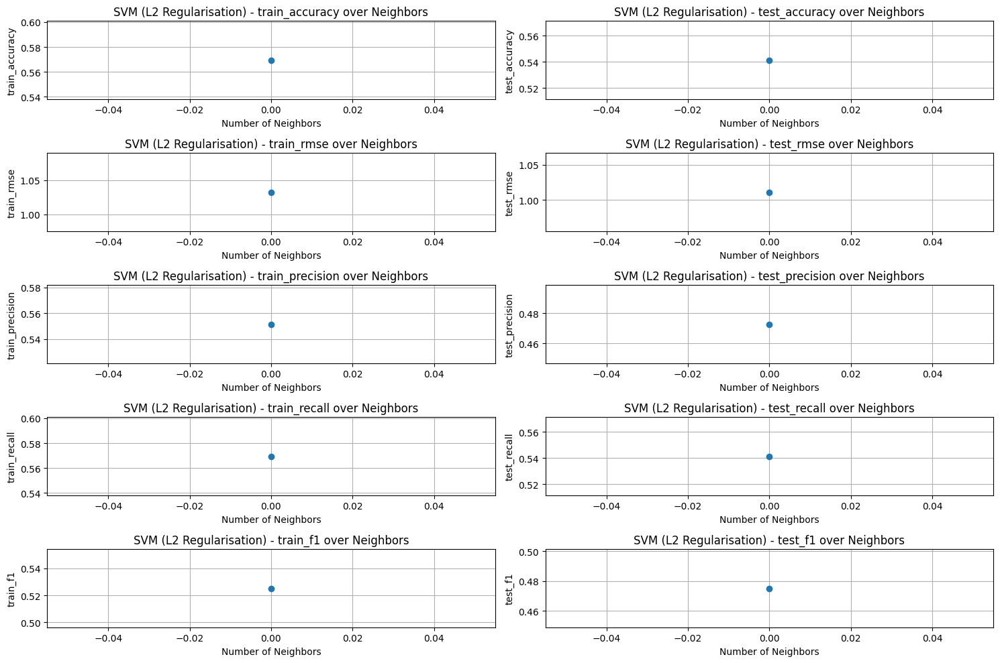

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735]
Plotting Metric: train_rmse
Metric Data: [1.2388601358063893]
Plotting Metric: test_rmse
Metric Data: [1.244536934145037]
Plotting Metric: train_precision
Metric Data: [0.20564179186217424]
Plotting Metric: test_precision
Metric Data: [0.1772853185595568]
Plotting Metric: train_recall
Metric Data: [0.45347744360902253]
Plotting Metric: test_recall
Metric Data: [0.42105263157894735]
Plotting Metric: train_f1
Metric Data: [0.2829652331604958]
Plotting Metric: test_f1
Metric Data: [0.24951267056530213]


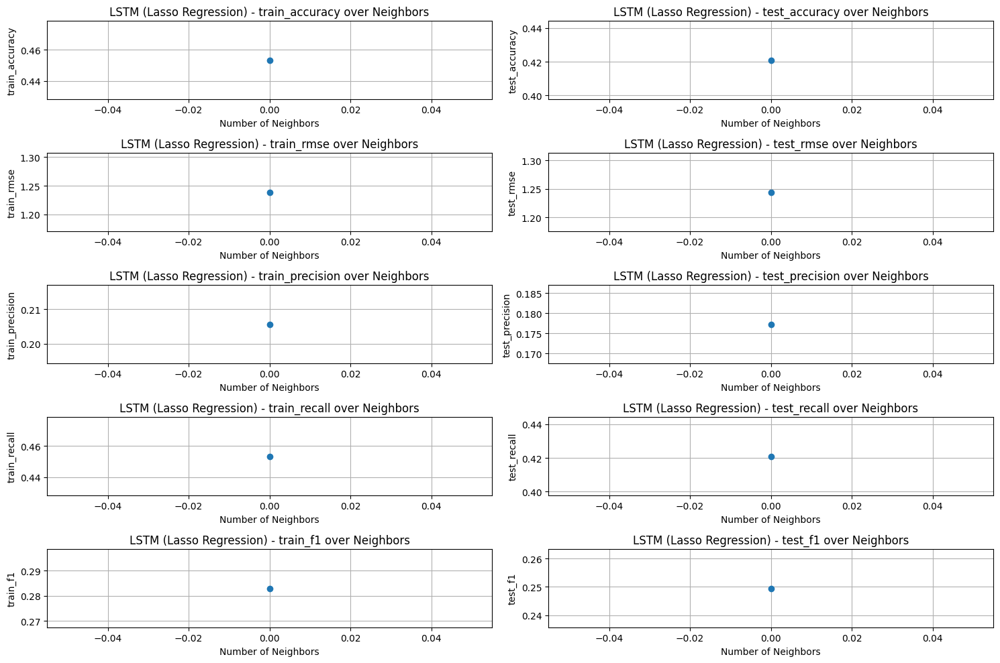

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735]
Plotting Metric: train_rmse
Metric Data: [1.2388601358063893]
Plotting Metric: test_rmse
Metric Data: [1.244536934145037]
Plotting Metric: train_precision
Metric Data: [0.20564179186217424]
Plotting Metric: test_precision
Metric Data: [0.1772853185595568]
Plotting Metric: train_recall
Metric Data: [0.45347744360902253]
Plotting Metric: test_recall
Metric Data: [0.42105263157894735]
Plotting Metric: train_f1
Metric Data: [0.2829652331604958]
Plotting Metric: test_f1
Metric Data: [0.24951267056530213]


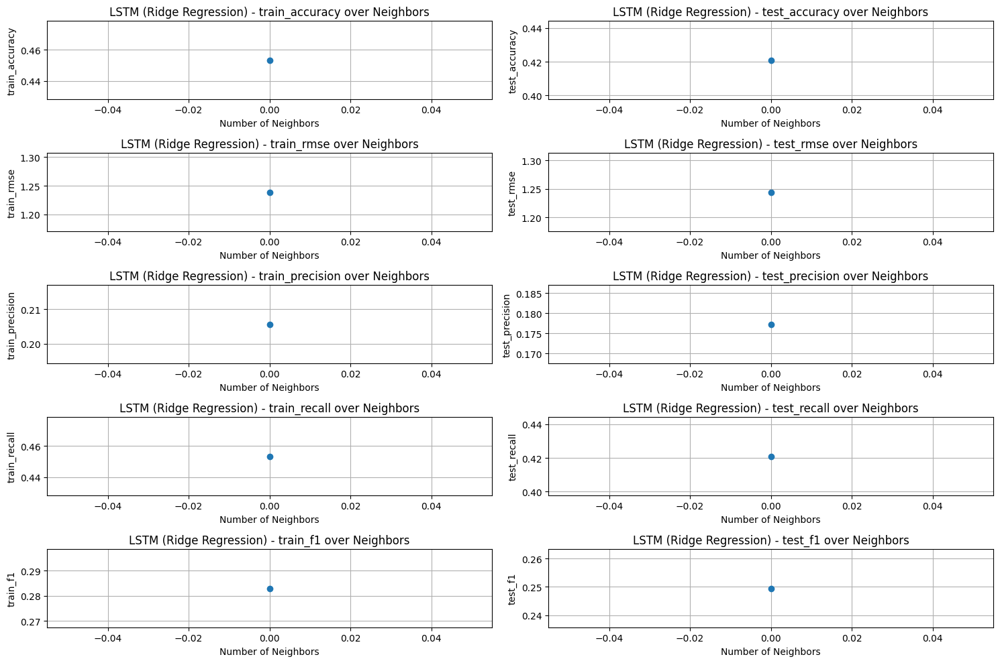

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735]
Plotting Metric: train_rmse
Metric Data: [1.2388601358063893]
Plotting Metric: test_rmse
Metric Data: [1.244536934145037]
Plotting Metric: train_precision
Metric Data: [0.20564179186217424]
Plotting Metric: test_precision
Metric Data: [0.1772853185595568]
Plotting Metric: train_recall
Metric Data: [0.45347744360902253]
Plotting Metric: test_recall
Metric Data: [0.42105263157894735]
Plotting Metric: train_f1
Metric Data: [0.2829652331604958]
Plotting Metric: test_f1
Metric Data: [0.24951267056530213]


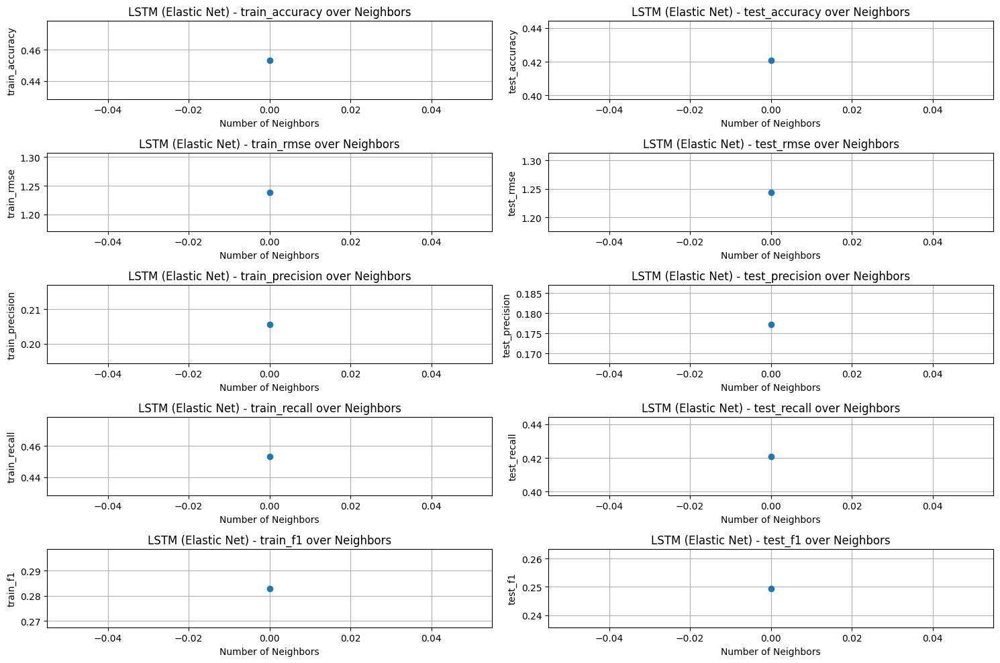

Plotting Metric: train_accuracy
Metric Data: [0.38110902255639095]
Plotting Metric: test_accuracy
Metric Data: [0.34210526315789475]
Plotting Metric: train_rmse
Metric Data: [1.6672148221383754]
Plotting Metric: test_rmse
Metric Data: [1.7008401285415224]
Plotting Metric: train_precision
Metric Data: [0.3504209865445144]
Plotting Metric: test_precision
Metric Data: [0.29150579150579153]
Plotting Metric: train_recall
Metric Data: [0.38110902255639095]
Plotting Metric: test_recall
Metric Data: [0.34210526315789475]
Plotting Metric: train_f1
Metric Data: [0.326563254313309]
Plotting Metric: test_f1
Metric Data: [0.2792356414675228]


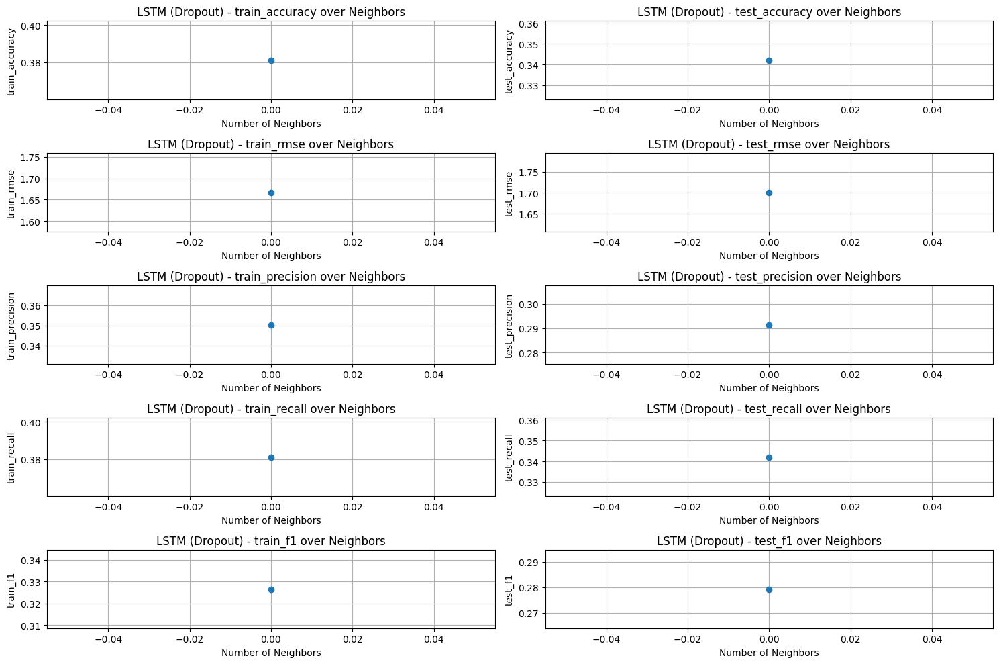

Plotting Metric: train_accuracy
Metric Data: [0.5084586466165414]
Plotting Metric: test_accuracy
Metric Data: [0.4849624060150376]
Plotting Metric: train_rmse
Metric Data: [0.9331509399297251]
Plotting Metric: test_rmse
Metric Data: [0.8864052604279183]
Plotting Metric: train_precision
Metric Data: [0.5661866980730278]
Plotting Metric: test_precision
Metric Data: [0.5381092210360504]
Plotting Metric: train_recall
Metric Data: [0.5084586466165414]
Plotting Metric: test_recall
Metric Data: [0.4849624060150376]
Plotting Metric: train_f1
Metric Data: [0.5225969911441698]
Plotting Metric: test_f1
Metric Data: [0.4993596110919022]


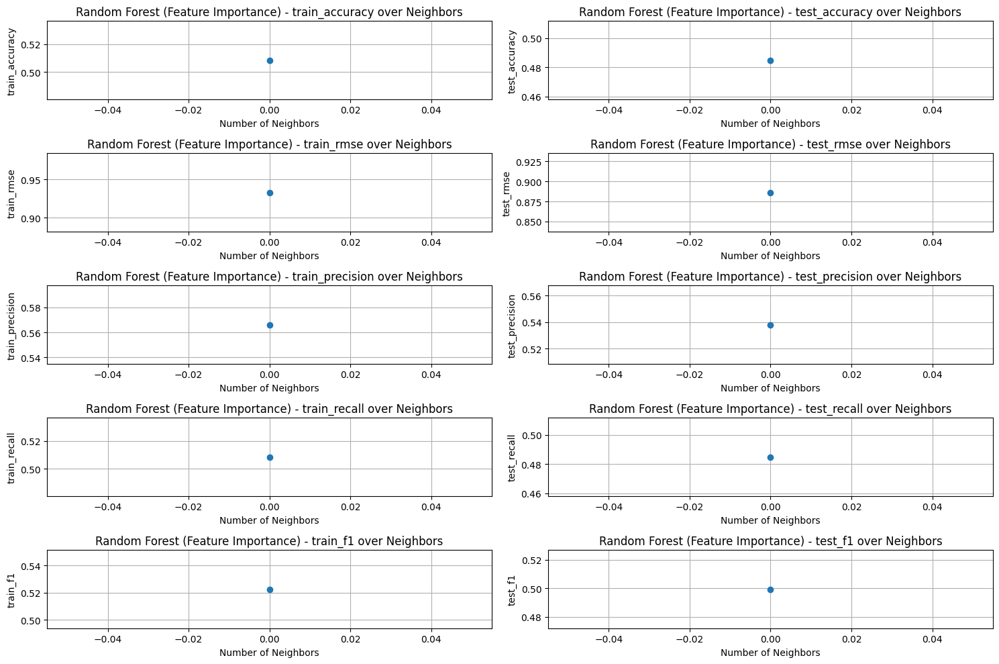

Plotting Metric: train_accuracy
Metric Data: [0.49859022556390975]
Plotting Metric: test_accuracy
Metric Data: [0.47368421052631576]
Plotting Metric: train_rmse
Metric Data: [0.9308820297886615]
Plotting Metric: test_rmse
Metric Data: [0.8864052604279183]
Plotting Metric: train_precision
Metric Data: [0.5690021020088215]
Plotting Metric: test_precision
Metric Data: [0.5358700671316098]
Plotting Metric: train_recall
Metric Data: [0.49859022556390975]
Plotting Metric: test_recall
Metric Data: [0.47368421052631576]
Plotting Metric: train_f1
Metric Data: [0.5132355169422232]
Plotting Metric: test_f1
Metric Data: [0.48840736339019014]


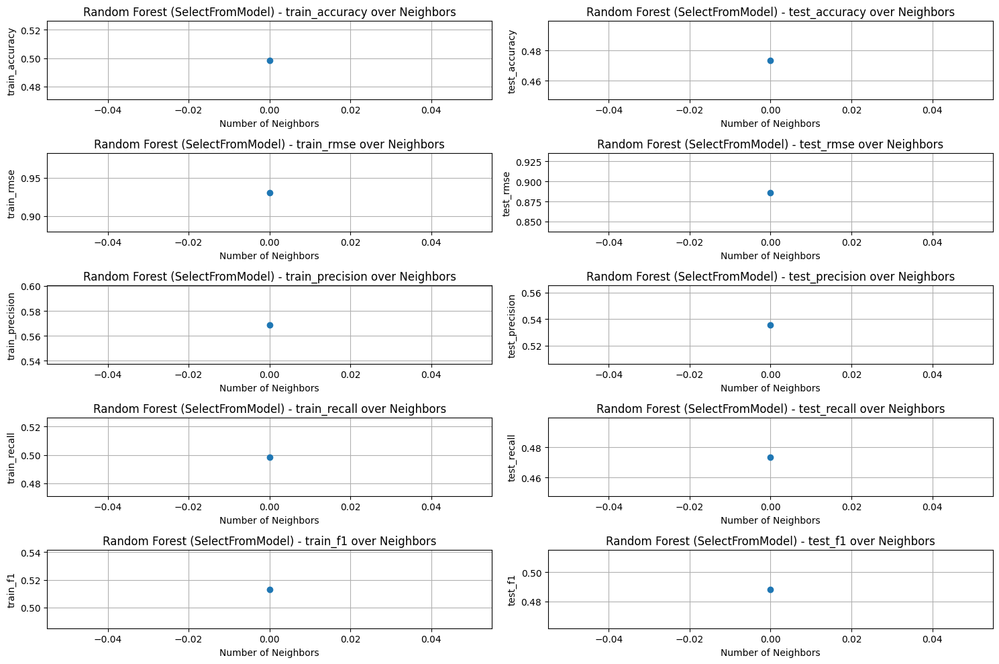

Plotting Metric: train_accuracy
Metric Data: [0.506109022556391]
Plotting Metric: test_accuracy
Metric Data: [0.4774436090225564]
Plotting Metric: train_rmse
Metric Data: [0.9306295871996703]
Plotting Metric: test_rmse
Metric Data: [0.8874649204122979]
Plotting Metric: train_precision
Metric Data: [0.5706547175364791]
Plotting Metric: test_precision
Metric Data: [0.534537548541596]
Plotting Metric: train_recall
Metric Data: [0.506109022556391]
Plotting Metric: test_recall
Metric Data: [0.4774436090225564]
Plotting Metric: train_f1
Metric Data: [0.5203267330272745]
Plotting Metric: test_f1
Metric Data: [0.4921818354862992]


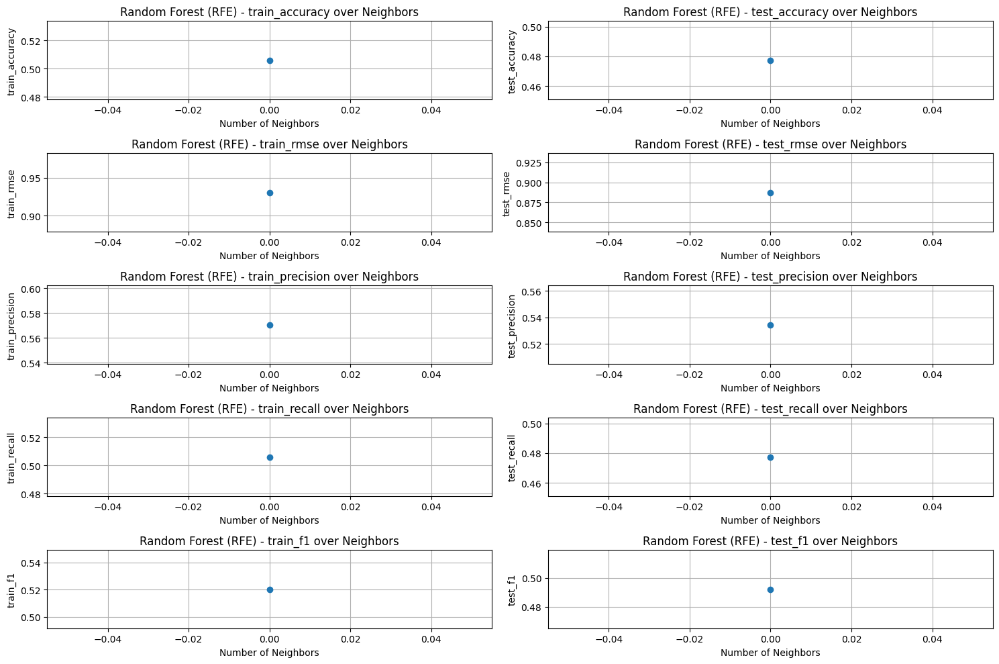

In [253]:
trainer.plot_metrics(metrics_logistic_l1, "Logistic Regression (Lasso Regression)", iterations=iterations)
trainer.plot_metrics(metrics_logistic_l2, "Logistic Regression (Ridge Regression)", iterations=iterations)
trainer.plot_metrics(metrics_logistic_l1_l2, "Logistic Regression (Elastic Net)", iterations=iterations)

trainer.plot_metrics(metrics_svm_l1, "SVM (L1 Regularisation)")
trainer.plot_metrics(metrics_svm_l2, "SVM (L2 Regularisation)")

trainer.plot_metrics(metrics_lstm_l1, "LSTM (Lasso Regression)")
trainer.plot_metrics(metrics_lstm_l2, "LSTM (Ridge Regression)")
trainer.plot_metrics(metrics_lstm_l1_l2, "LSTM (Elastic Net)")
trainer.plot_metrics(metrics_lstm_dropout, "LSTM (Dropout)")

trainer.plot_metrics(metrics_rf_importance, "Random Forest (Feature Importance)")
trainer.plot_metrics(metrics_rf_l1, "Random Forest (SelectFromModel)")
trainer.plot_metrics(metrics_rf_rfe, "Random Forest (RFE)")

Plotting Metric: train_accuracy
Metric Data: [0.45347744360902253, 0.5502819548872181, 0.5718984962406015, 0.5714285714285714, 0.5700187969924813, 0.5700187969924813, 0.5737781954887218, 0.5718984962406015, 0.5733082706766918, 0.5728383458646616, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218, 0.5737781954887218]
Iterations: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.5338345864661654, 0.5338345864661654, 0.5300751879699248, 0.5375939849624061, 0.5394736842105263, 0.5357142857142857, 0.5375939849624061, 0.5375939849624061, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263, 0.5394736842105263]
Iterations: 

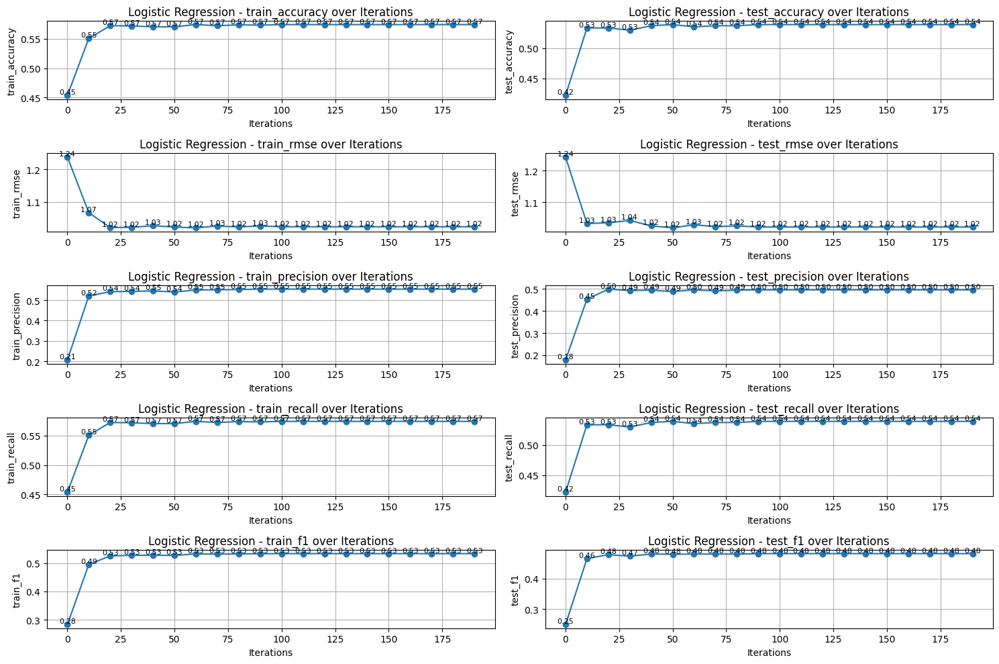

Plotting Metric: train_accuracy
Metric Data: [1.0, 0.6954887218045113, 0.6461466165413534, 0.6146616541353384, 0.6015037593984962, 0.5939849624060151, 0.5972744360902256, 0.5888157894736842, 0.5892857142857143, 0.5770676691729323, 0.5841165413533834, 0.5770676691729323, 0.5728383458646616, 0.5765977443609023, 0.5714285714285714, 0.5615601503759399, 0.5667293233082706, 0.5648496240601504, 0.5620300751879699, 0.5625, 0.5648496240601504, 0.5601503759398496, 0.5596804511278195, 0.5535714285714286, 0.5526315789473685, 0.5512218045112782]
Neighbors Range: [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51]
Plotting Metric: test_accuracy
Metric Data: [0.42105263157894735, 0.4718045112781955, 0.45300751879699247, 0.4830827067669173, 0.4868421052631579, 0.5056390977443609, 0.5112781954887218, 0.5112781954887218, 0.5, 0.4943609022556391, 0.4981203007518797, 0.5169172932330827, 0.5206766917293233, 0.5169172932330827, 0.5225563909774437, 0.5263157894

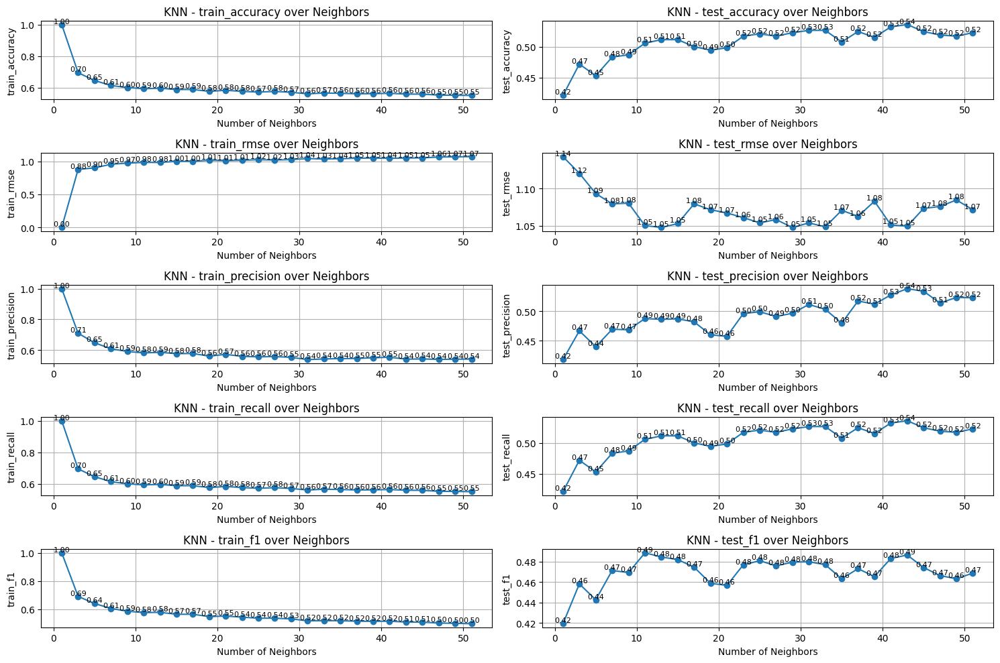

Plotting Metric: train_accuracy
Metric Data: [0.5718984962406015]
Plotting Metric: test_accuracy
Metric Data: [0.5375939849624061]
Plotting Metric: train_rmse
Metric Data: [1.021847802919215]
Plotting Metric: test_rmse
Metric Data: [1.0241446091500594]
Plotting Metric: train_precision
Metric Data: [0.547987419155052]
Plotting Metric: test_precision
Metric Data: [0.5086385867079016]
Plotting Metric: train_recall
Metric Data: [0.5718984962406015]
Plotting Metric: test_recall
Metric Data: [0.5375939849624061]
Plotting Metric: train_f1
Metric Data: [0.5315745993322917]
Plotting Metric: test_f1
Metric Data: [0.48870635769073434]


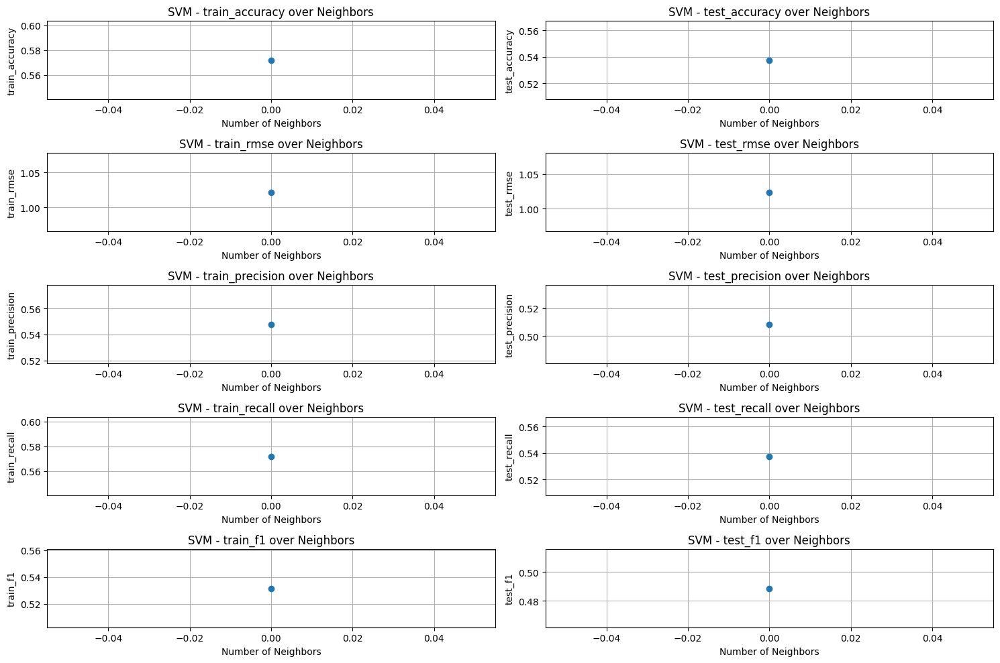

Plotting Metric: train_accuracy
Metric Data: [0.3848684210526316]
Plotting Metric: test_accuracy
Metric Data: [0.34398496240601506]
Plotting Metric: train_rmse
Metric Data: [1.6566112707136937]
Plotting Metric: test_rmse
Metric Data: [1.688639617976108]
Plotting Metric: train_precision
Metric Data: [0.3553219050689833]
Plotting Metric: test_precision
Metric Data: [0.3251764025448236]
Plotting Metric: train_recall
Metric Data: [0.3848684210526316]
Plotting Metric: test_recall
Metric Data: [0.34398496240601506]
Plotting Metric: train_f1
Metric Data: [0.3374164863183643]
Plotting Metric: test_f1
Metric Data: [0.29168045220903854]


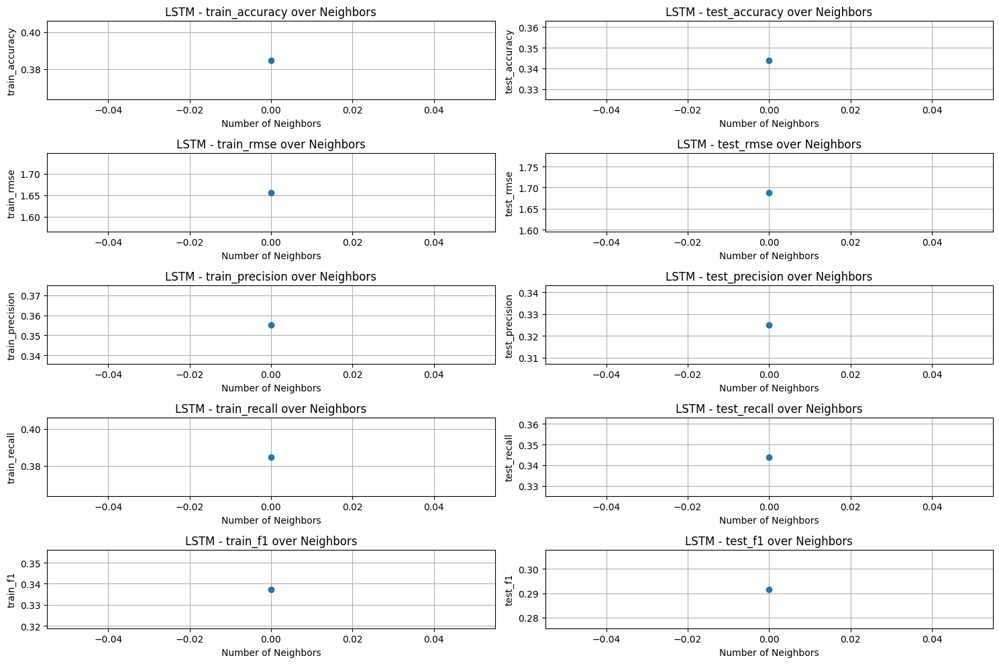

Plotting Metric: train_accuracy
Metric Data: [0.32941729 0.5512218  0.5549812  0.5625     0.55968045 0.5625
 0.56015038 0.5718985  0.56672932 0.57612782 0.57941729 0.57424812
 0.57800752 0.58317669 0.58458647 0.58975564 0.58928571 0.58975564
 0.59351504 0.59680451]
Iterations: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: test_accuracy
Metric Data: [0.32330827 0.52067669 0.53195489 0.53759398 0.53947368 0.53007519
 0.52443609 0.53195489 0.53383459 0.52819549 0.53195489 0.53383459
 0.52819549 0.52255639 0.51503759 0.52819549 0.52067669 0.52255639
 0.52443609 0.53007519]
Iterations: [  0  10  20  30  40  50  60  70  80  90 100 110 120 130 140 150 160 170
 180 190]
Plotting Metric: train_rmse
Metric Data: [1.42513685 1.07277484 1.063757   1.05220856 1.05555281 1.05153844
 1.05466205 1.0416604  1.04683555 1.03282589 1.02712278 1.0357791
 1.02849441 1.02115775 1.02322651 1.01237642 1.01399975 1.01515768
 1.00422042 1.00046981]
Iterations

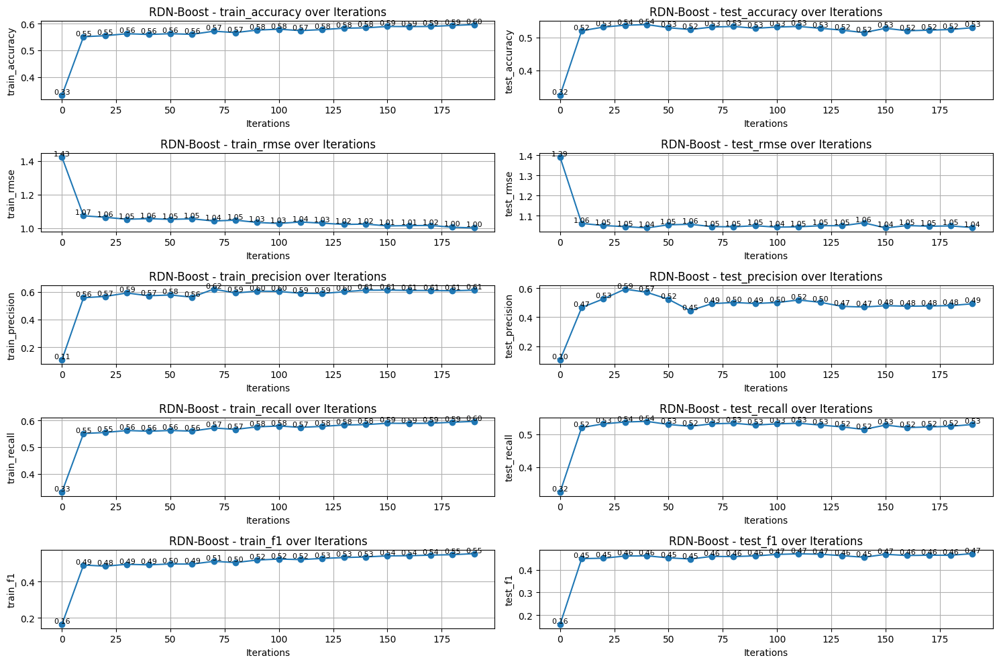

Plotting Metric: train_accuracy
Metric Data: [0.4492481203007519, 0.4924812030075188, 0.49530075187969924, 0.4967105263157895, 0.49906015037593987, 0.49906015037593987, 0.4948308270676692]
Iterations: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_accuracy
Metric Data: [0.45300751879699247, 0.5, 0.4981203007518797, 0.4981203007518797, 0.5037593984962406, 0.5018796992481203, 0.4981203007518797]
Iterations: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_rmse
Metric Data: [0.9459053029269173, 1.0519852338939113, 1.0499731468102202, 1.047284350727249, 1.0501969024114415, 1.0421114338694801, 1.0454879783058029]
Iterations: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: test_rmse
Metric Data: [0.910465468000326, 1.0396283315056265, 1.0432381629626353, 1.040531963428944, 1.0513149660756937, 1.038723913473187, 1.040531963428944]
Iterations: [10, 50, 100, 150, 200, 250, 300]
Plotting Metric: train_precision
Metric Data: [0.5273348390445236, 0.4892714259971851, 0.491637132

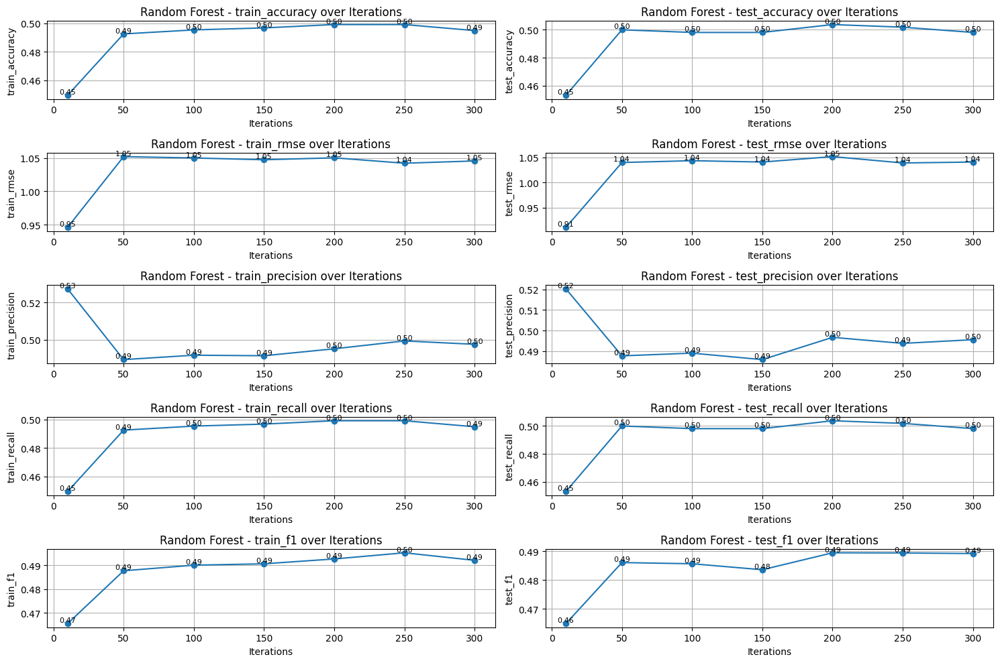

In [ ]:
# Plotting Metrics for all Models
rf_estimators_range = [10, 50, 100, 150, 200, 250, 300]
trainer.plot_metrics(metrics_logistic, "Logistic Regression", iterations=iterations)
trainer.plot_metrics(metrics_knn, "KNN", neighbors_range=neighbors_range)
trainer.plot_metrics(metrics_svm, "SVM")
trainer.plot_metrics(metrics_lstm, "LSTM")
trainer.plot_metrics(metrics_rdnboost, "RDN-Boost", iterations=iterations)
trainer.plot_metrics(metrics_rf, "Random Forest", rf_estimators_range)

## K-Fold Validation

In [ ]:
missing_features = ['Home Team', 'Match Outcome', 'Date'] # removed during feature selection

logistic_df = df[missing_features + logistic_features]
knn_df = df[missing_features + knn_features]
svm_df = df[missing_features + svm_features]
lstm_df = df[missing_features + lstm_features]
rf_df = df[missing_features + rf_features]
rdnboost_df = df.copy()
# encoding and standardising for each of the four feature sets
logistic_df = encode_teams(logistic_df)
knn_df = encode_teams(knn_df)
svm_df = encode_teams(svm_df)
lstm_df = encode_teams(lstm_df)
rf_df = encode_teams(rf_df)
rdnboost_df = encode_teams(rdnboost_df)


logistic_df = standardize_features(logistic_df, logistic_features)
knn_df = standardize_features(knn_df, knn_features)
svm_df = standardize_features(svm_df, svm_features)
lstm_df = standardize_features(lstm_df, lstm_features)
rf_df = standardize_features(rf_df, rf_features)
rdnboost_df = standardize_features(rdnboost_df, None)

# split the data into X (data) and y (target) for training and testing
logistic_train_df, logistic_test_df = chronological_split(logistic_df)
knn_train_df, knn_test_df = chronological_split(knn_df)
svm_train_df, svm_test_df = chronological_split(svm_df)
lstm_train_df, lstm_test_df = chronological_split(lstm_df)
rf_train_df, rf_test_df = chronological_split(rf_df)
rdnboost_train_df, rdnboost_test_df = chronological_split(rdnboost_df)

logistic_X_train, logistic_y_train = logistic_train_df.drop('Match Outcome', axis=1), logistic_train_df['Match Outcome']
logistic_X_test, logistic_y_test = logistic_test_df.drop('Match Outcome', axis=1), logistic_test_df['Match Outcome']

knn_X_train, knn_y_train = knn_train_df.drop('Match Outcome', axis=1), knn_train_df['Match Outcome']
knn_X_test, knn_y_test = knn_test_df.drop('Match Outcome', axis=1), knn_test_df['Match Outcome']

svm_X_train, svm_y_train = svm_train_df.drop('Match Outcome', axis=1), svm_train_df['Match Outcome']
svm_X_test, svm_y_test = svm_test_df.drop('Match Outcome', axis=1), svm_test_df['Match Outcome']

lstm_X_train, lstm_y_train = lstm_train_df.drop('Match Outcome', axis=1), lstm_train_df['Match Outcome']
lstm_X_test, lstm_y_test = lstm_test_df.drop('Match Outcome', axis=1), lstm_test_df['Match Outcome']

rf_X_train, rf_y_train = rf_train_df.drop('Match Outcome', axis=1), rf_train_df['Match Outcome']
rf_X_test, rf_y_test = rf_test_df.drop('Match Outcome', axis=1), rf_test_df['Match Outcome']

rdnboost_X_train, rdnboost_y_train = rdnboost_train_df.drop('Match Outcome', axis=1), rdnboost_train_df['Match Outcome']
rdnboost_X_test, rdnboost_y_test = rdnboost_test_df.drop('Match Outcome', axis=1), rdnboost_test_df['Match Outcome']



In [ ]:
class KFoldModelWrapper:
    def __init__(self, n_splits=5, random_state=42):
        self.n_splits = n_splits
        self.kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
        
    def evaluate_model(self, model_fn, X, y, **model_params):
        # model_fn creates and returnas model
        # X; features dataframe
        # y; target array
        
        fold_metrics = {
            'accuracy': [],
            'precision': [],
            'recall': [],
            'f1': [],
            'rmse': []
        }
        
        for fold, (train_idx, val_idx) in enumerate(self.kf.split(X), 1):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
            
            # Create and train model
            model = model_fn(**model_params)
            model.fit(X_train, y_train)
            
            # Get predictions
            y_pred = model.predict(X_val)
            
            # Calculate metrics
            fold_metrics['accuracy'].append(accuracy_score(y_val, y_pred))
            precision, recall, f1, _ = precision_recall_fscore_support(y_val, y_pred, average='weighted')
            fold_metrics['precision'].append(precision)
            fold_metrics['recall'].append(recall)
            fold_metrics['f1'].append(f1)
            fold_metrics['rmse'].append(np.sqrt(np.mean((y_val - y_pred) ** 2)))
            
            print(f"\nFold {fold} Results:")
            print(f"Accuracy: {fold_metrics['accuracy'][-1]:.4f}")
            print(f"Precision: {fold_metrics['precision'][-1]:.4f}")
            print(f"Recall: {fold_metrics['recall'][-1]:.4f}")
            print(f"F1: {fold_metrics['f1'][-1]:.4f}")
            print(f"RMSE: {fold_metrics['rmse'][-1]:.4f}")
        
        # Calculate and store averages
        avg_metrics = {
            'avg_accuracy': np.mean(fold_metrics['accuracy']),
            'std_accuracy': np.std(fold_metrics['accuracy']),
            'avg_precision': np.mean(fold_metrics['precision']),
            'std_precision': np.std(fold_metrics['precision']),
            'avg_recall': np.mean(fold_metrics['recall']),
            'std_recall': np.std(fold_metrics['recall']),
            'avg_f1': np.mean(fold_metrics['f1']),
            'std_f1': np.std(fold_metrics['f1']),
            'avg_rmse': np.mean(fold_metrics['rmse']),
            'std_rmse': np.std(fold_metrics['rmse'])
        }
        
        return fold_metrics, avg_metrics

    def plot_kfold_results(self, fold_metrics, model_name):
        """
        Plots the k-fold validation results
        """
        metrics = ['accuracy', 'precision', 'recall', 'f1', 'rmse']
        plt.figure(figsize=(15, 10))
        
        for i, metric in enumerate(metrics, 1):
            plt.subplot(3, 2, i)
            values = fold_metrics[metric]
            plt.plot(range(1, len(values) + 1), values, 'bo-')
            plt.axhline(y=np.mean(values), color='r', linestyle='--', 
                       label=f'Mean: {np.mean(values):.3f}')
            plt.fill_between(range(1, len(values) + 1), 
                           np.mean(values) - np.std(values),
                           np.mean(values) + np.std(values),
                           alpha=0.2, color='r')
            plt.title(f'{model_name} - {metric.upper()} across folds')
            plt.xlabel('Fold')
            plt.ylabel(metric.capitalize())
            plt.legend()
        
        plt.tight_layout()
        plt.show()

In [ ]:
# Initialize the wrapper
kfold_wrapper = KFoldModelWrapper(n_splits=5)  

def create_logistic():
    return LogisticRegression(random_state=42)

def create_svm():
    return SVC(kernel='linear', random_state=42)

def create_knn():
    return KNeighborsClassifier(n_neighbors=5)

def create_rf():
    return RandomForestClassifier(n_estimators=100, random_state=42)

# THESE SHUD MATCH THE PREV ONES!
def create_rdnboost():
    return RDNBoost(
        n_estimators=100,  
        learning_rate=0.1,
        max_depth=3,
        random_state=42
    )

models = {
    'Logistic Regression': (create_logistic, logistic_X_train, logistic_y_train),
    'SVM': (create_svm, svm_X_train, svm_y_train),
    'KNN': (create_knn, knn_X_train, knn_y_train),
    'Random Forest': (create_rf, rf_X_train, rf_y_train),
    'RDNBoost': (create_rdnboost, rdnboost_X_train, rdnboost_y_train)
}

results = {}
for model_name, (model_fn, X, y) in models.items():
    print(f"\nEvaluating {model_name}...")
    fold_metrics, avg_metrics = kfold_wrapper.evaluate_model(model_fn, X, y)
    results[model_name] = (fold_metrics, avg_metrics)
    
    # Plot results
    kfold_wrapper.plot_kfold_results(fold_metrics, model_name)
    
    print(f"\n{model_name} Average Results:")
    for metric, value in avg_metrics.items():
        print(f"{metric}: {value:.4f}")